In [ ]:
pip install pandas

In [ ]:
import pandas as pd

# Replace 'your_file.xlsx' with the path to your Excel file
file_path = '/content/Why are suicide rates so high for men worldwide.xlsx'

# Read Excel file into a DataFrame
df = pd.read_excel(file_path)

# Now, 'df' contains your Excel data
print(df)


     Row Labels  Average of Male suicide rate (age-standardized)  \
0          1990                                        18.705217   
1          1991                                        18.847283   
2          1992                                        19.145870   
3          1993                                        19.692065   
4          1994                                        20.053587   
5          1995                                        20.115652   
6          1996                                        19.842283   
7          1997                                        19.724457   
8          1998                                        19.682174   
9          1999                                        19.549891   
10         2000                                        19.485652   
11         2001                                        19.348804   
12         2002                                        19.196522   
13         2003                                 

In [ ]:
# Create an empty dictionary to store data frames from each sheet
data_frames = {}

# Read each sheet into a separate data frame
xls = pd.ExcelFile(file_path)
for sheet_name in xls.sheet_names:
    data_frames[sheet_name] = xls.parse(sheet_name)

# Now, 'data_frames' is a dictionary where each key is a sheet name, and the corresponding value is a DataFrame containing the data from that sheet.

# You can access and analyze the data frames for each sheet as needed.
for sheet_name, df in data_frames.items():
    print(f"Data from sheet '{sheet_name}':")
    print(df)

Data from sheet 'male-vs-female-suicide.csv':
     Row Labels  Average of Male suicide rate (age-standardized)  \
0          1990                                        18.705217   
1          1991                                        18.847283   
2          1992                                        19.145870   
3          1993                                        19.692065   
4          1994                                        20.053587   
5          1995                                        20.115652   
6          1996                                        19.842283   
7          1997                                        19.724457   
8          1998                                        19.682174   
9          1999                                        19.549891   
10         2000                                        19.485652   
11         2001                                        19.348804   
12         2002                                        19.196522   
13

In [ ]:
for sheet_name, df in data_frames.items():
    print(f"Data from sheet '{sheet_name}':")
    print(df.head())  # Display the first few rows to get a sense of the data
    print(df.info())  # Summary of data types and non-null counts
    print(df.describe())  # Basic statistics

Data from sheet 'male-vs-female-suicide.csv':
  Row Labels  Average of Male suicide rate (age-standardized)  \
0       1990                                        18.705217   
1       1991                                        18.847283   
2       1992                                        19.145870   
3       1993                                        19.692065   
4       1994                                        20.053587   

   Average of Female suicide rate (age-standardized)  
0                                           6.978913  
1                                           6.932283  
2                                           6.966196  
3                                           6.973043  
4                                           6.957826  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29 entries, 0 to 28
Data columns (total 3 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                        

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

for sheet_name, df in data_frames.items():
    # Replace 'Your_Column_Name' with the actual column name from your data
    column_name = 'Your_Column_Name'

    # Check if the column exists in the DataFrame
    if column_name in df.columns:
        sns.histplot(data=df, x=column_name, kde=True)
        plt.title(f'Histogram for {sheet_name}')
        plt.show()
    else:
        print(f"Column '{column_name}' not found in sheet '{sheet_name}'.")

Column 'Your_Column_Name' not found in sheet 'male-vs-female-suicide.csv'.
Column 'Your_Column_Name' not found in sheet 'male-vs-female-suicide-with-dep'.
Column 'Your_Column_Name' not found in sheet 'marriage-rate-per-1000-inhabita'.
Column 'Your_Column_Name' not found in sheet 'prevalence_by_mental_and_substa'.


In [ ]:
for sheet_name, df in data_frames.items():
    print(f"Columns in sheet '{sheet_name}':")
    print(df.columns)


Columns in sheet 'male-vs-female-suicide.csv':
Index(['Row Labels', 'Average of Male suicide rate (age-standardized)',
       'Average of Female suicide rate (age-standardized)'],
      dtype='object')
Columns in sheet 'male-vs-female-suicide-with-dep':
Index(['Row Labels', 'Average of depression prevalance in males ',
       'Average of Male suicide rate (age-standardized)'],
      dtype='object')
Columns in sheet 'marriage-rate-per-1000-inhabita':
Index(['Entity', 'Code', 'Year',
       'Crude marriage rate (per 1,000 inhabitants)'],
      dtype='object')
Columns in sheet 'prevalence_by_mental_and_substa':
Index(['entity', 'code', 'year', 'schizophrenia', 'bipolar_disorder',
       'eating_disorders', 'anxiety_disorders', 'drug_use_disorders',
       'depression', 'alcohol_use_disorders'],
      dtype='object')


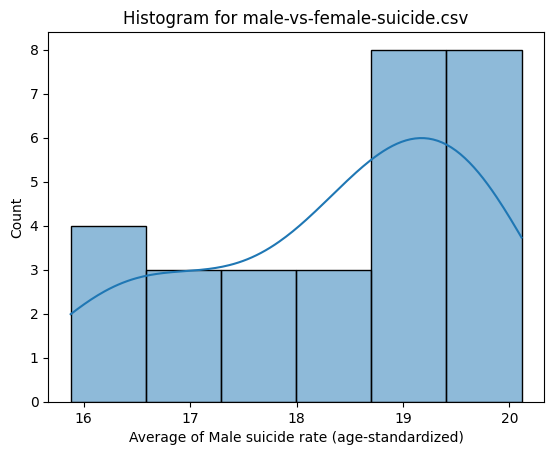

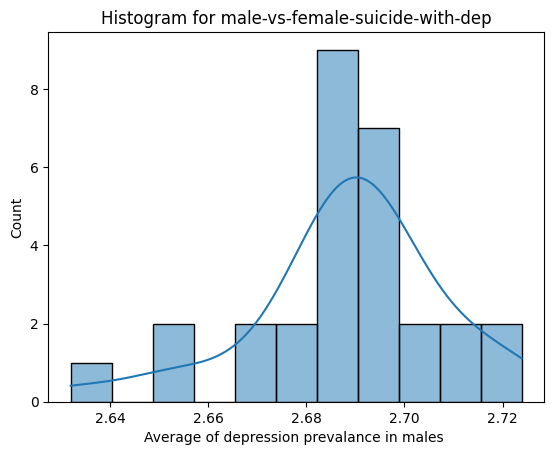

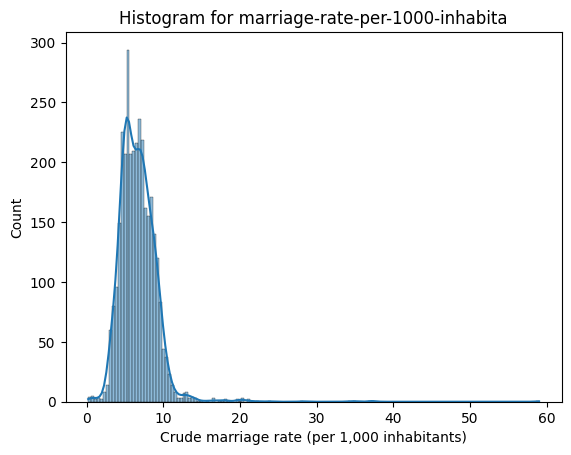

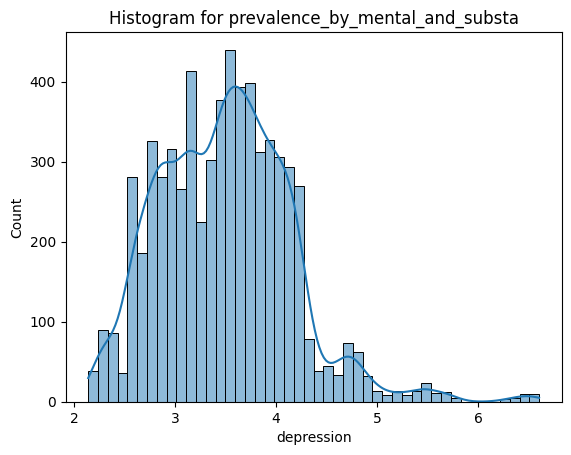

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

for sheet_name, df in data_frames.items():
    # Specify the actual column names from your data
    if sheet_name == 'male-vs-female-suicide.csv':
        column_name = 'Average of Male suicide rate (age-standardized)'
    elif sheet_name == 'male-vs-female-suicide-with-dep':
        column_name = 'Average of depression prevalance in males '
    elif sheet_name == 'marriage-rate-per-1000-inhabita':
        column_name = 'Crude marriage rate (per 1,000 inhabitants)'
    elif sheet_name == 'prevalence_by_mental_and_substa':
        column_name = 'depression'

    # Create histograms for the specified columns
    if column_name in df.columns:
        sns.histplot(data=df, x=column_name, kde=True)
        plt.title(f'Histogram for {sheet_name}')
        plt.show()
    else:
        print(f"Column '{column_name}' not found in sheet '{sheet_name}'.")


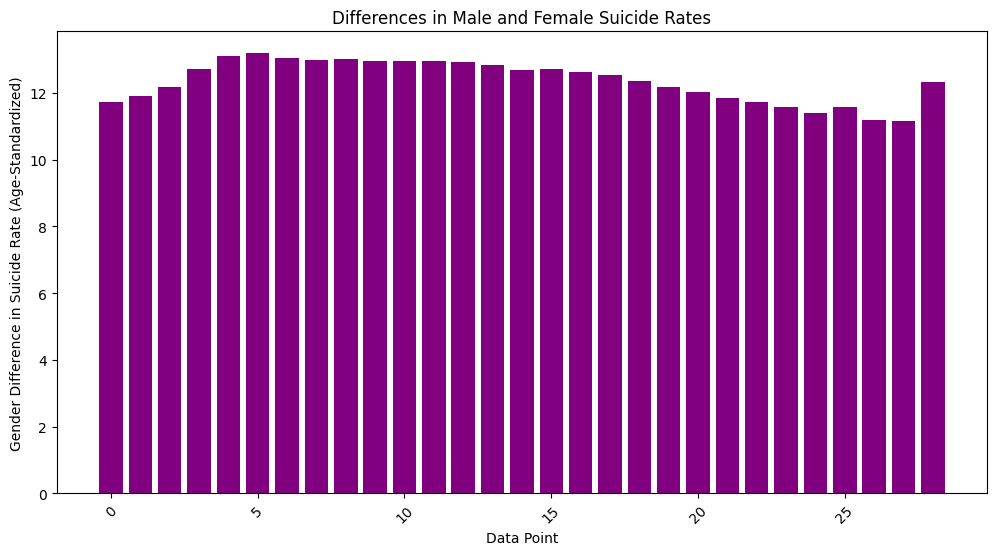

Correlation between male and female suicide rates: 0.94


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data from an Excel workbook
xls = pd.ExcelFile('/content/Why are suicide rates so high for men worldwide.xlsx')  # Replace 'your_data.xlsx' with the actual file path

# Load the specific sheet with the CSV data
data = pd.read_excel(xls, sheet_name='male-vs-female-suicide.csv')

# Calculate the average difference in suicide rates between genders
data['Gender_Difference'] = data['Average of Male suicide rate (age-standardized)'] - data['Average of Female suicide rate (age-standardized)']

# Plot the differences in male and female suicide rates
plt.figure(figsize=(12, 6))
plt.bar(data.index, data['Gender_Difference'], color='purple')
plt.title('Differences in Male and Female Suicide Rates')
plt.xlabel('Data Point')
plt.ylabel('Gender Difference in Suicide Rate (Age-Standardized)')
plt.xticks(rotation=45)
plt.show()

# Investigate the correlation between male and female suicide rates
correlation = data['Average of Male suicide rate (age-standardized)'].corr(data['Average of Female suicide rate (age-standardized)'])
print(f'Correlation between male and female suicide rates: {correlation:.2f}')


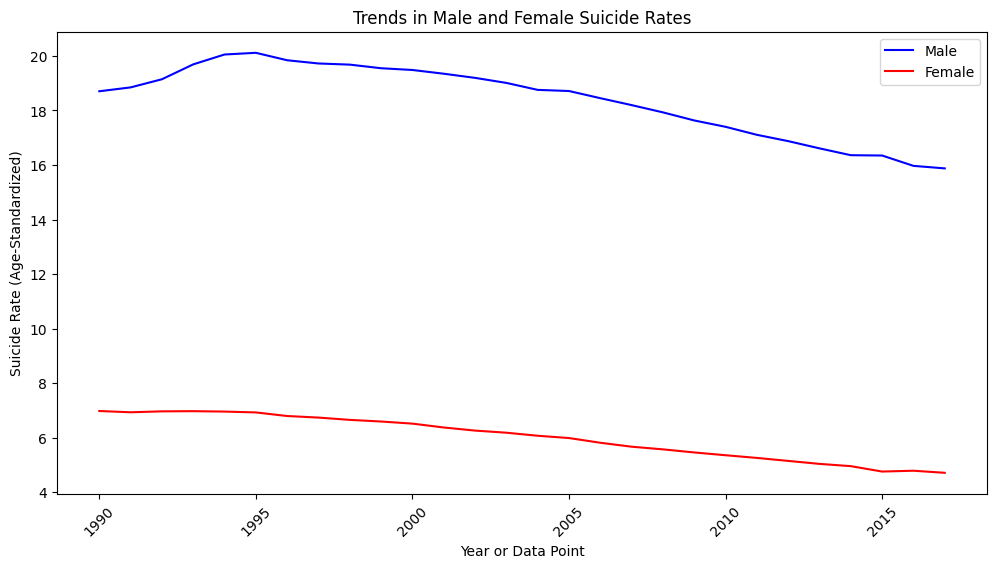

Year with the highest male suicide rate: 1995
Year with the lowest male suicide rate: 2017
Year with the highest female suicide rate: 1990
Year with the lowest female suicide rate: 2017
Correlation between male and female suicide rates: 0.94


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data from an Excel workbook
xls = pd.ExcelFile('/content/Why are suicide rates so high for men worldwide.xlsx')  # Replace 'your_data.xlsx' with the actual file path

# Load the specific sheet with the CSV data
data = pd.read_excel(xls, sheet_name='male-vs-female-suicide.csv')

# Filter out non-numeric rows based on 'Row Labels' column
data = data[pd.to_numeric(data['Row Labels'], errors='coerce').notna()]

# Calculate the average difference in suicide rates between genders
data['Gender_Difference'] = data['Average of Male suicide rate (age-standardized)'] - data['Average of Female suicide rate (age-standardized)']

# Calculate the year with the highest and lowest male suicide rate
year_with_highest_male_suicide_rate = data.loc[data['Average of Male suicide rate (age-standardized)'].idxmax(), 'Row Labels']
year_with_lowest_male_suicide_rate = data.loc[data['Average of Male suicide rate (age-standardized)'].idxmin(), 'Row Labels']

# Calculate the year with the highest and lowest female suicide rate
year_with_highest_female_suicide_rate = data.loc[data['Average of Female suicide rate (age-standardized)'].idxmax(), 'Row Labels']
year_with_lowest_female_suicide_rate = data.loc[data['Average of Female suicide rate (age-standardized)'].idxmin(), 'Row Labels']

# Investigate the correlation between male and female suicide rates
correlation = data['Average of Male suicide rate (age-standardized)'].corr(data['Average of Female suicide rate (age-standardized)'])

# Plot the trends in male and female suicide rates (if applicable)
plt.figure(figsize=(12, 6))
plt.plot(data['Row Labels'], data['Average of Male suicide rate (age-standardized)'], label='Male', color='blue')
plt.plot(data['Row Labels'], data['Average of Female suicide rate (age-standardized)'], label='Female', color='red')
plt.title('Trends in Male and Female Suicide Rates')
plt.xlabel('Year or Data Point')
plt.ylabel('Suicide Rate (Age-Standardized)')
plt.legend()
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

# Print the results
print(f'Year with the highest male suicide rate: {year_with_highest_male_suicide_rate}')
print(f'Year with the lowest male suicide rate: {year_with_lowest_male_suicide_rate}')
print(f'Year with the highest female suicide rate: {year_with_highest_female_suicide_rate}')
print(f'Year with the lowest female suicide rate: {year_with_lowest_female_suicide_rate}')
print(f'Correlation between male and female suicide rates: {correlation:.2f}')


In [ ]:
import pandas as pd

# Load the data from an Excel workbook
xls = pd.ExcelFile('/content/Why are suicide rates so high for men worldwide.xlsx')

# Load the specific sheet with the relevant data
data = pd.read_excel(xls, sheet_name='male-vs-female-suicide-with-dep')

# Print the available column names
print(data.columns)


Index(['Row Labels', 'Average of depression prevalance in males ',
       'Average of Male suicide rate (age-standardized)'],
      dtype='object')


Correlation between depression prevalence in males and male suicide rates: 0.23


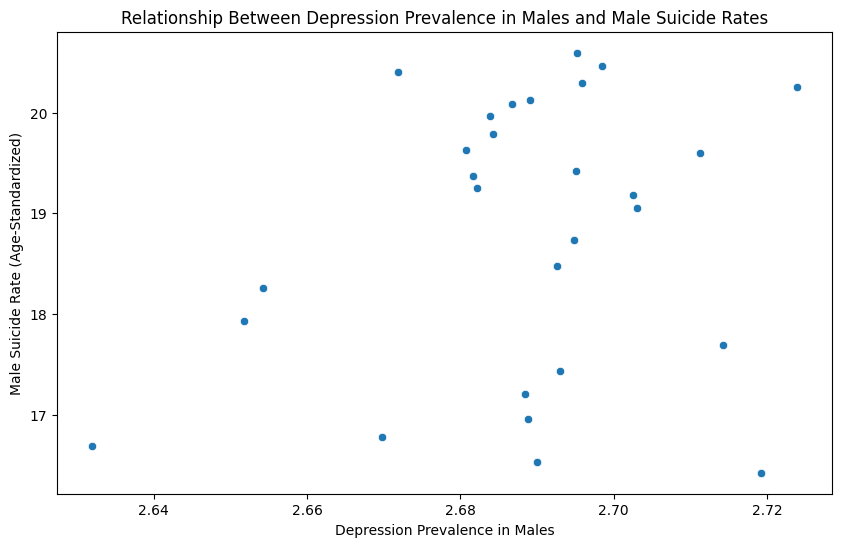

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data from an Excel workbook
xls = pd.ExcelFile('/content/Why are suicide rates so high for men worldwide.xlsx')

# Load the specific sheet with the relevant data
data = pd.read_excel(xls, sheet_name='male-vs-female-suicide-with-dep')

# Filter out rows with 'Grand Total' in the 'Row Labels' column
data = data[data['Row Labels'] != 'Grand Total']

# Calculate the correlation between depression prevalence and male suicide rates
correlation = data['Average of depression prevalance in males '].corr(data['Average of Male suicide rate (age-standardized)'])

# Create a scatter plot to visualize the relationship
plt.figure(figsize=(10, 6))
sns.scatterplot(data=data, x='Average of depression prevalance in males ', y='Average of Male suicide rate (age-standardized)')
plt.title('Relationship Between Depression Prevalence in Males and Male Suicide Rates')
plt.xlabel('Depression Prevalence in Males')
plt.ylabel('Male Suicide Rate (Age-Standardized)')

# Identify trends or patterns over time (if applicable)
# You may consider using a time-related column if available in your dataset

# Print the results
print(f'Correlation between depression prevalence in males and male suicide rates: {correlation:.2f}')

plt.show()


Correlation between depression prevalence in males and male suicide rates: 0.23


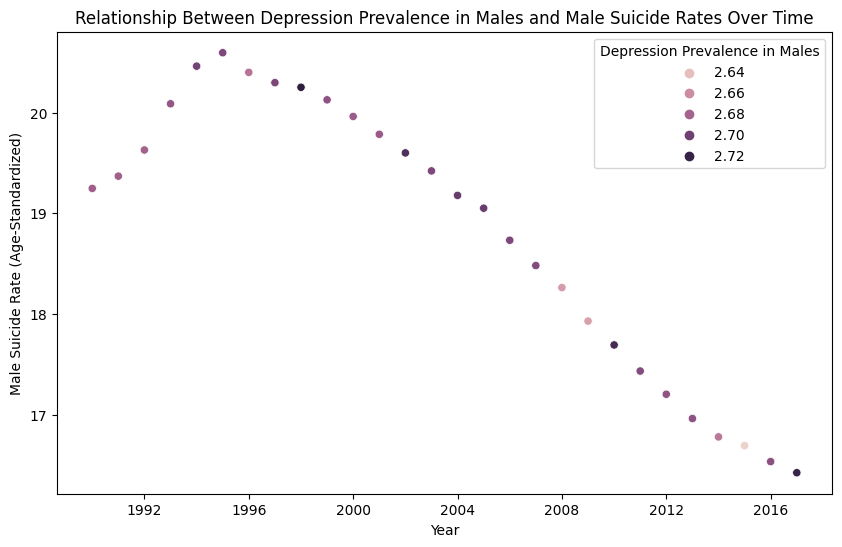

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data from an Excel workbook
xls = pd.ExcelFile('/content/Why are suicide rates so high for men worldwide.xlsx')

# Load the specific sheet with the relevant data
data = pd.read_excel(xls, sheet_name='male-vs-female-suicide-with-dep')

# Filter out rows with 'Grand Total' in the 'Row Labels' column
data = data[data['Row Labels'] != 'Grand Total']

# Convert the 'Row Labels' column to a datetime format if it contains time information
data['Row Labels'] = pd.to_datetime(data['Row Labels'], format='%Y')  # Adjust the format as needed

# Calculate the correlation between depression prevalence and male suicide rates
correlation = data['Average of depression prevalance in males '].corr(data['Average of Male suicide rate (age-standardized)'])

# Create a scatter plot to visualize the relationship over time
plt.figure(figsize=(10, 6))
sns.scatterplot(data=data, x='Row Labels', y='Average of Male suicide rate (age-standardized)', hue='Average of depression prevalance in males ')
plt.title('Relationship Between Depression Prevalence in Males and Male Suicide Rates Over Time')
plt.xlabel('Year')
plt.ylabel('Male Suicide Rate (Age-Standardized)')
plt.legend(title='Depression Prevalence in Males')

# Print the results
print(f'Correlation between depression prevalence in males and male suicide rates: {correlation:.2f}')

plt.show()


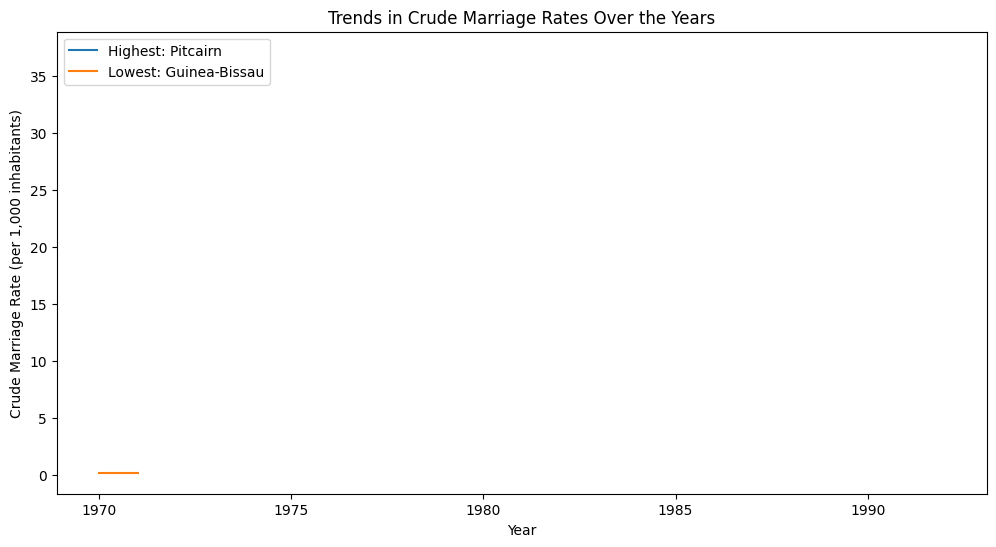

Entity with the highest marriage rate: Pitcairn
Entity with the lowest marriage rate: Guinea-Bissau


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data from an Excel workbook
xls = pd.ExcelFile('/content/Why are suicide rates so high for men worldwide.xlsx')

# Load the specific sheet with the marriage rate data
data = pd.read_excel(xls, sheet_name='marriage-rate-per-1000-inhabita')

# Filter out non-numeric rows or irrelevant data
# Depending on your data structure, you might need to clean the data.

# Assuming the column 'Year' represents the years and 'Entity' represents different entities
marriage_rates = data.pivot(index='Year', columns='Entity', values='Crude marriage rate (per 1,000 inhabitants)')

# Calculate trends in crude marriage rates over the years for different entities
# Note that you need to adapt this code based on your dataset.

# Identify entities with the highest and lowest marriage rates
highest_marriage_rate_entity = marriage_rates.mean().idxmax()
lowest_marriage_rate_entity = marriage_rates.mean().idxmin()

# Plot trends in marriage rates for specific entities
plt.figure(figsize=(12, 6))
plt.plot(marriage_rates.index, marriage_rates[highest_marriage_rate_entity], label=f'Highest: {highest_marriage_rate_entity}')
plt.plot(marriage_rates.index, marriage_rates[lowest_marriage_rate_entity], label=f'Lowest: {lowest_marriage_rate_entity}')
plt.title('Trends in Crude Marriage Rates Over the Years')
plt.xlabel('Year')
plt.ylabel('Crude Marriage Rate (per 1,000 inhabitants)')
plt.legend()

# Investigate relationships between marriage rates and other variables
# You might need to merge this data with other relevant data or perform additional analysis.

# Show the plot
plt.show()

# Print the results
print(f'Entity with the highest marriage rate: {highest_marriage_rate_entity}')
print(f'Entity with the lowest marriage rate: {lowest_marriage_rate_entity}')



<ipython-input-24-36686b3e95f3>:18: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = data.corr()


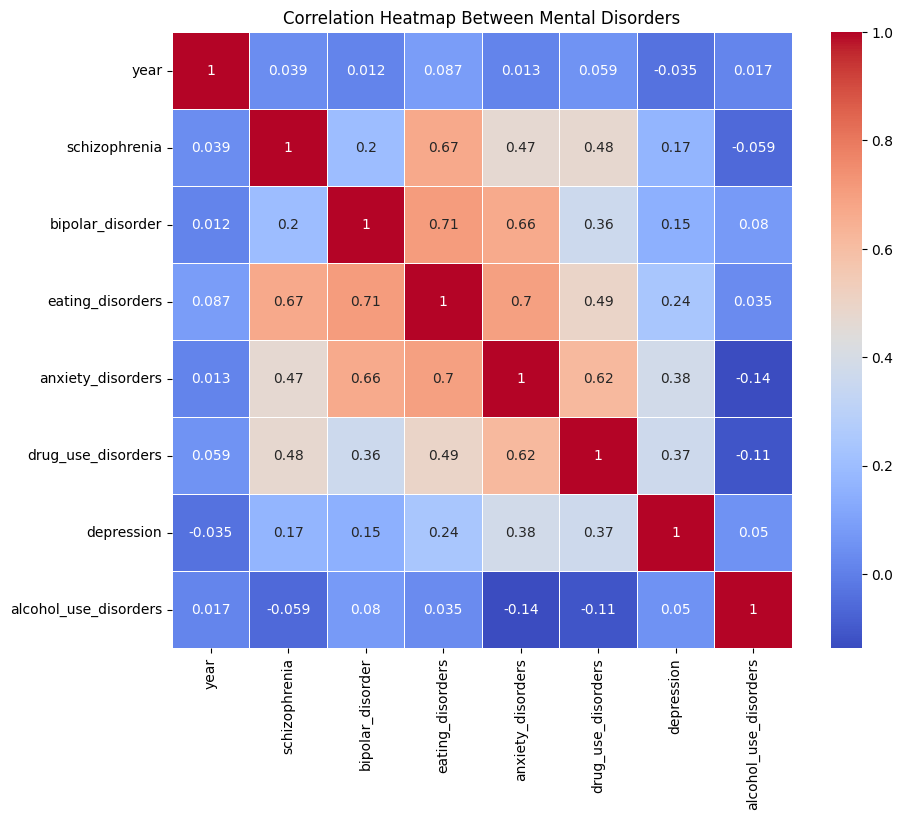

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data from an Excel workbook
xls = pd.ExcelFile('/content/Why are suicide rates so high for men worldwide.xlsx')

# Load the specific sheet with the prevalence data
data = pd.read_excel(xls, sheet_name='prevalence_by_mental_and_substa')

# Clean and preprocess the data as needed
# Remove non-numeric rows, if present

# Calculate trends in the prevalence of mental and substance disorders over time and across entities
# Depending on your data structure, pivot or reshape the data

# Calculate correlations between different mental disorders
correlation_matrix = data.corr()

# Visualize correlations, e.g., using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap Between Mental Disorders')
plt.show()

# Explore relationships between the prevalence of mental disorders and other factors
# You might need to merge this data with other relevant data or perform additional analysis

# Print and interpret the results



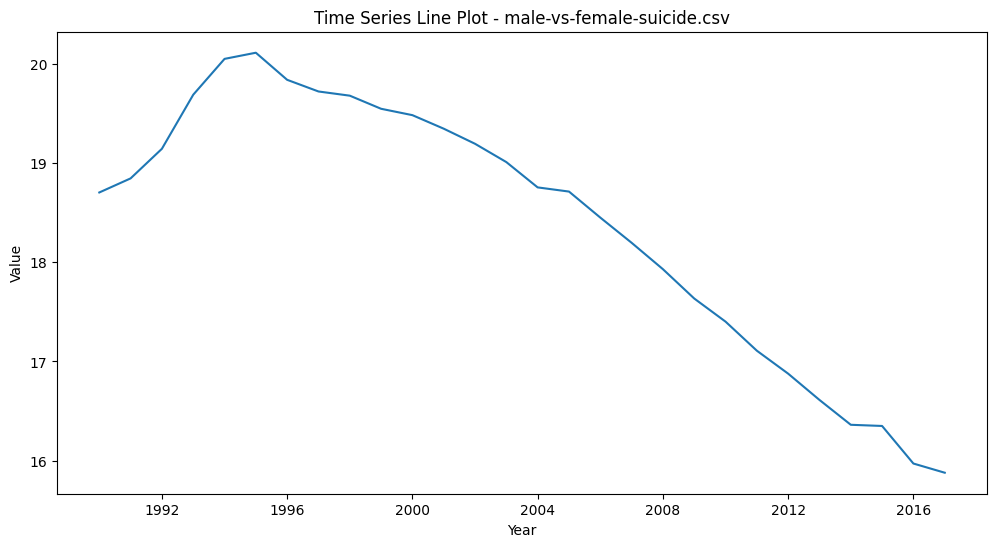

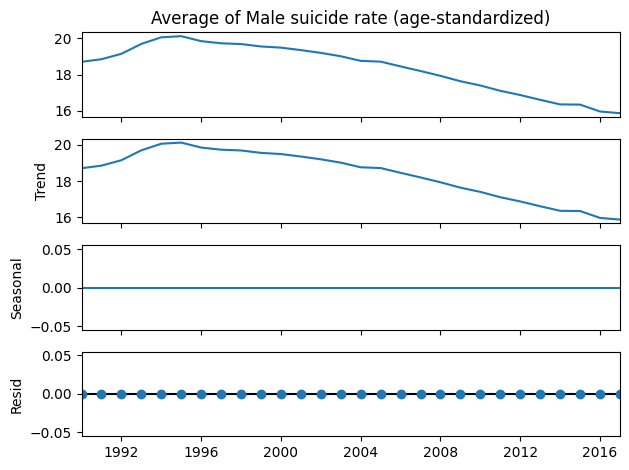

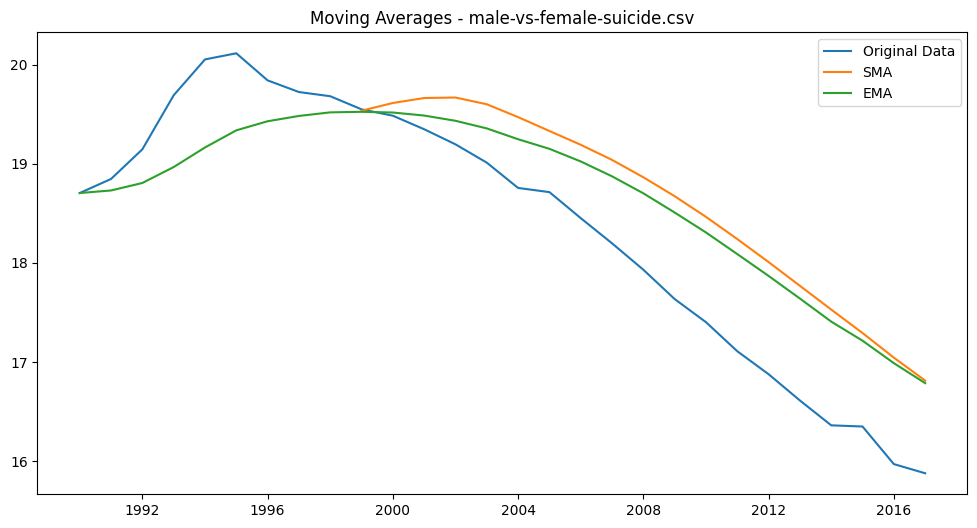

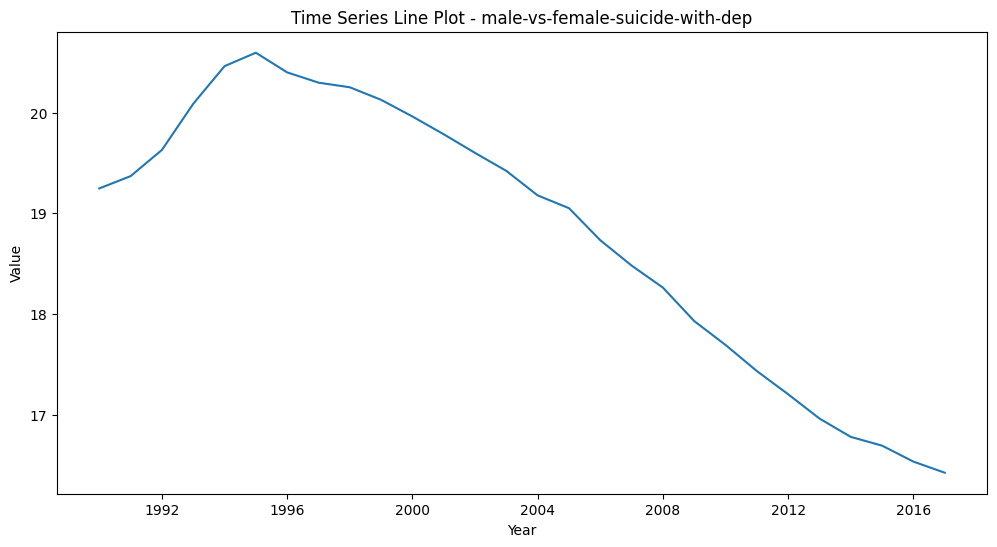

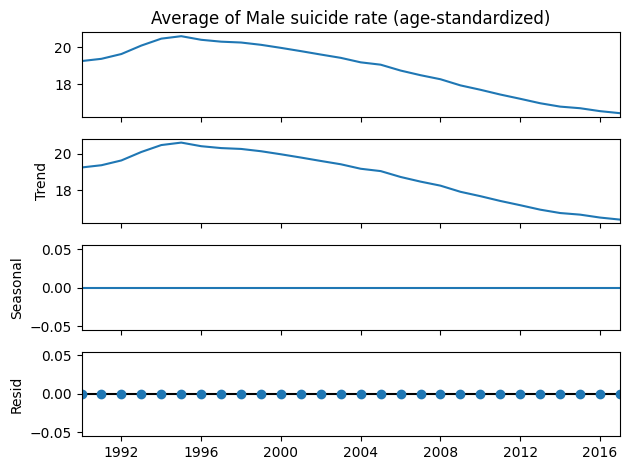

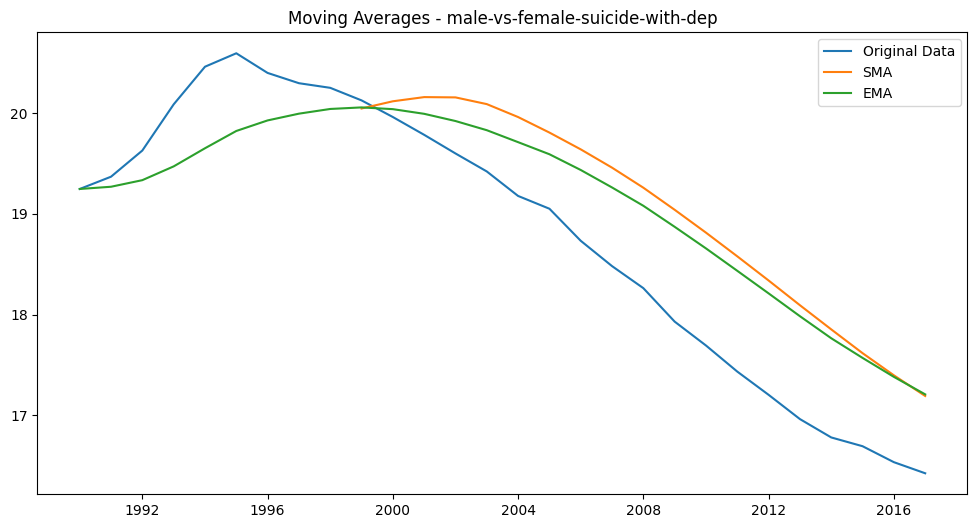

In [26]:
# Time series analysis  for Sheet 1 and sheet 2

import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Load your Excel file with multiple sheets
excel_file = '/content/Why are suicide rates so high for men worldwide.xlsx'  # Replace with your file path
sheet_names = ['male-vs-female-suicide.csv', 'male-vs-female-suicide-with-dep']

for sheet_name in sheet_names:
    # Load data from the current sheet
    data = pd.read_excel(excel_file, sheet_name=sheet_name)

    # Replace non-numeric or NA values in the "Row Labels" column with NaN
    data['Row Labels'] = pd.to_numeric(data['Row Labels'], errors='coerce')

    # Drop rows with NaN values in the "Row Labels" column
    data = data.dropna(subset=['Row Labels'])

    # Set "Row Labels" column as the index with a yearly frequency
    data['Row Labels'] = pd.to_datetime(data['Row Labels'], format='%Y')
    data = data.set_index('Row Labels')

    # Line Plot
    plt.figure(figsize=(12, 6))
    plt.plot(data.index, data['Average of Male suicide rate (age-standardized)'])
    plt.xlabel('Year')
    plt.ylabel('Value')
    plt.title(f'Time Series Line Plot - {sheet_name}')
    plt.show()

    # Time Series Decomposition
    result = seasonal_decompose(data['Average of Male suicide rate (age-standardized)'], model='additive')
    result.plot()
    plt.show()

    # Moving Averages
    period = 10  # Adjust the moving average period as needed
    data['SMA'] = data['Average of Male suicide rate (age-standardized)'].rolling(window=period).mean()
    data['EMA'] = data['Average of Male suicide rate (age-standardized)'].ewm(span=period, adjust=False).mean()
    plt.figure(figsize=(12, 6))
    plt.plot(data.index, data['Average of Male suicide rate (age-standardized)'], label='Original Data')
    plt.plot(data.index, data['SMA'], label='SMA')
    plt.plot(data.index, data['EMA'], label='EMA')
    plt.legend()
    plt.title(f'Moving Averages - {sheet_name}')
    plt.show()


In [27]:
#Escriptive Statistics - Mean, Median, Standard Deviation of male-vs-female-suicide.csv

import pandas as pd

# Load your data from the Excel file
excel_file = '/content/Why are suicide rates so high for men worldwide.xlsx'
sheet_name = 'male-vs-female-suicide.csv'
data = pd.read_excel(excel_file, sheet_name=sheet_name)

# Iterate through the numeric columns and calculate mean, median, and standard deviation
for column in data.columns:
    if pd.api.types.is_numeric_dtype(data[column]):
        mean_value = data[column].mean()
        median_value = data[column].median()
        std_deviation = data[column].std()
        print(f"Column: {column}")
        print(f"Mean: {mean_value}")
        print(f"Median: {median_value}")
        print(f"Standard Deviation: {std_deviation}")
        print()




Column: Average of Male suicide rate (age-standardized)
Mean: 18.3779921037931
Median: 18.71423913
Standard Deviation: 1.3090219944245165

Column: Average of Female suicide rate (age-standardized)
Mean: 6.014635969827585
Median: 6.071413043
Standard Deviation: 0.7776100731823519



In [28]:
#Escriptive Statistics - Mean, Median, Standard Deviation of male-vs-female-suicide-with-dep

import pandas as pd
# Load your data from the Excel file
excel_file = '/content/Why are suicide rates so high for men worldwide.xlsx'
sheet_name = 'male-vs-female-suicide-with-dep'
data = pd.read_excel(excel_file, sheet_name=sheet_name)

# Iterate through the numeric columns and calculate mean, median, and standard deviation
for column in data.columns:
    if pd.api.types.is_numeric_dtype(data[column]):
        mean_value = data[column].mean()
        median_value = data[column].median()
        std_deviation = data[column].std()
        print(f"Column: {column}")
        print(f"Mean: {mean_value}")
        print(f"Median: {median_value}")
        print(f"Standard Deviation: {std_deviation}")
        print()

Column: Average of depression prevalance in males 
Mean: 2.6883363916206893
Median: 2.689028606
Standard Deviation: 0.01949994190835006

Column: Average of Male suicide rate (age-standardized)
Mean: 18.80659663862069
Median: 19.1779638
Standard Deviation: 1.3440323308285709



In [29]:
#Escriptive Statistics - Mean, Median, Standard Deviation of marriage-rate-per-1000-inhabita

import pandas as pd

# Load your data from the Excel file
excel_file = '/content/Why are suicide rates so high for men worldwide.xlsx'
sheet_name = 'marriage-rate-per-1000-inhabita'
data = pd.read_excel(excel_file, sheet_name=sheet_name)

# Iterate through the numeric columns and calculate mean, median, and standard deviation
for column in data.columns:
    if pd.api.types.is_numeric_dtype(data[column]):
        mean_value = data[column].mean()
        median_value = data[column].median()
        std_deviation = data[column].std()
        print(f"Column: {column}")
        print(f"Mean: {mean_value}")
        print(f"Median: {median_value}")
        print(f"Standard Deviation: {std_deviation}")
        print()

Column: Year
Mean: 1989.6354967702246
Median: 1991.0
Standard Deviation: 17.105366352497203

Column: Crude marriage rate (per 1,000 inhabitants)
Mean: 6.694801600780992
Median: 6.5
Standard Deviation: 2.6373671197086246



In [30]:
#Escriptive Statistics - Mean, Median, Standard Deviation of prevalence_by_mental_and_substa

import pandas as pd
# Load your data from the Excel file
excel_file = '/content/Why are suicide rates so high for men worldwide.xlsx'
sheet_name = 'prevalence_by_mental_and_substa'
data = pd.read_excel(excel_file, sheet_name=sheet_name)

# Iterate through the columns and calculate mean, median, and standard deviation
for column in data.columns:
    if pd.api.types.is_numeric_dtype(data[column]):
        mean_value = data[column].mean()
        median_value = data[column].median()
        std_deviation = data[column].std()
        print(f"Column: {column}")
        print(f"Mean: {mean_value}")
        print(f"Median: {median_value}")
        print(f"Standard Deviation: {std_deviation}")
        print()

Column: year
Mean: 2003.5
Median: 2003.5
Standard Deviation: 8.078371722451168

Column: schizophrenia
Mean: 0.21164355081139133
Median: 0.19956312153150002
Standard Deviation: 0.044252799399097056

Column: bipolar_disorder
Mean: 0.7191451949099932
Median: 0.693134482373
Standard Deviation: 0.17158860649342855

Column: eating_disorders
Mean: 0.2399983609920943
Median: 0.18252454610199947
Standard Deviation: 0.1581412209537988

Column: anxiety_disorders
Mean: 3.9899212964041744
Median: 3.554372782075
Standard Deviation: 1.167526253590838

Column: drug_use_disorders
Mean: 0.8622780428827768
Median: 0.726429969497
Standard Deviation: 0.46067884505909573

Column: depression
Mean: 3.497653585653159
Median: 3.499605996015
Standard Deviation: 0.6558588693342733

Column: alcohol_use_disorders
Mean: 1.5858214134704773
Median: 1.4799366218349999
Standard Deviation: 0.8602834108686485



In [31]:
#Hypothesis testing
#Hypothesis testing Sheet: 'male-vs-female-suicide.csv'

import pandas as pd
from scipy.stats import ttest_ind

# Load your data from the Excel file
excel_file = '/content/Why are suicide rates so high for men worldwide.xlsx'
sheet_name = 'male-vs-female-suicide.csv'
data = pd.read_excel(excel_file, sheet_name=sheet_name)

# Specify the two groups you want to compare
group1 = data['Average of Male suicide rate (age-standardized)']
group2 = data['Average of Female suicide rate (age-standardized)']

# Perform a t-test for the two groups
t_statistic, p_value = ttest_ind(group1, group2)

# Set your significance level (alpha)
alpha = 0.05

# Check if the p-value is less than the significance level
if p_value < alpha:
    print("Null hypothesis rejected: There is a significant difference between the groups.")
else:
    print("Null hypothesis not rejected: No significant difference between the groups.")

# Print the t-statistic and p-value
print(f"T-statistic: {t_statistic}")
print(f"P-value: {p_value}")


Null hypothesis rejected: There is a significant difference between the groups.
T-statistic: 43.72788057868056
P-value: 5.594104536502962e-45


In [32]:
#Hypothesis testing  sheet_name = 'male-vs-female-suicide-with-dep'

import pandas as pd
from scipy.stats import ttest_ind

# Load your data from the Excel file
excel_file = '/content/Why are suicide rates so high for men worldwide.xlsx'
sheet_name = 'male-vs-female-suicide-with-dep'
data = pd.read_excel(excel_file, sheet_name=sheet_name)

# Specify the two groups you want to compare
group1 = data['Average of depression prevalance in males ']
group2 = data['Average of Male suicide rate (age-standardized)']

# Perform a t-test for the two groups
t_statistic, p_value = ttest_ind(group1, group2)

# Set your significance level (alpha)
alpha = 0.05

# Check if the p-value is less than the significance level
if p_value < alpha:
    print("Null hypothesis rejected: There is a significant difference between the groups.")
else:
    print("Null hypothesis not rejected: No significant difference between the groups.")

# Print the t-statistic and p-value
print(f"T-statistic: {t_statistic}")
print(f"P-value: {p_value}")


Null hypothesis rejected: There is a significant difference between the groups.
T-statistic: -64.57460266583733
P-value: 2.8332825411379373e-54


In [33]:
#Hypothesis testing  sheet_name = 'marriage-rate-per-1000-inhabita'

import pandas as pd
from scipy.stats import ttest_ind

# Load your data from the Excel file
excel_file = '/content/Why are suicide rates so high for men worldwide.xlsx'
sheet_name = 'marriage-rate-per-1000-inhabita'
data = pd.read_excel(excel_file, sheet_name=sheet_name)

# Specify the two groups you want to compare
group1 = data['Year']
group2 = data['Crude marriage rate (per 1,000 inhabitants)']

# Perform a t-test for the two groups
t_statistic, p_value = ttest_ind(group1, group2)

# Set your significance level (alpha)
alpha = 0.05

# Check if the p-value is less than the significance level
if p_value < alpha:
    print("Null hypothesis rejected: There is a significant difference between the groups.")
else:
    print("Null hypothesis not rejected: No significant difference between the groups.")

# Print the t-statistic and p-value
print(f"T-statistic: {t_statistic}")
print(f"P-value: {p_value}")


Null hypothesis rejected: There is a significant difference between the groups.
T-statistic: 6532.5701561189
P-value: 0.0


In [37]:
#Hypothesis testing - prevalence_by_mental_and_substa

import pandas as pd
from scipy.stats import ttest_ind

# Load your data from the Excel file
excel_file = '/content/Why are suicide rates so high for men worldwide.xlsx'
sheet_name = 'prevalence_by_mental_and_substa'
data = pd.read_excel(excel_file, sheet_name=sheet_name)

# Specify the column containing years
year_column = 'year'  # Replace with the actual column name

# Loop through the mental disorder columns
mental_disorder_columns = ['schizophrenia', 'bipolar_disorder', 'eating_disorders', 'anxiety_disorders', 'drug_use_disorders', 'depression', 'alcohol_use_disorders']
alpha = 0.05

for disorder in mental_disorder_columns:
    group1 = data[year_column]
    group2 = data[disorder]

    # Perform a t-test for the two groups
    t_statistic, p_value = ttest_ind(group1, group2)

    # Check if the p-value is less than the significance level
    if p_value < alpha:
        print(f"Null hypothesis rejected: There is a significant difference between {year_column} and {disorder}.")
    else:
        print(f"Null hypothesis not rejected: No significant difference between {year_column} and {disorder}.")

    # Print the t-statistic and p-value
    print(f"T-statistic for {year_column} and {disorder}: {t_statistic}")
    print(f"P-value for {year_column} and {disorder}: {p_value}")


Null hypothesis rejected: There is a significant difference between year and schizophrenia.
T-statistic for year and schizophrenia: 19943.350560944073
P-value for year and schizophrenia: 0.0
Null hypothesis rejected: There is a significant difference between year and bipolar_disorder.
T-statistic for year and bipolar_disorder: 19934.1011626563
P-value for year and bipolar_disorder: 0.0
Null hypothesis rejected: There is a significant difference between year and eating_disorders.
T-statistic for year and eating_disorders: 19939.547300507395
P-value for year and eating_disorders: 0.0
Null hypothesis rejected: There is a significant difference between year and anxiety_disorders.
T-statistic for year and anxiety_disorders: 19701.343143785685
P-value for year and anxiety_disorders: 0.0
Null hypothesis rejected: There is a significant difference between year and drug_use_disorders.
T-statistic for year and drug_use_disorders: 19904.833557962258
P-value for year and drug_use_disorders: 0.0
Nu

  Row Labels  Average of Male suicide rate (age-standardized)  \
0       1990                                        18.705217   
1       1991                                        18.847283   
2       1992                                        19.145870   
3       1993                                        19.692065   
4       1994                                        20.053587   

   Average of Female suicide rate (age-standardized)  
0                                           6.978913  
1                                           6.932283  
2                                           6.966196  
3                                           6.973043  
4                                           6.957826  


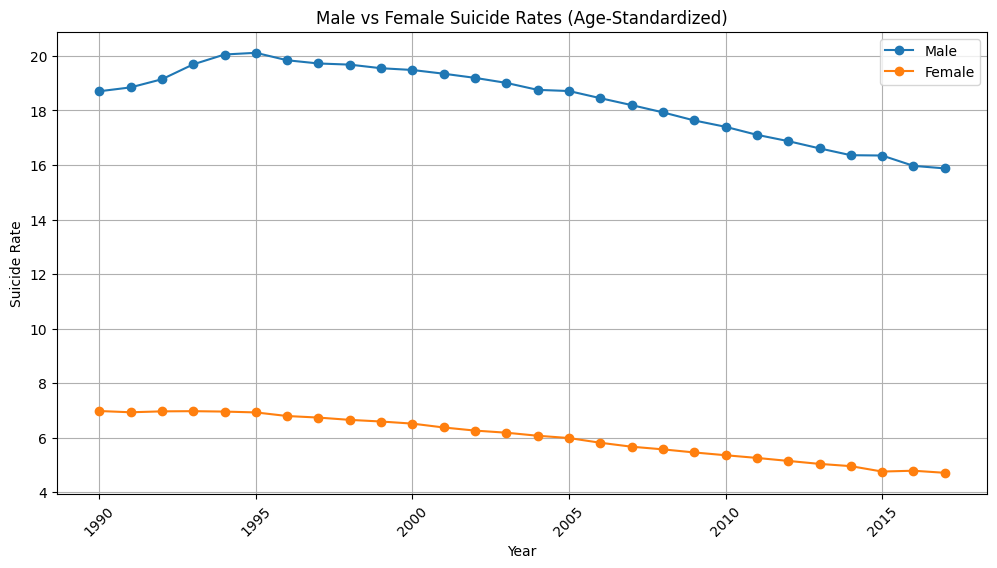

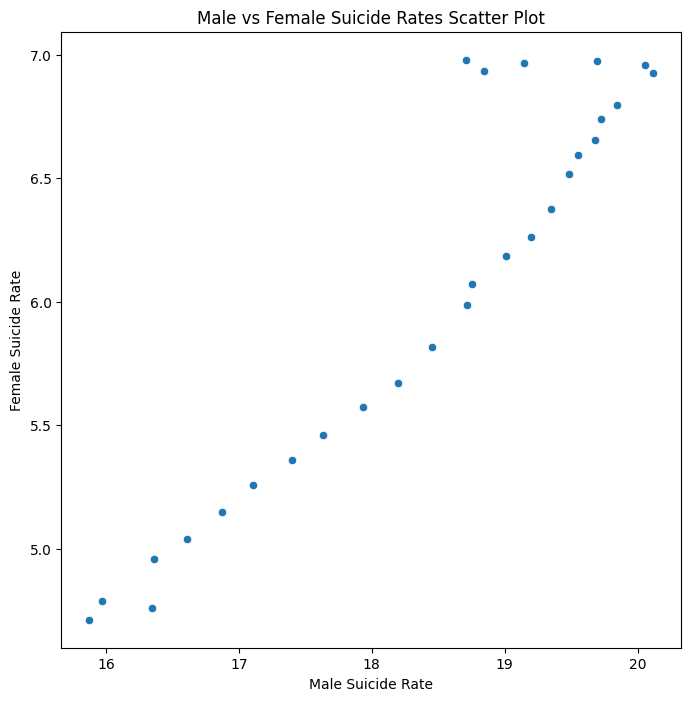

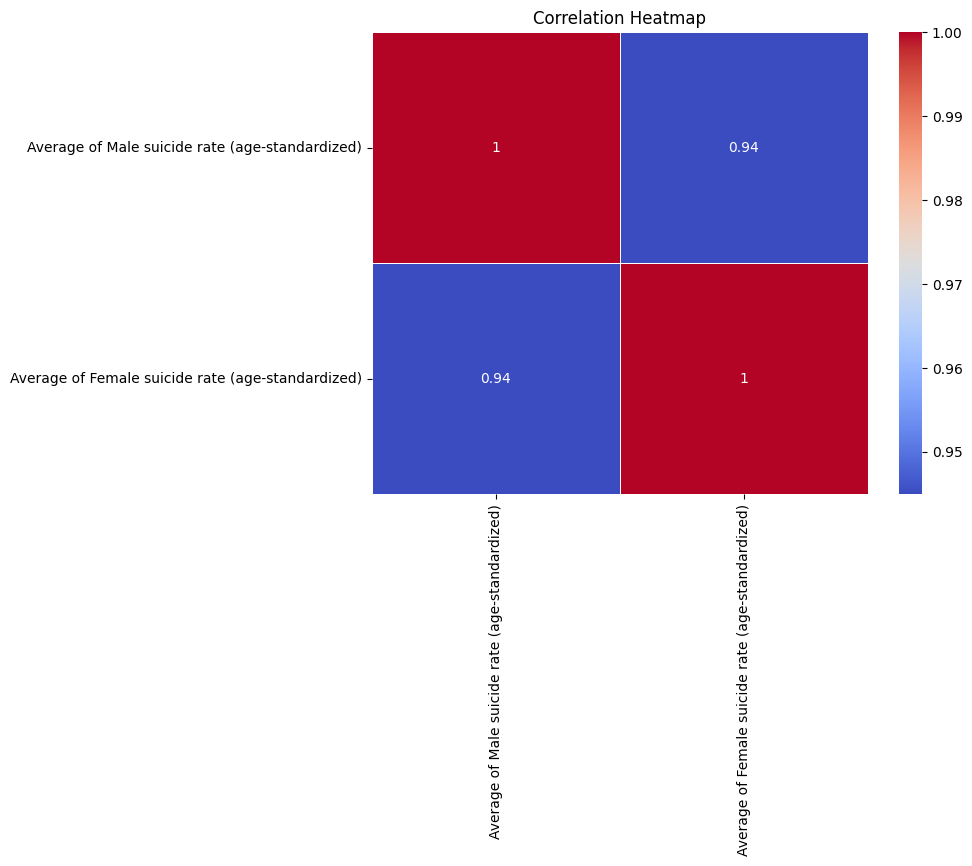

In [38]:
#data visulization for sheet_name = 'male-vs-female-suicide.csv

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel data
file_path = '/content/Why are suicide rates so high for men worldwide.xlsx'
sheet_name = 'male-vs-female-suicide.csv'
df = pd.read_excel(file_path, sheet_name=sheet_name)

# Exclude the row with the label 'Grand Total'
df = df[df['Row Labels'] != 'Grand Total']

# Check the structure of the dataset
print(df.head())

# Create a line plot to visualize the trend of male and female suicide rates
plt.figure(figsize=(12, 6))
plt.plot(df['Row Labels'], df['Average of Male suicide rate (age-standardized)'], label='Male', marker='o')
plt.plot(df['Row Labels'], df['Average of Female suicide rate (age-standardized)'], label='Female', marker='o')
plt.title('Male vs Female Suicide Rates (Age-Standardized)')
plt.xlabel('Year')
plt.ylabel('Suicide Rate')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)

# Create a scatter plot to explore the relationship between male and female suicide rates
plt.figure(figsize=(8, 8))
sns.scatterplot(x='Average of Male suicide rate (age-standardized)', y='Average of Female suicide rate (age-standardized)', data=df)
plt.title('Male vs Female Suicide Rates Scatter Plot')
plt.xlabel('Male Suicide Rate')
plt.ylabel('Female Suicide Rate')

# Create a heatmap to visualize the correlation between male and female suicide rates
correlation_matrix = df[['Average of Male suicide rate (age-standardized)', 'Average of Female suicide rate (age-standardized)']].corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Heatmap')

# Show the plots
plt.show()

  Row Labels  Average of depression prevalance in males   \
0       1990                                    2.682156   
1       1991                                    2.681672   
2       1992                                    2.680720   
3       1993                                    2.686673   
4       1994                                    2.698425   

   Average of Male suicide rate (age-standardized)  
0                                        19.247149  
1                                        19.369186  
2                                        19.629005  
3                                        20.088145  
4                                        20.461765  


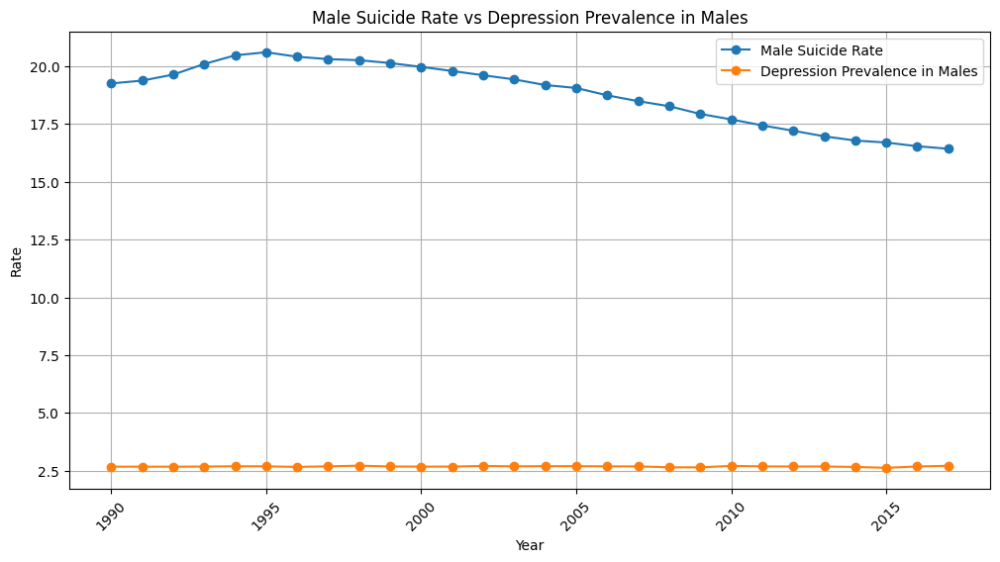

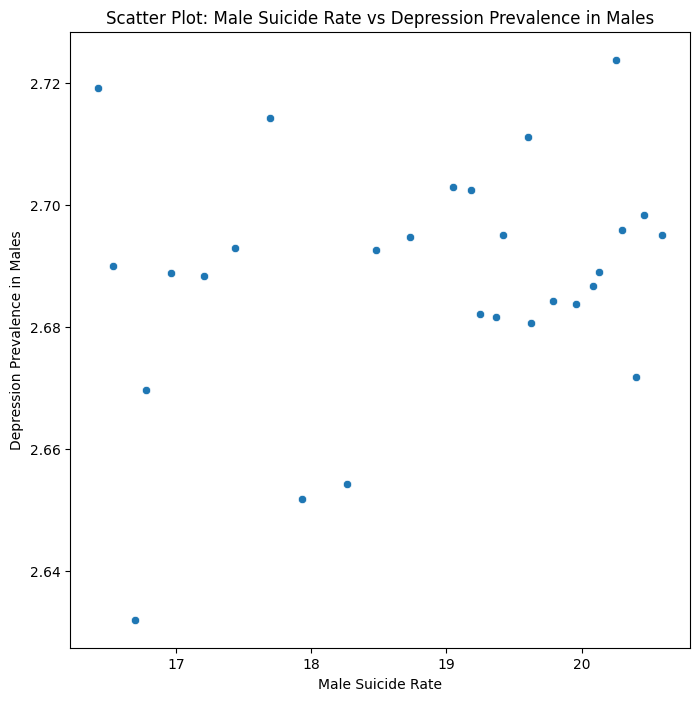

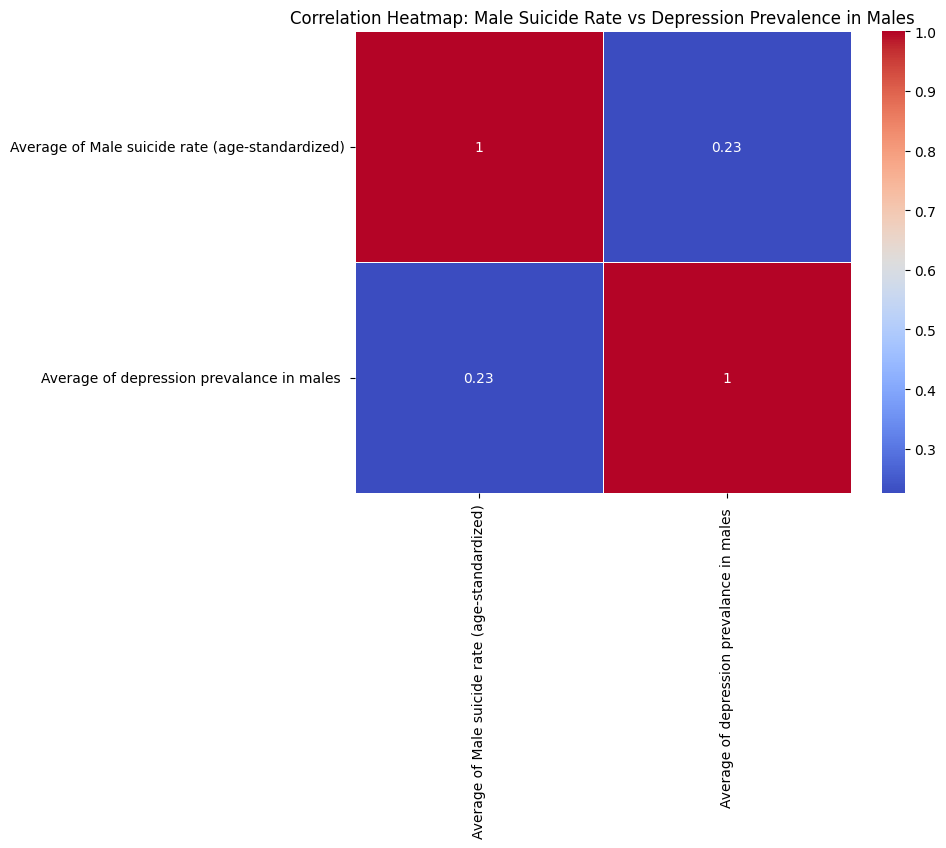

In [39]:
#data visulization for sheet_name = 'male-vs-female-suicide-with-dep'

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel data
file_path = '/content/Why are suicide rates so high for men worldwide.xlsx'
sheet_name = 'male-vs-female-suicide-with-dep'
df = pd.read_excel(file_path, sheet_name=sheet_name)

# Exclude the row with the label 'Grand Total'
df = df[df['Row Labels'] != 'Grand Total']

# Check the structure of the dataset
print(df.head())

# Create a line plot to visualize the trend of male suicide rates and depression prevalence in males over time
plt.figure(figsize=(12, 6))
plt.plot(df['Row Labels'], df['Average of Male suicide rate (age-standardized)'], label='Male Suicide Rate', marker='o')
plt.plot(df['Row Labels'], df['Average of depression prevalance in males '], label='Depression Prevalence in Males', marker='o')
plt.title('Male Suicide Rate vs Depression Prevalence in Males')
plt.xlabel('Year')
plt.ylabel('Rate')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)

# Create a scatter plot to explore the relationship between male suicide rates and depression prevalence in males
plt.figure(figsize=(8, 8))
sns.scatterplot(x='Average of Male suicide rate (age-standardized)', y='Average of depression prevalance in males ', data=df)
plt.title('Scatter Plot: Male Suicide Rate vs Depression Prevalence in Males')
plt.xlabel('Male Suicide Rate')
plt.ylabel('Depression Prevalence in Males')

# Create a heatmap to visualize the correlation between male suicide rates and depression prevalence in males
correlation_matrix = df[['Average of Male suicide rate (age-standardized)', 'Average of depression prevalance in males ']].corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Heatmap: Male Suicide Rate vs Depression Prevalence in Males')

# Show the plots
plt.show()

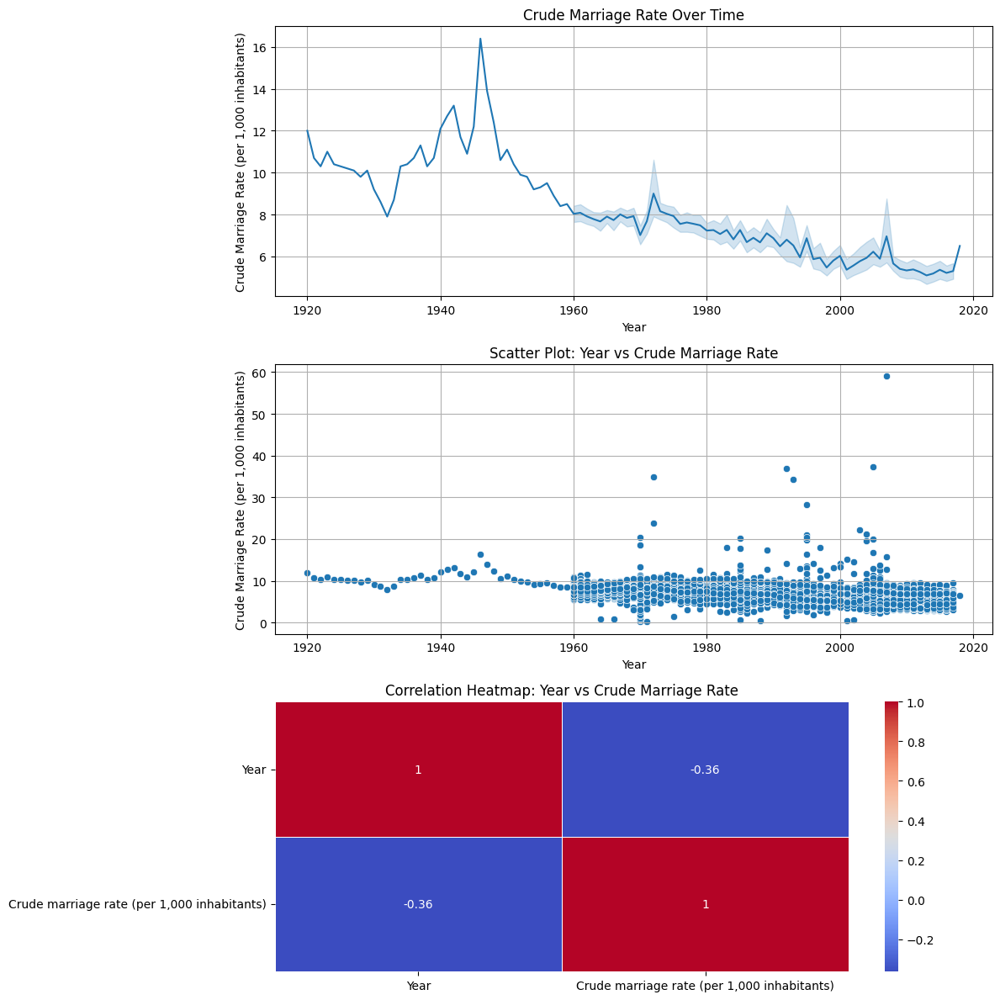

In [40]:
#data visulization for sheet_name = 'marriage-rate-per-1000-inhabita'

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel data for the third dataset
file_path = '/content/Why are suicide rates so high for men worldwide.xlsx'
sheet_name = 'marriage-rate-per-1000-inhabita'
df = pd.read_excel(file_path, sheet_name=sheet_name)

# Set up a grid of subplots for neater visualizations
fig, axes = plt.subplots(3, 1, figsize=(12, 12))

# Plot 1: Line plot for crude marriage rate over time
sns.lineplot(x='Year', y='Crude marriage rate (per 1,000 inhabitants)', data=df, ax=axes[0])
axes[0].set_title('Crude Marriage Rate Over Time')
axes[0].set_xlabel('Year')
axes[0].set_ylabel('Crude Marriage Rate (per 1,000 inhabitants)')
axes[0].grid(True)

# Plot 2: Scatter plot to explore the relationship between year and crude marriage rate
sns.scatterplot(x='Year', y='Crude marriage rate (per 1,000 inhabitants)', data=df, ax=axes[1])
axes[1].set_title('Scatter Plot: Year vs Crude Marriage Rate')
axes[1].set_xlabel('Year')
axes[1].set_ylabel('Crude Marriage Rate (per 1,000 inhabitants)')
axes[1].grid(True)

# Plot 3: Heatmap to visualize the correlation between year and crude marriage rate
correlation_matrix = df[['Year', 'Crude marriage rate (per 1,000 inhabitants)']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5, ax=axes[2])
axes[2].set_title('Correlation Heatmap: Year vs Crude Marriage Rate')

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()

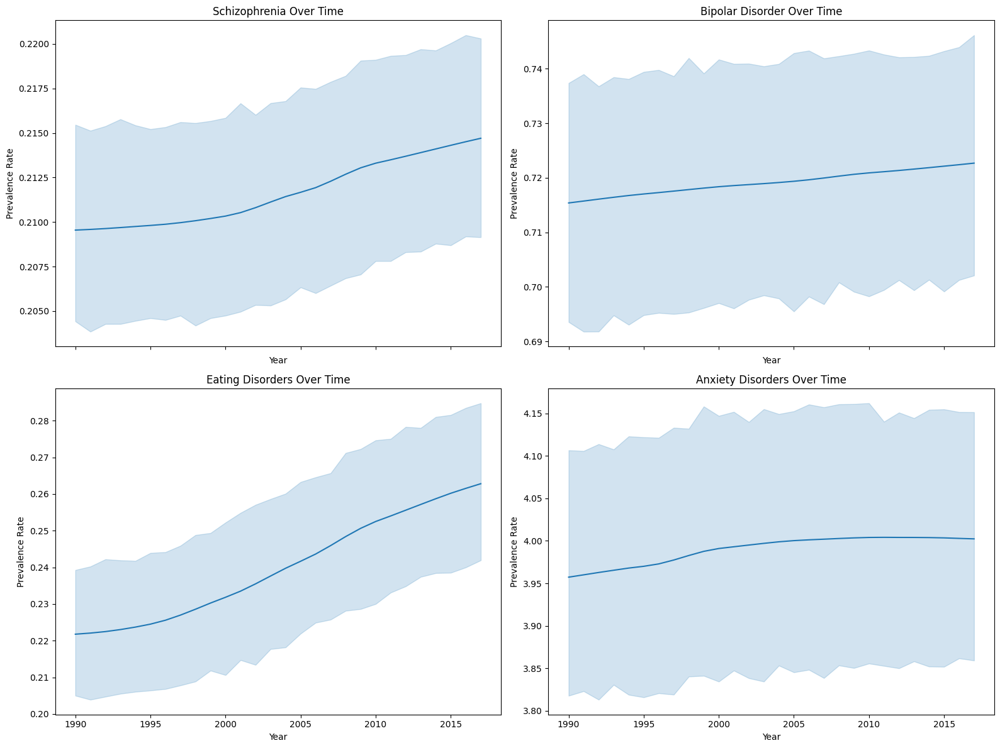

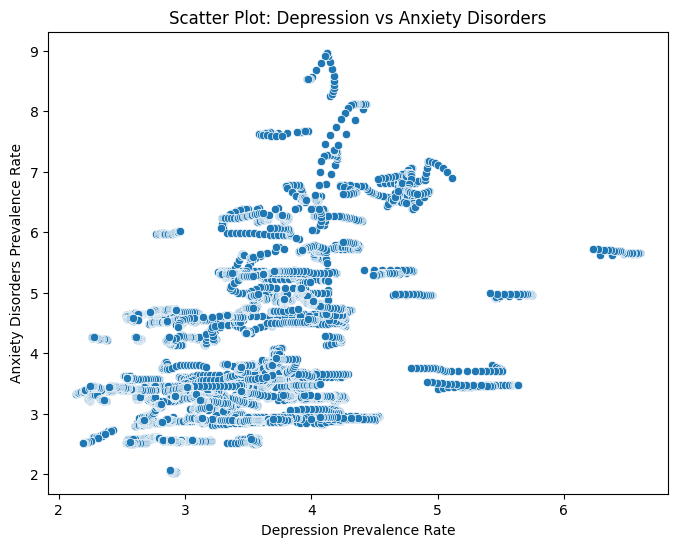

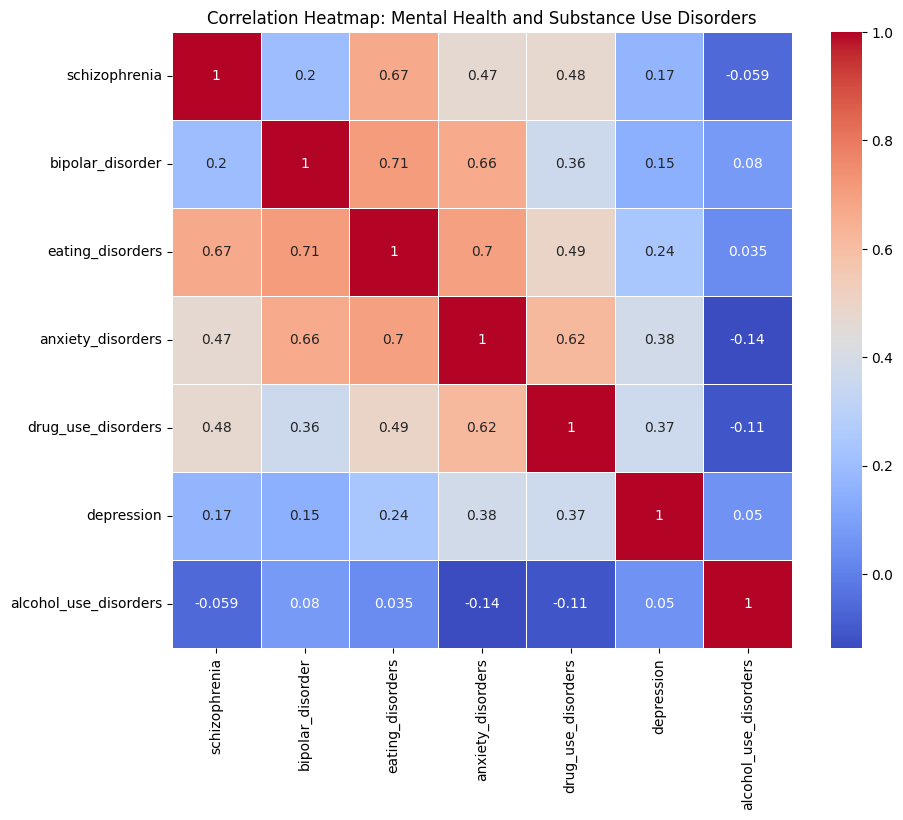

In [42]:
#data visulization for sheet_name = 'prevalence_by_mental_and_substa'

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel data for the third dataset
file_path = '/content/Why are suicide rates so high for men worldwide.xlsx'
sheet_name = 'prevalence_by_mental_and_substa'
df = pd.read_excel(file_path, sheet_name=sheet_name)

# Set up a grid of subplots for neater visualizations
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Plot 1: Schizophrenia over time
sns.lineplot(x='year', y='schizophrenia', data=df, ax=axes[0, 0])
axes[0, 0].set_title('Schizophrenia Over Time')
axes[0, 0].set_xlabel('Year')
axes[0, 0].set_ylabel('Prevalence Rate')

# Plot 2: Bipolar Disorder over time
sns.lineplot(x='year', y='bipolar_disorder', data=df, ax=axes[0, 1])
axes[0, 1].set_title('Bipolar Disorder Over Time')
axes[0, 1].set_xlabel('Year')
axes[0, 1].set_ylabel('Prevalence Rate')

# Plot 3: Eating Disorders over time
sns.lineplot(x='year', y='eating_disorders', data=df, ax=axes[1, 0])
axes[1, 0].set_title('Eating Disorders Over Time')
axes[1, 0].set_xlabel('Year')
axes[1, 0].set_ylabel('Prevalence Rate')

# Plot 4: Anxiety Disorders over time
sns.lineplot(x='year', y='anxiety_disorders', data=df, ax=axes[1, 1])
axes[1, 1].set_title('Anxiety Disorders Over Time')
axes[1, 1].set_xlabel('Year')
axes[1, 1].set_ylabel('Prevalence Rate')

# Remove x-axis labels on the top row subplots
axes[0, 0].set_xticklabels([])
axes[0, 1].set_xticklabels([])

# Tight layout
plt.tight_layout()

# Show the plots
plt.show()

# Create a scatter plot to explore the relationship between depression and anxiety disorders
plt.figure(figsize=(8, 6))
sns.scatterplot(x='depression', y='anxiety_disorders', data=df)
plt.title('Scatter Plot: Depression vs Anxiety Disorders')
plt.xlabel('Depression Prevalence Rate')
plt.ylabel('Anxiety Disorders Prevalence Rate')

# Create a heatmap to visualize the correlation between different disorders
plt.figure(figsize=(10, 8))
correlation_matrix = df[['schizophrenia', 'bipolar_disorder', 'eating_disorders', 'anxiety_disorders', 'drug_use_disorders', 'depression', 'alcohol_use_disorders']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Heatmap: Mental Health and Substance Use Disorders')

# Show the plots
plt.show()

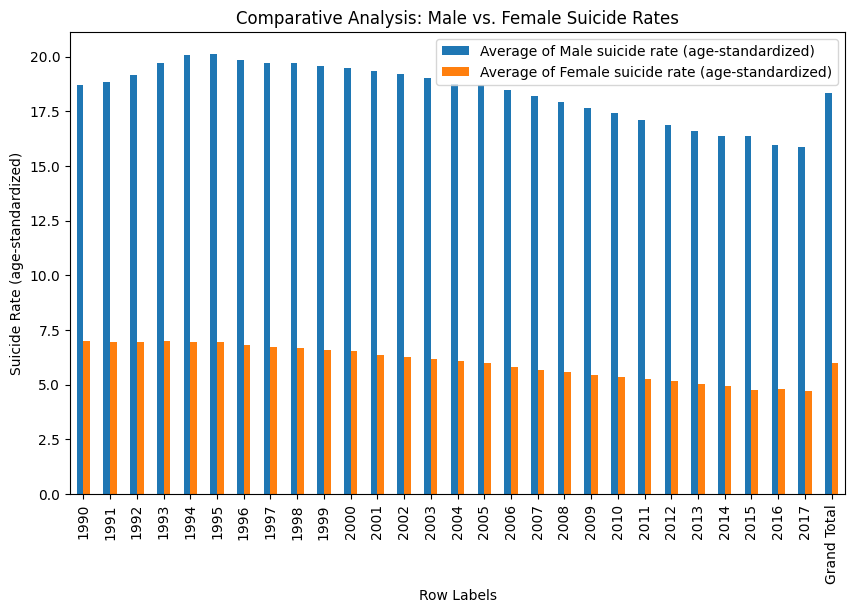

In [45]:
#Comparative Analysis for sheet_name = 'male-vs-female-suicide.csv'

import pandas as pd
import matplotlib.pyplot as plt

# Load the data from the Excel file
excel_file = '/content/Why are suicide rates so high for men worldwide.xlsx'
sheet_name = 'male-vs-female-suicide.csv'

# Read the data into a DataFrame
data = pd.read_excel(excel_file, sheet_name=sheet_name)

# Select the columns you want for your analysis
column1 = 'Row Labels'
column2 = 'Average of Male suicide rate (age-standardized)'
column3 = 'Average of Female suicide rate (age-standardized)'

# Create a new DataFrame with the selected columns
data_subset = data[[column1, column2, column3]]

# Set 'Row Labels' as the index
data_subset.set_index(column1, inplace=True)

# Plot a bar graph
data_subset.plot(kind='bar', figsize=(10, 6))

# Customize the plot (add labels and title)
plt.xlabel(column1)
plt.ylabel('Suicide Rate (age-standardized)')
plt.title('Comparative Analysis: Male vs. Female Suicide Rates')

# Show the plot
plt.show()

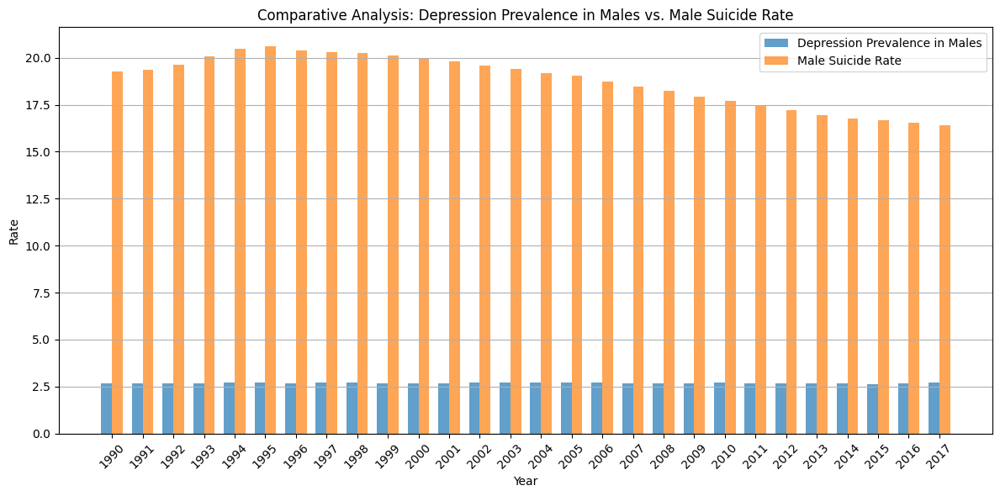

In [43]:
#Comparative Analysis for sheet_name = 'male-vs-female-suicide-with-dep'

import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel data
file_path = '/content/Why are suicide rates so high for men worldwide.xlsx'
sheet_name = 'male-vs-female-suicide-with-dep'
df = pd.read_excel(file_path, sheet_name=sheet_name)

# Exclude the row with the label 'Grand Total'
df = df[df['Row Labels'] != 'Grand Total']

# Create a comparative analysis in a grouped bar chart format
plt.figure(figsize=(12, 6))

# Define the years as x-axis labels
years = df['Row Labels']
x = range(len(years))

# Define bar width
bar_width = 0.35

# Plot the grouped bar chart
plt.bar(x, df['Average of depression prevalance in males '], width=bar_width, label='Depression Prevalence in Males', alpha=0.7)
plt.bar([i + bar_width for i in x], df['Average of Male suicide rate (age-standardized)'], width=bar_width, label='Male Suicide Rate', alpha=0.7)

# Set labels and title
plt.title('Comparative Analysis: Depression Prevalence in Males vs. Male Suicide Rate')
plt.xlabel('Year')
plt.ylabel('Rate')
plt.legend()
plt.xticks([i + bar_width / 2 for i in x], years, rotation=45)
plt.grid(axis='y')

# Show the plot
plt.tight_layout()
plt.show()

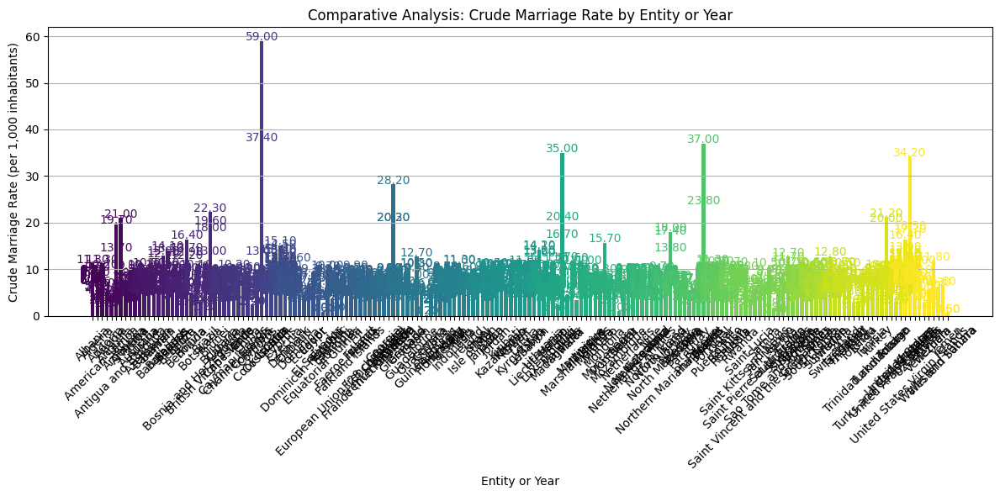

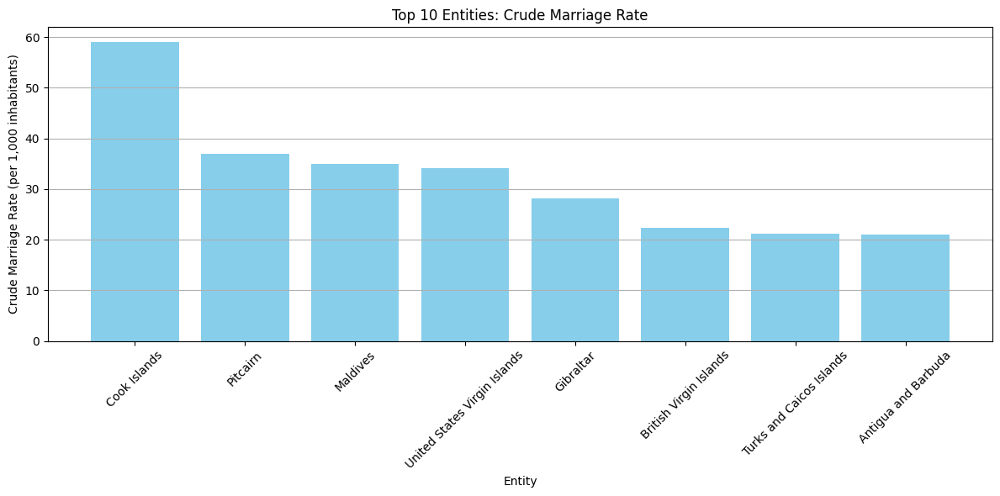

In [48]:
#Comparative Analysis for sheet_name = 'marriage-rate-per-1000-inhabita'

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the Excel data
file_path = '/content/Why are suicide rates so high for men worldwide.xlsx'
sheet_name = 'marriage-rate-per-1000-inhabita'
df = pd.read_excel(file_path, sheet_name=sheet_name)

# Define the entities or years and their corresponding marriage rates
entities = df['Entity']
marriage_rates = df['Crude marriage rate (per 1,000 inhabitants)']

# Create a colormap with distinct colors
colors = plt.cm.viridis(np.linspace(0, 1, len(entities)))

# Create a bar chart with different colors
plt.figure(figsize=(12, 6))
bars = plt.bar(entities, marriage_rates, color=colors)

# Set labels and title
plt.title('Comparative Analysis: Crude Marriage Rate by Entity or Year')
plt.xlabel('Entity or Year')
plt.ylabel('Crude Marriage Rate (per 1,000 inhabitants)')
plt.xticks(rotation=45)
plt.grid(axis='y')

# Annotate the bars with the values
for bar, rate, color in zip(bars, marriage_rates, colors):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.1, f'{rate:.2f}', ha='center', color=color)

# Show the plot
plt.tight_layout()
plt.show()


import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel data
file_path = '/content/Why are suicide rates so high for men worldwide.xlsx'
sheet_name = 'marriage-rate-per-1000-inhabita'
df = pd.read_excel(file_path, sheet_name=sheet_name)

# Sort the data by marriage rates in descending order
df_sorted = df.sort_values(by='Crude marriage rate (per 1,000 inhabitants)', ascending=False)

# Select the top N entities with the highest marriage rates (e.g., top 10)
top_n = 10
top_df = df_sorted.head(top_n)

# Define the entities and their corresponding marriage rates
entities = top_df['Entity']
marriage_rates = top_df['Crude marriage rate (per 1,000 inhabitants)']

# Create a bar chart with distinct colors for each entity
plt.figure(figsize=(12, 6))
plt.bar(entities, marriage_rates, color='skyblue')

# Set labels and title
plt.title(f'Top {top_n} Entities: Crude Marriage Rate')
plt.xlabel('Entity')
plt.ylabel('Crude Marriage Rate (per 1,000 inhabitants)')
plt.xticks(rotation=45)
plt.grid(axis='y')

# Show the plot
plt.tight_layout()
plt.show()

<Figure size 1200x600 with 0 Axes>

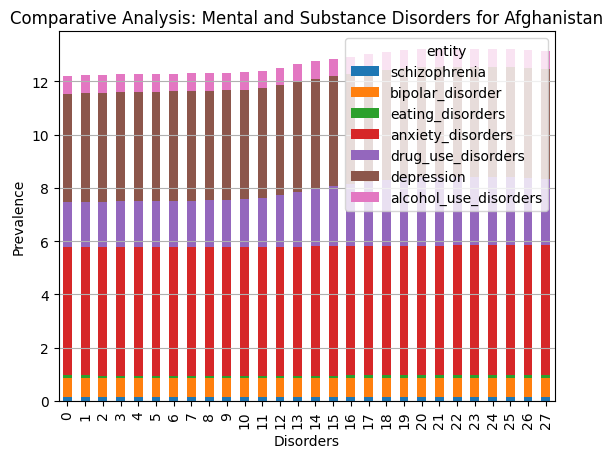

<Figure size 1200x600 with 0 Axes>

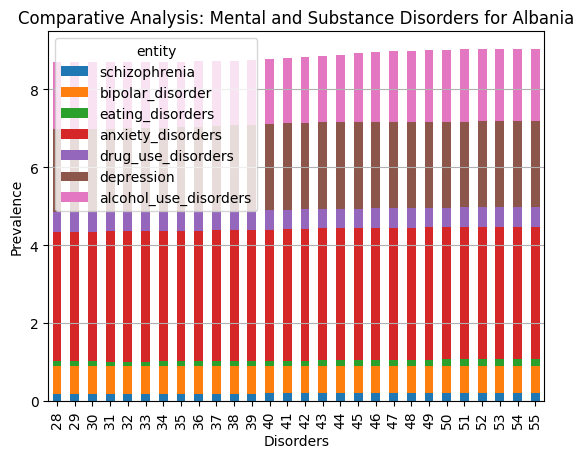

<Figure size 1200x600 with 0 Axes>

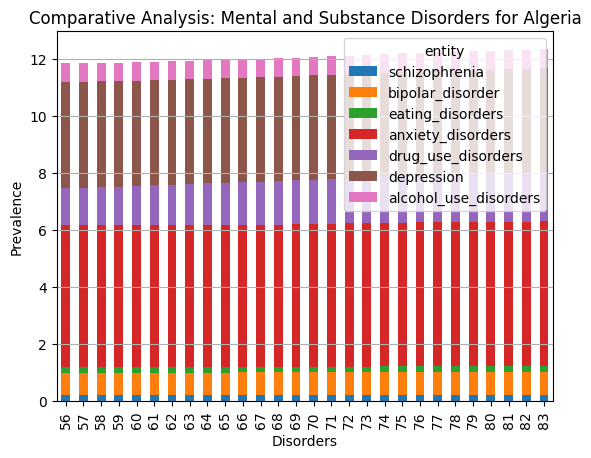

<Figure size 1200x600 with 0 Axes>

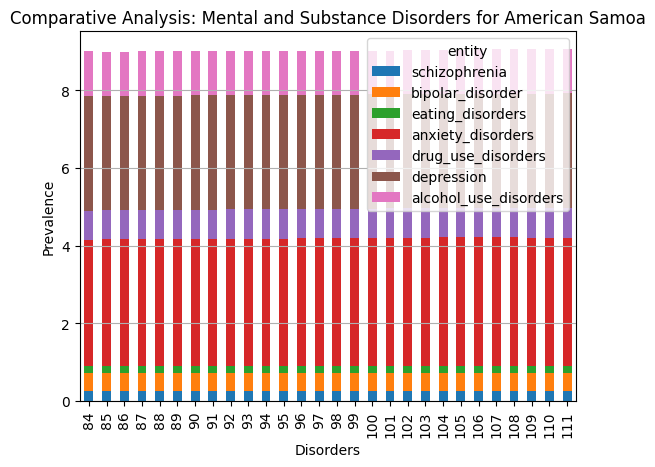

<Figure size 1200x600 with 0 Axes>

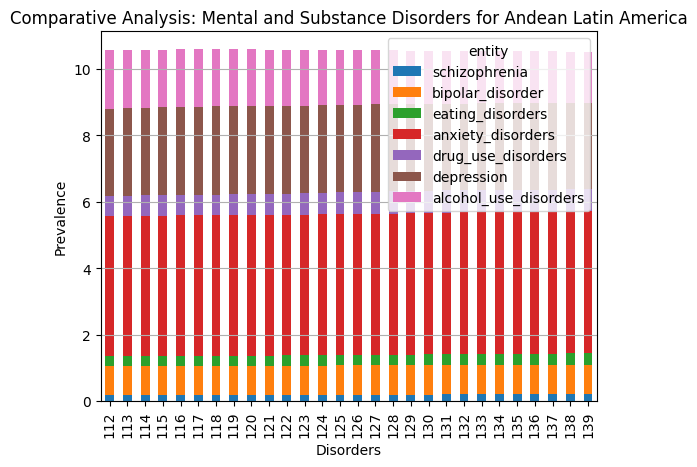

<Figure size 1200x600 with 0 Axes>

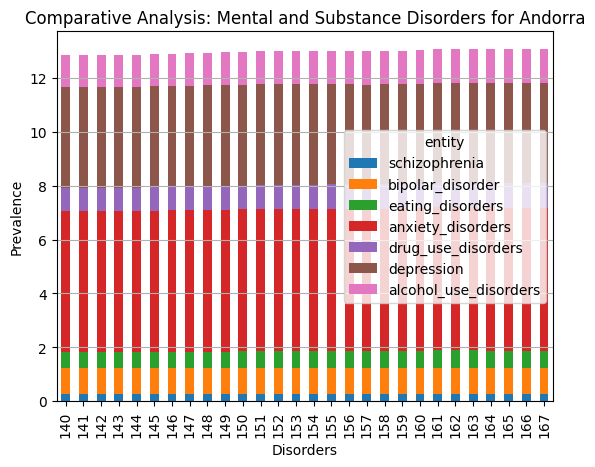

<Figure size 1200x600 with 0 Axes>

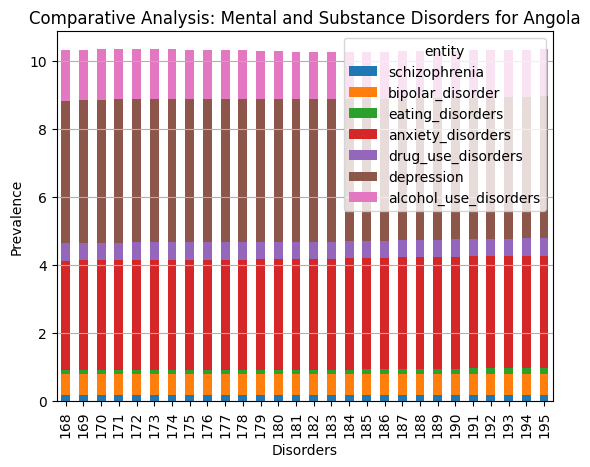

<Figure size 1200x600 with 0 Axes>

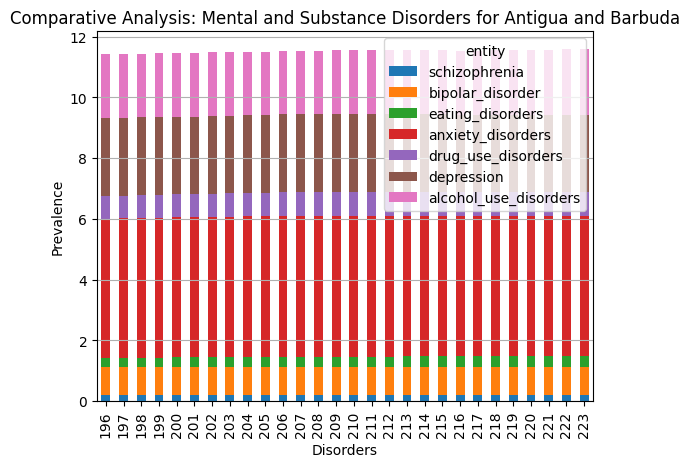

<Figure size 1200x600 with 0 Axes>

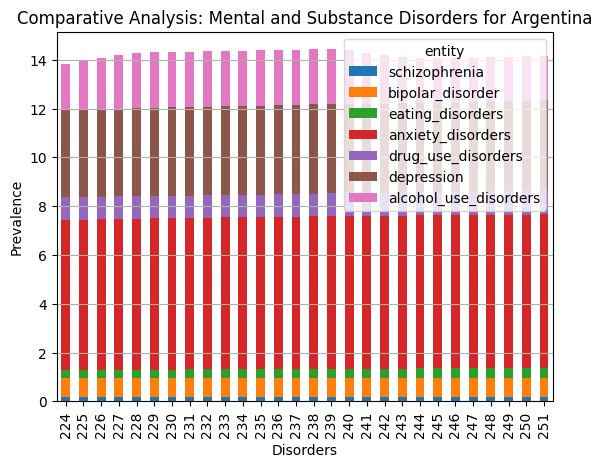

<Figure size 1200x600 with 0 Axes>

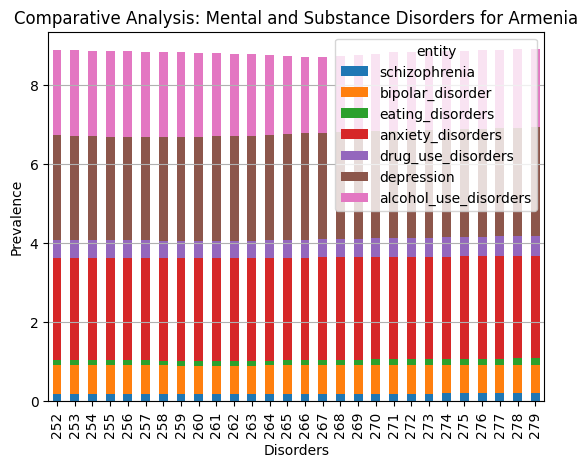

<Figure size 1200x600 with 0 Axes>

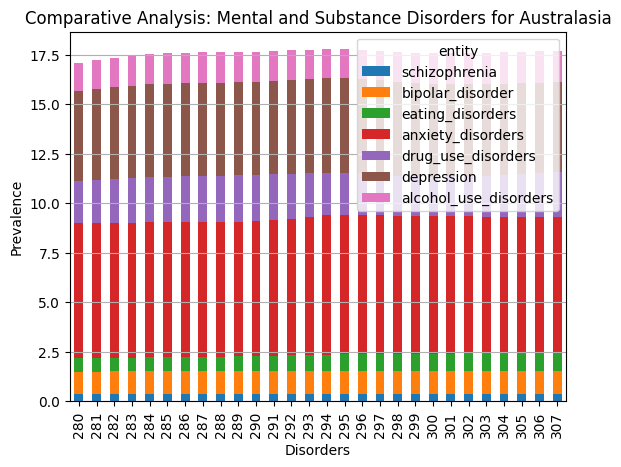

<Figure size 1200x600 with 0 Axes>

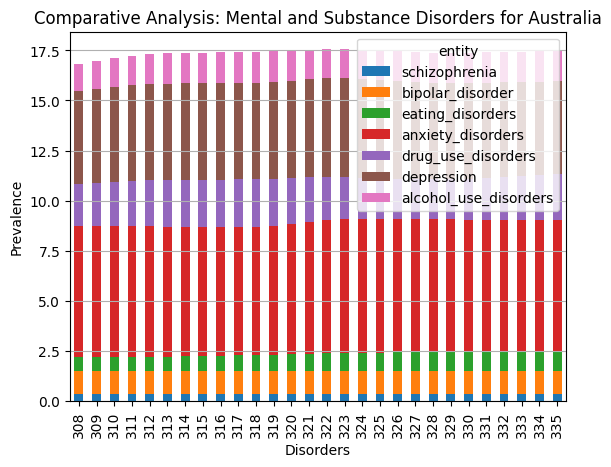

<Figure size 1200x600 with 0 Axes>

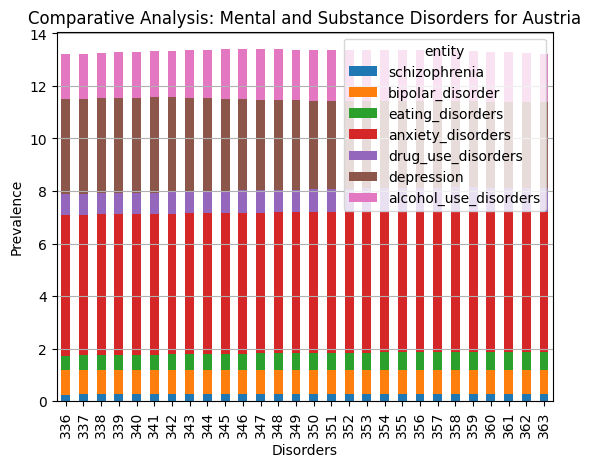

<Figure size 1200x600 with 0 Axes>

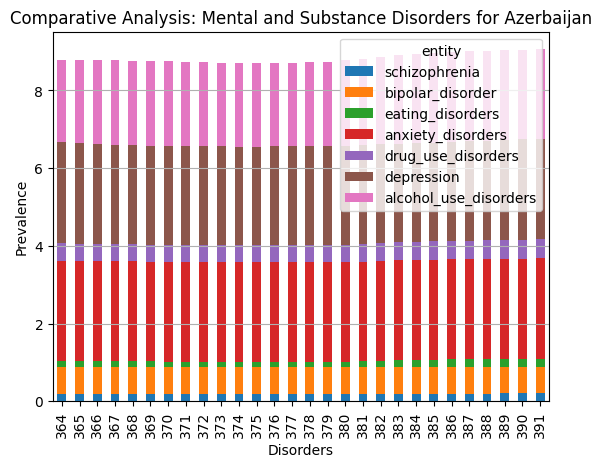

<Figure size 1200x600 with 0 Axes>

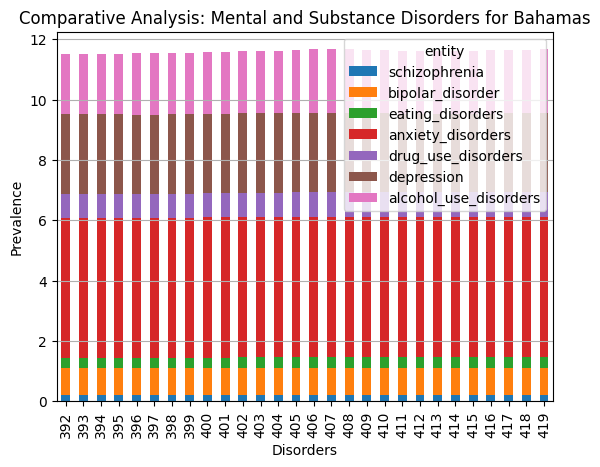

<Figure size 1200x600 with 0 Axes>

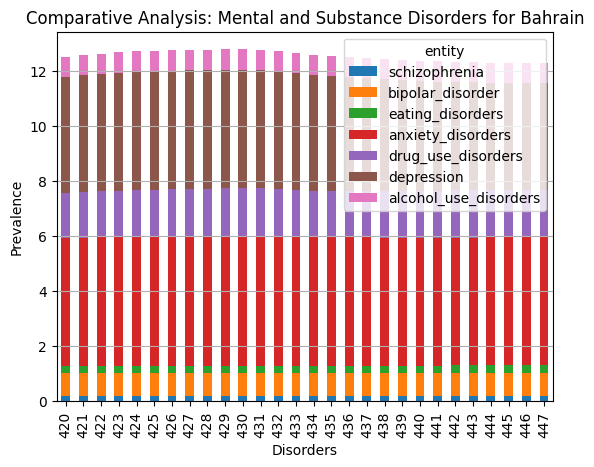

<Figure size 1200x600 with 0 Axes>

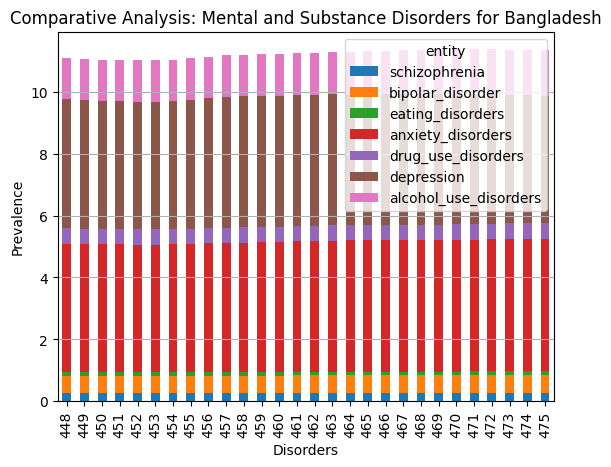

<Figure size 1200x600 with 0 Axes>

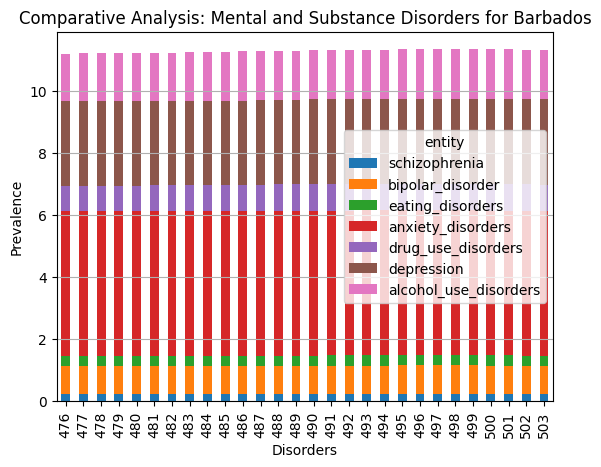

<Figure size 1200x600 with 0 Axes>

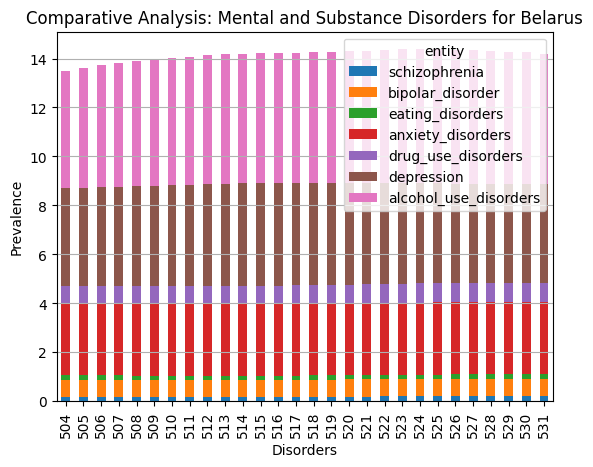

<Figure size 1200x600 with 0 Axes>

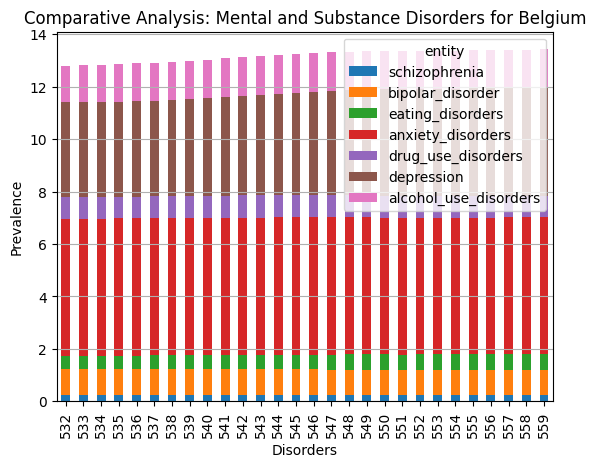

<Figure size 1200x600 with 0 Axes>

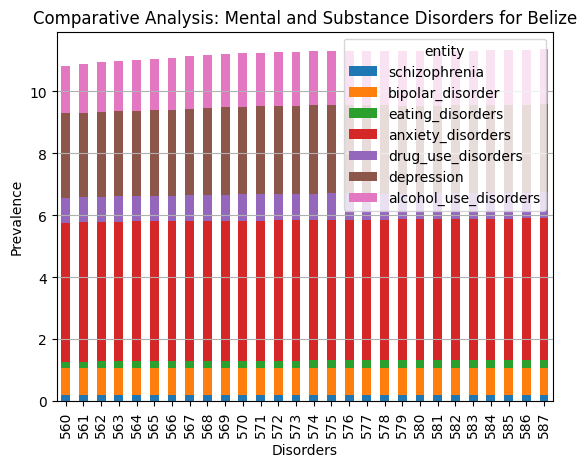

<Figure size 1200x600 with 0 Axes>

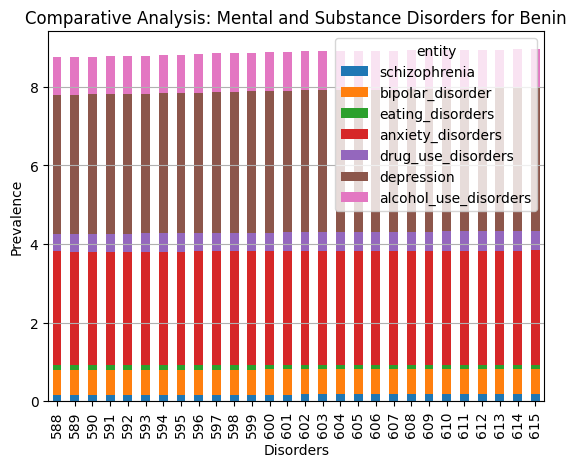

<Figure size 1200x600 with 0 Axes>

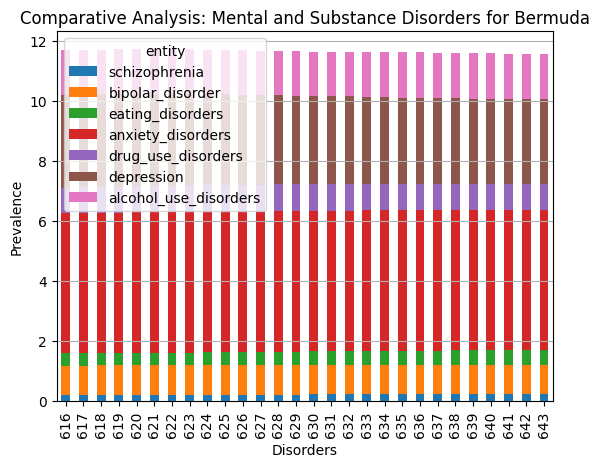

<Figure size 1200x600 with 0 Axes>

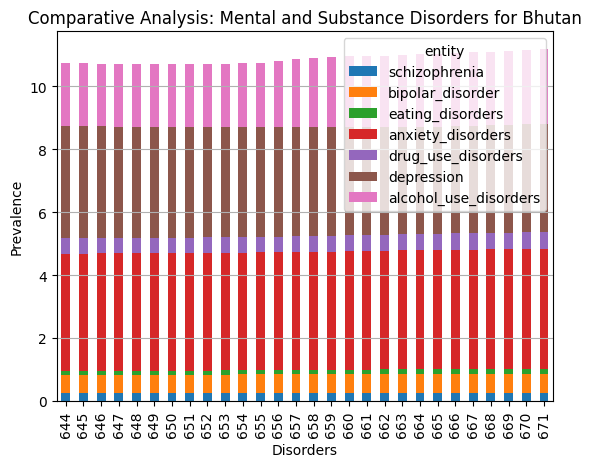

<Figure size 1200x600 with 0 Axes>

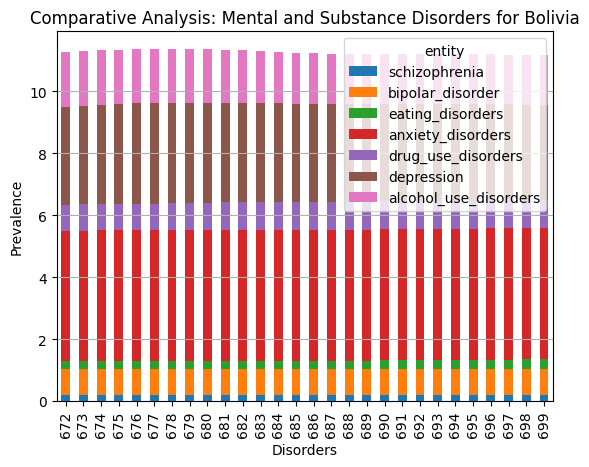

<Figure size 1200x600 with 0 Axes>

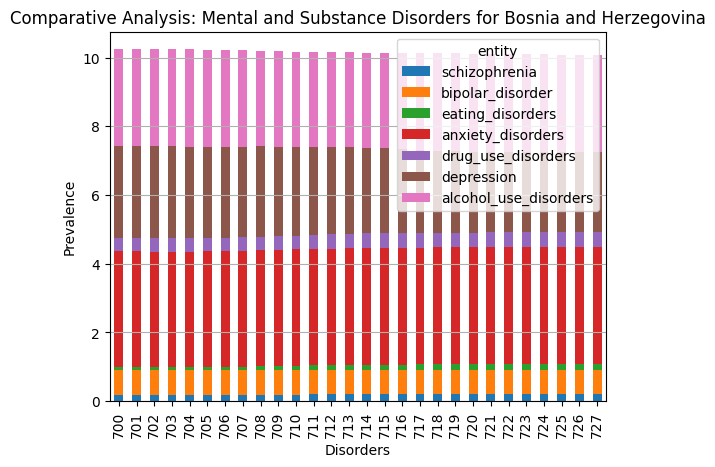

<Figure size 1200x600 with 0 Axes>

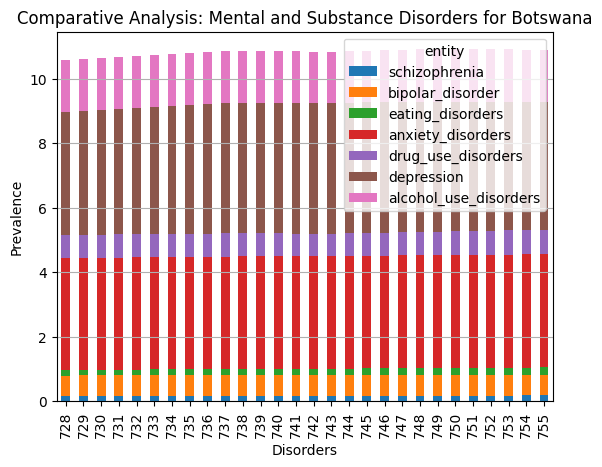

<Figure size 1200x600 with 0 Axes>

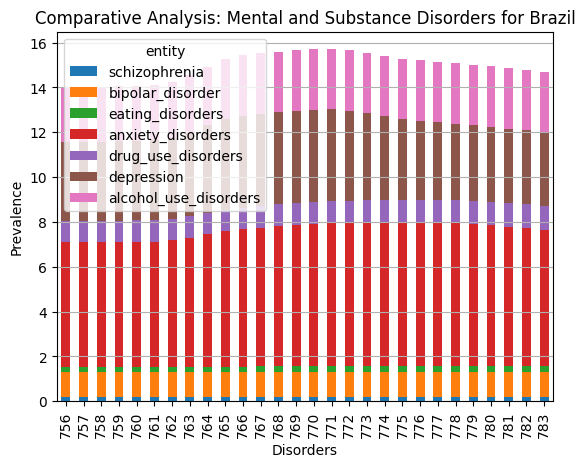

<Figure size 1200x600 with 0 Axes>

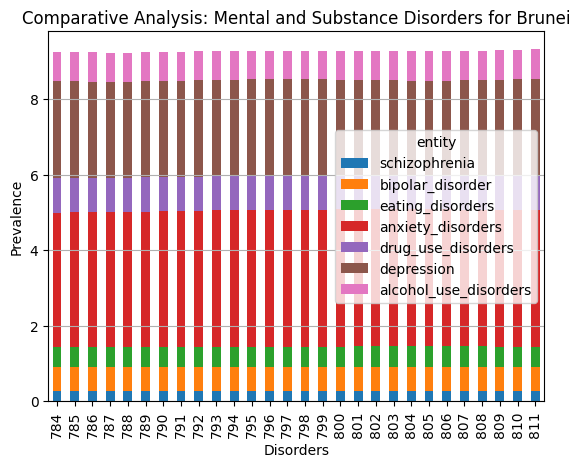

<Figure size 1200x600 with 0 Axes>

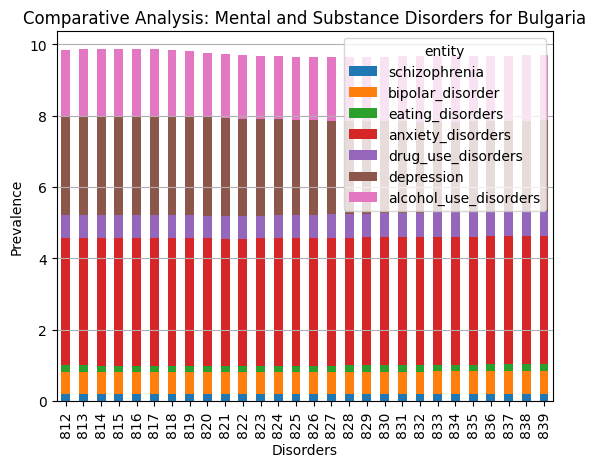

<Figure size 1200x600 with 0 Axes>

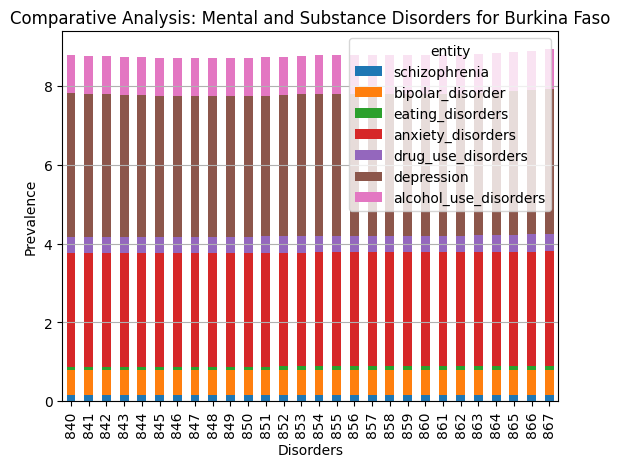

<Figure size 1200x600 with 0 Axes>

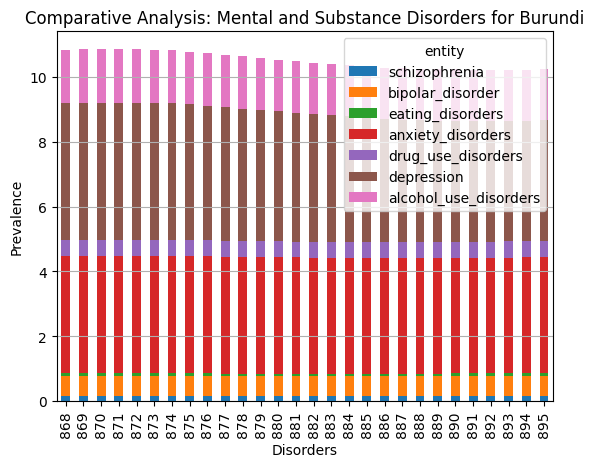

<Figure size 1200x600 with 0 Axes>

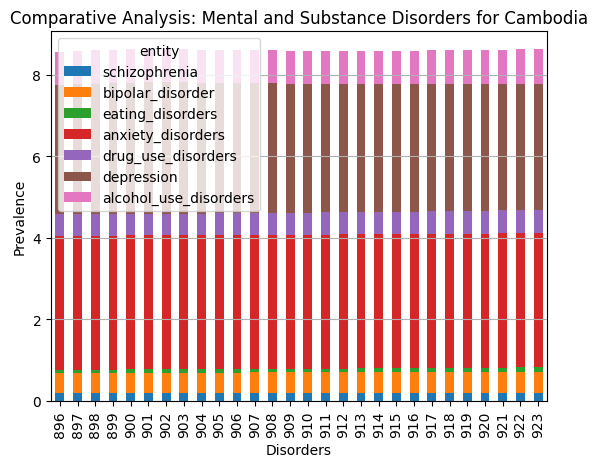

<Figure size 1200x600 with 0 Axes>

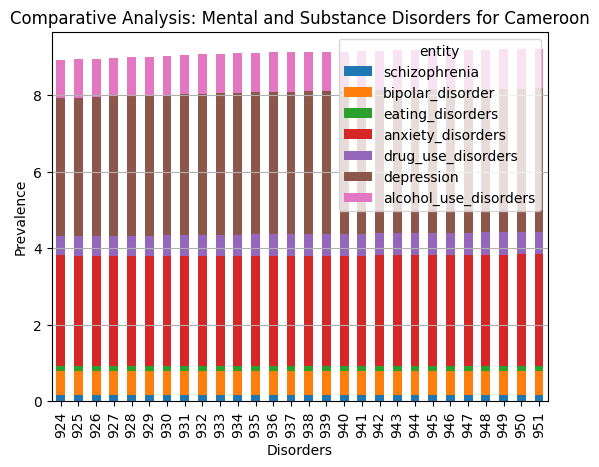

<Figure size 1200x600 with 0 Axes>

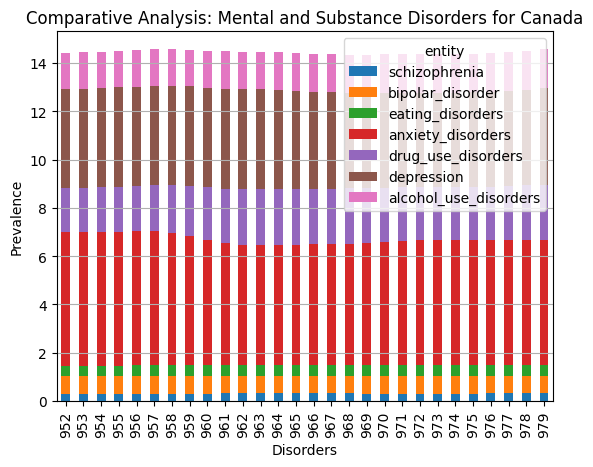

<Figure size 1200x600 with 0 Axes>

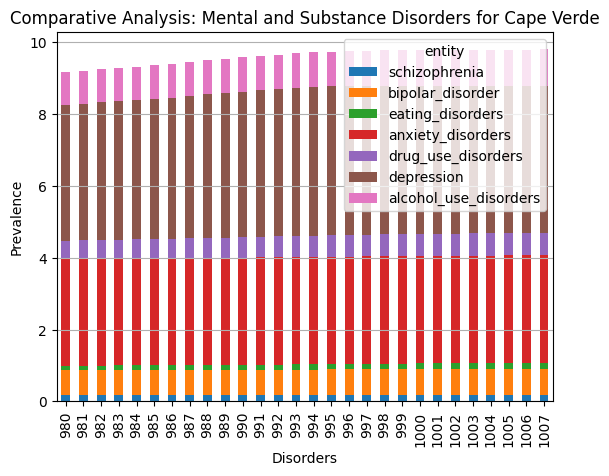

<Figure size 1200x600 with 0 Axes>

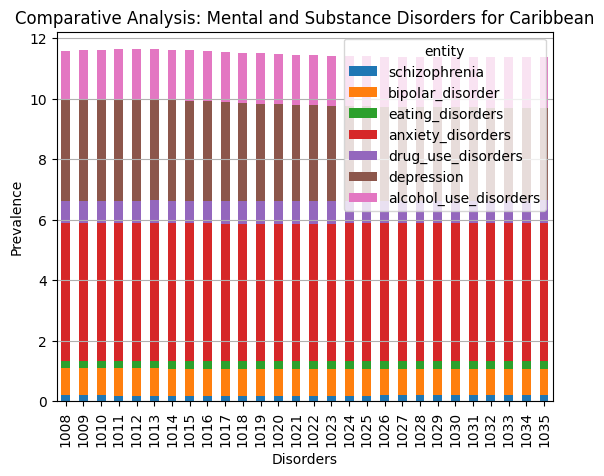

<Figure size 1200x600 with 0 Axes>

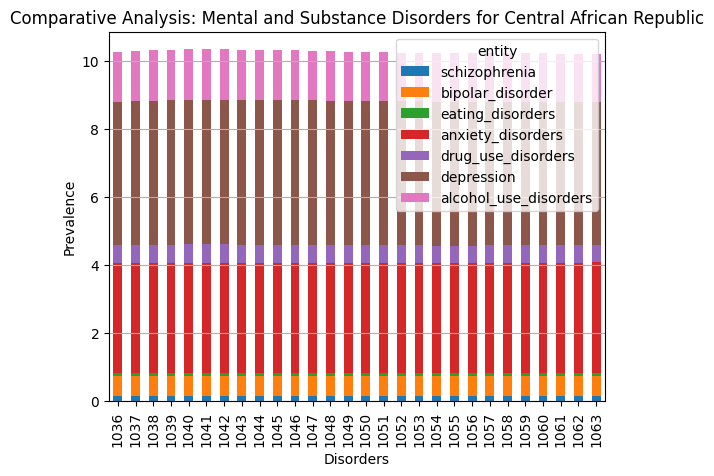

<Figure size 1200x600 with 0 Axes>

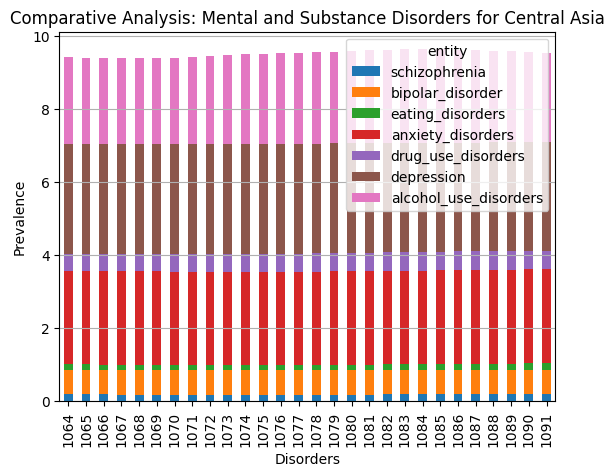

<Figure size 1200x600 with 0 Axes>

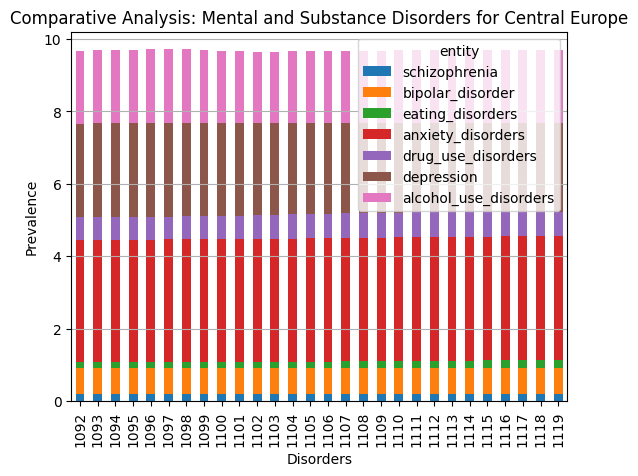

<Figure size 1200x600 with 0 Axes>

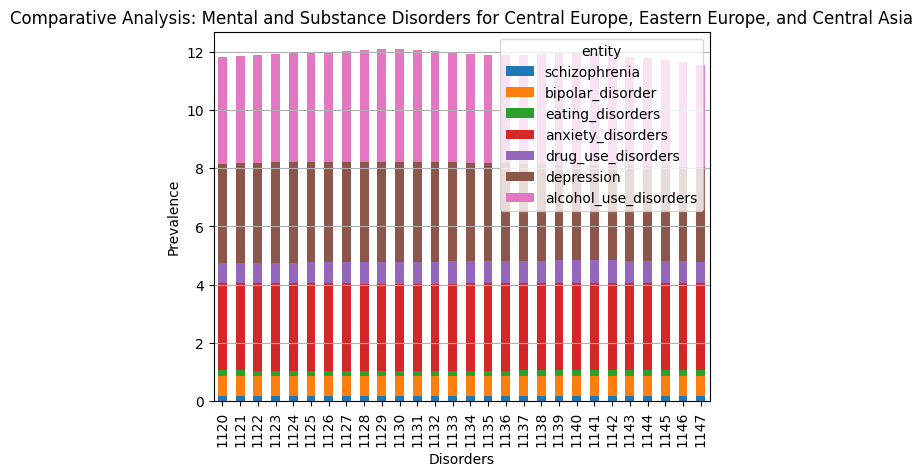

<Figure size 1200x600 with 0 Axes>

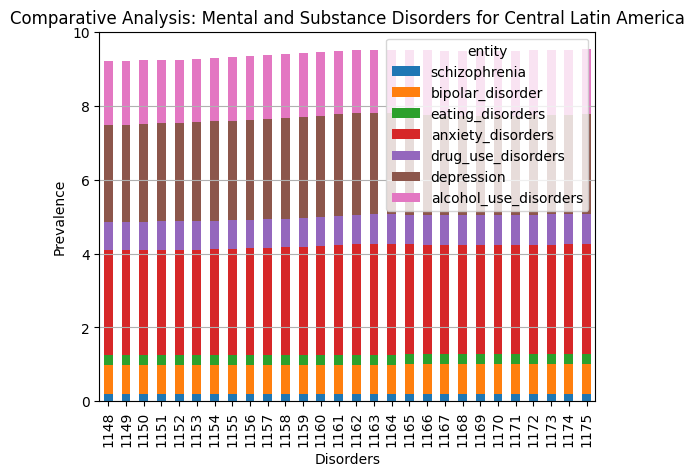

<Figure size 1200x600 with 0 Axes>

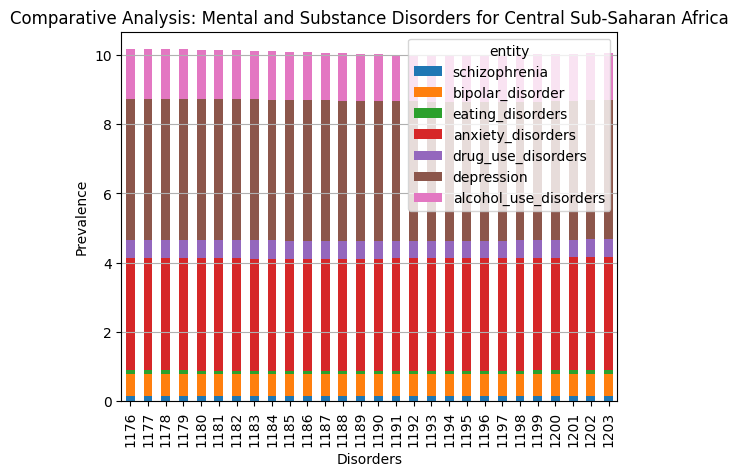

<Figure size 1200x600 with 0 Axes>

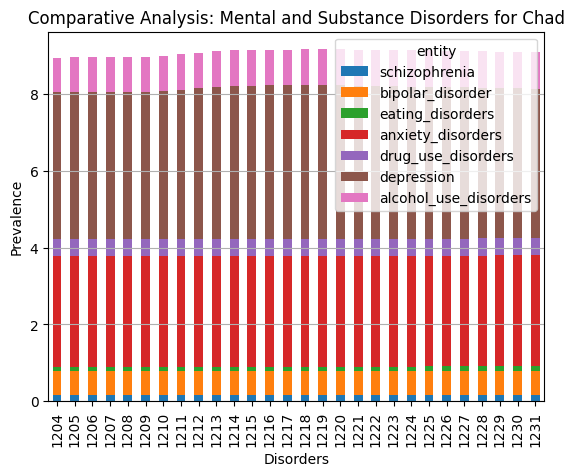

<Figure size 1200x600 with 0 Axes>

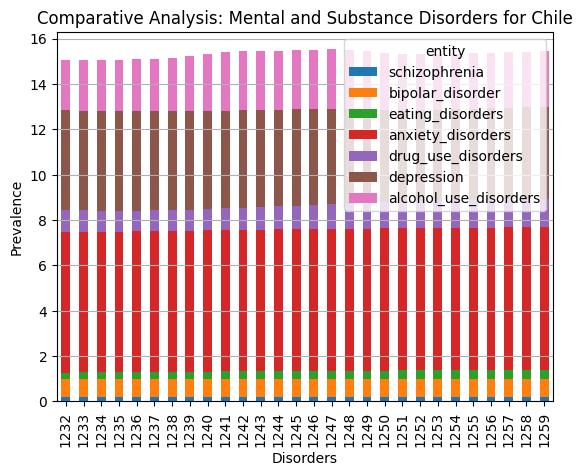

<Figure size 1200x600 with 0 Axes>

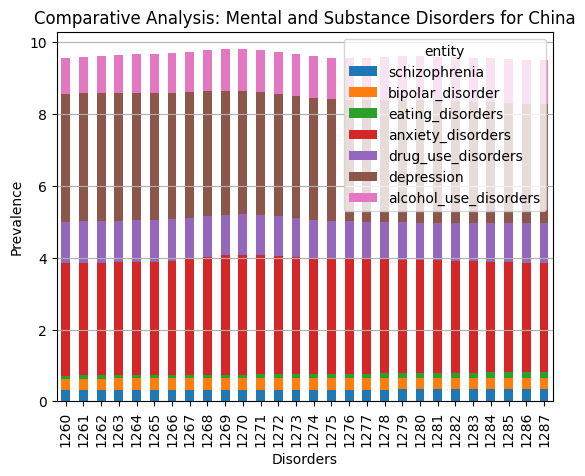

<Figure size 1200x600 with 0 Axes>

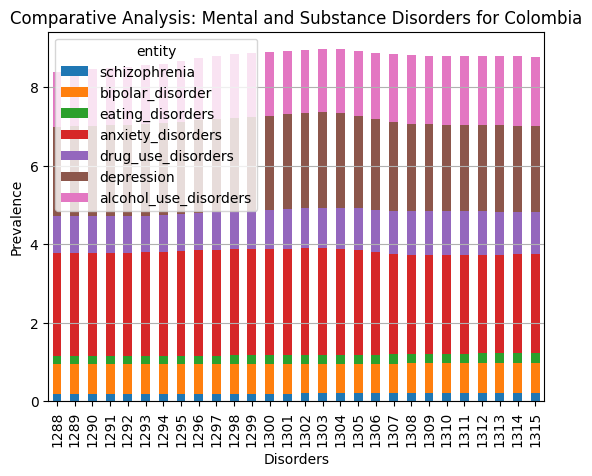

<Figure size 1200x600 with 0 Axes>

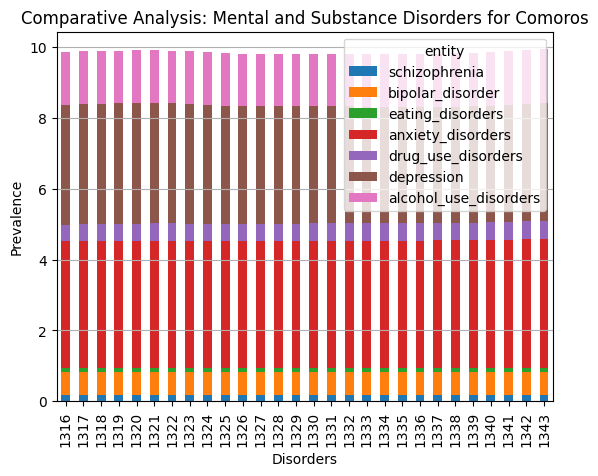

<Figure size 1200x600 with 0 Axes>

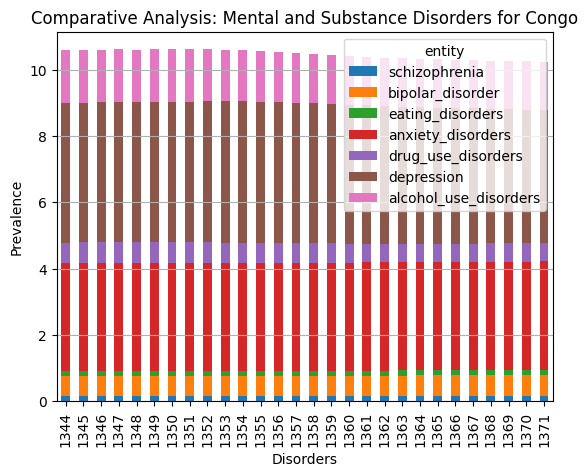

<Figure size 1200x600 with 0 Axes>

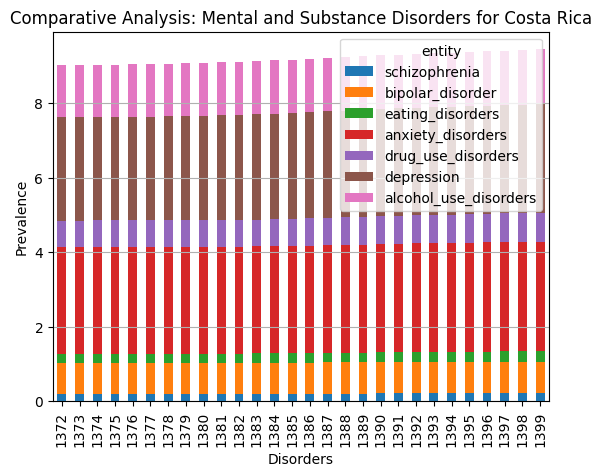

<Figure size 1200x600 with 0 Axes>

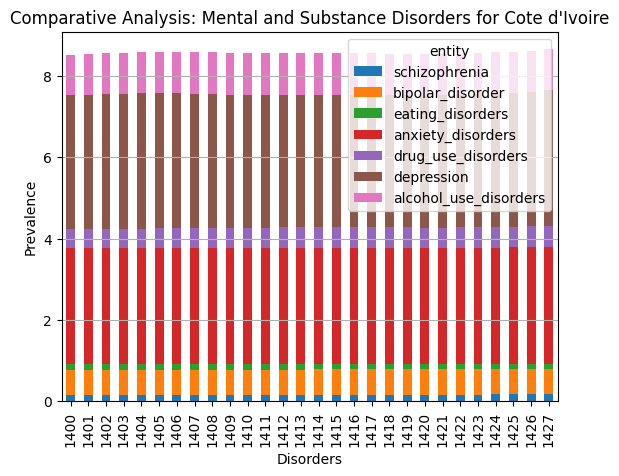

<Figure size 1200x600 with 0 Axes>

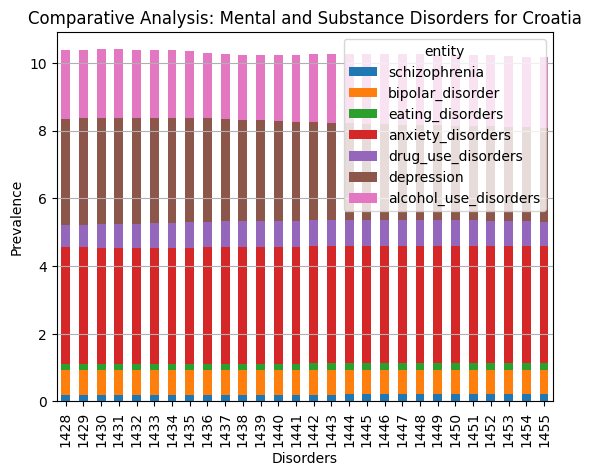

<Figure size 1200x600 with 0 Axes>

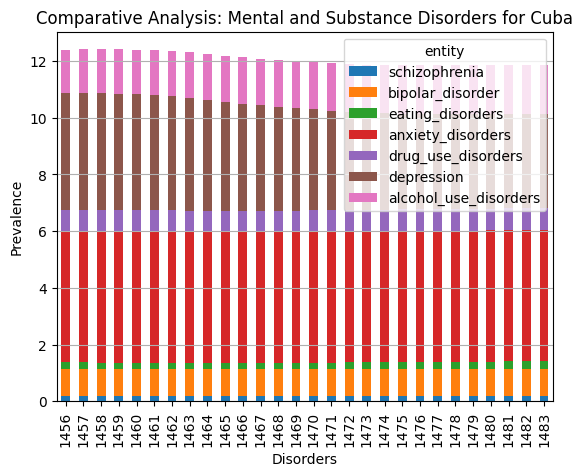

<Figure size 1200x600 with 0 Axes>

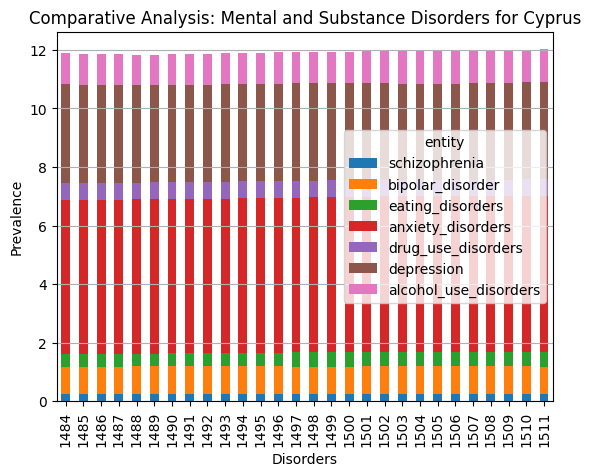

<Figure size 1200x600 with 0 Axes>

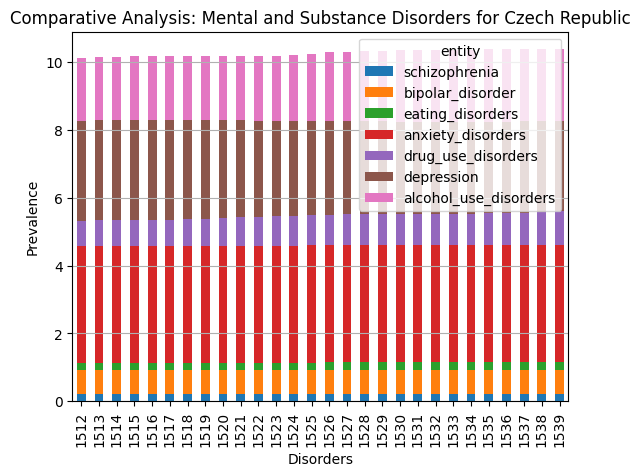

<Figure size 1200x600 with 0 Axes>

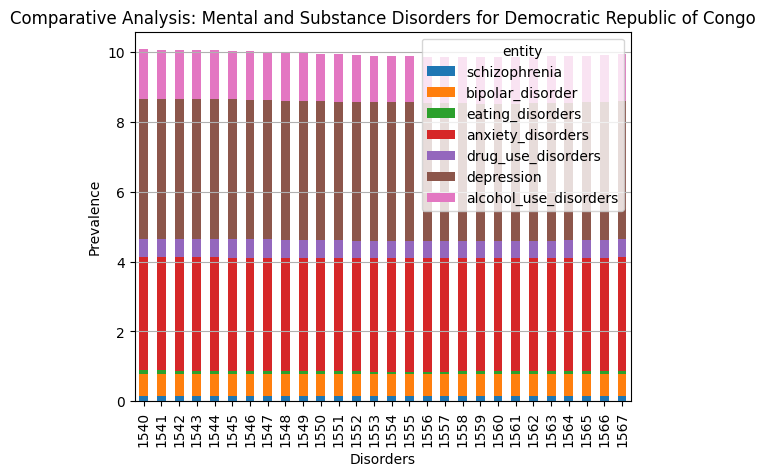

<Figure size 1200x600 with 0 Axes>

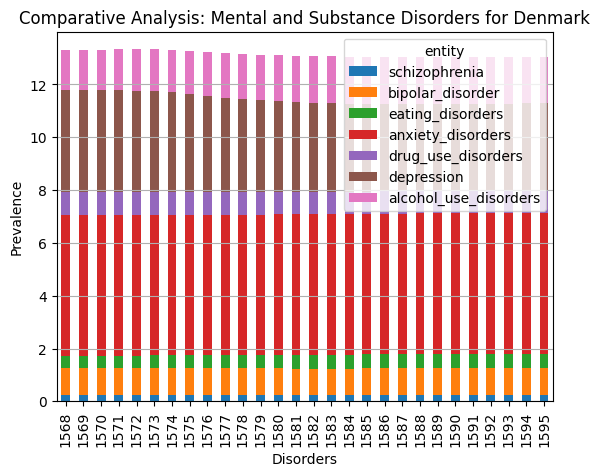

<Figure size 1200x600 with 0 Axes>

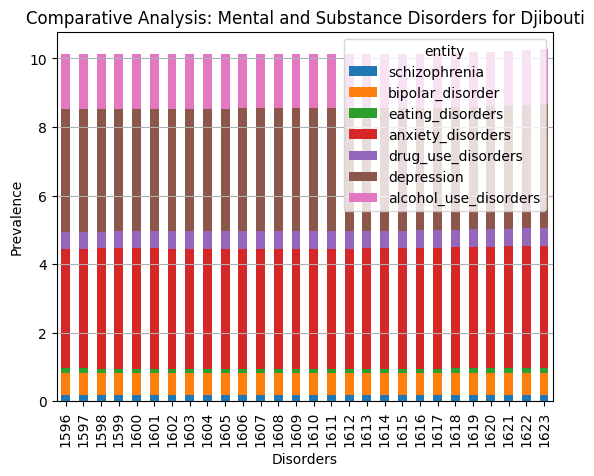

<Figure size 1200x600 with 0 Axes>

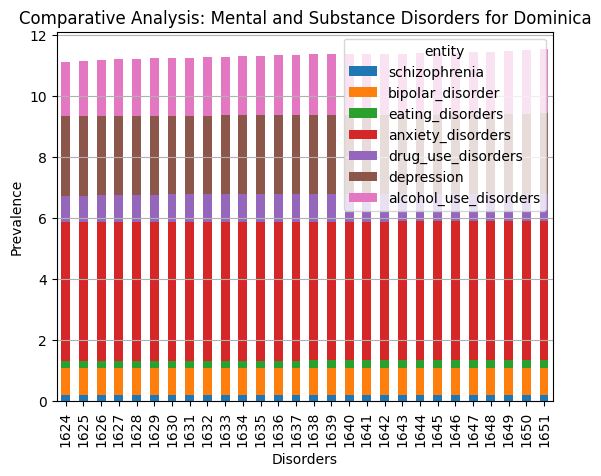

<Figure size 1200x600 with 0 Axes>

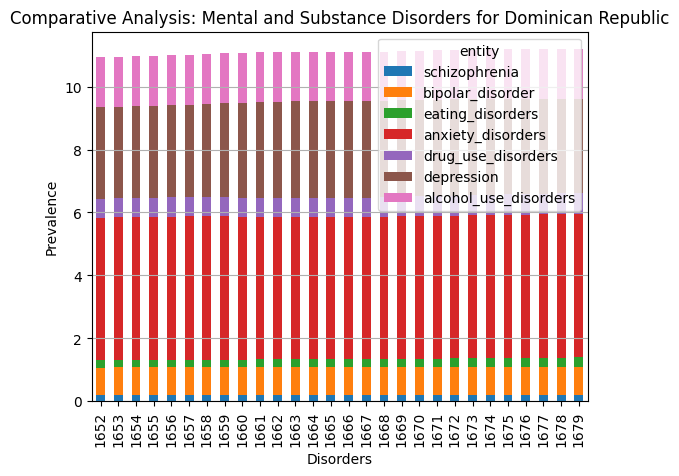

<Figure size 1200x600 with 0 Axes>

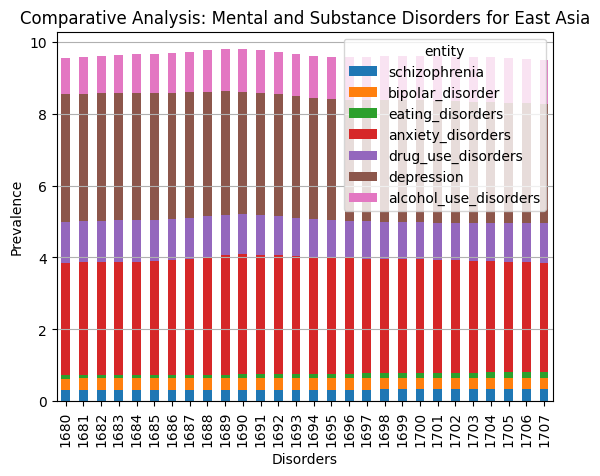

<Figure size 1200x600 with 0 Axes>

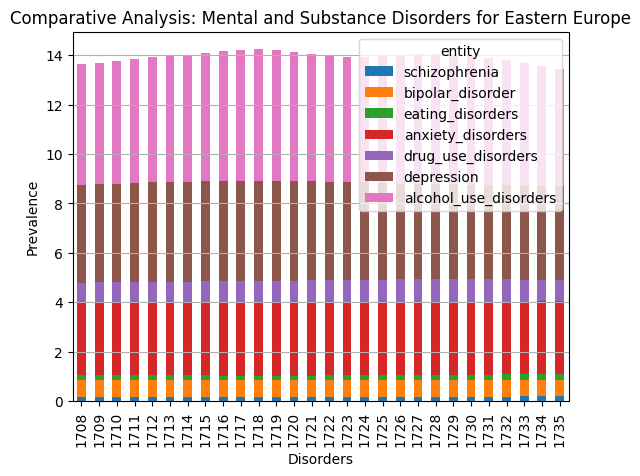

<Figure size 1200x600 with 0 Axes>

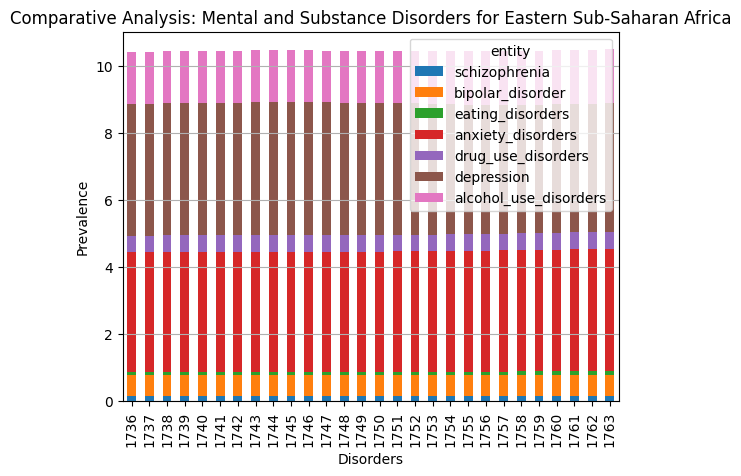

<Figure size 1200x600 with 0 Axes>

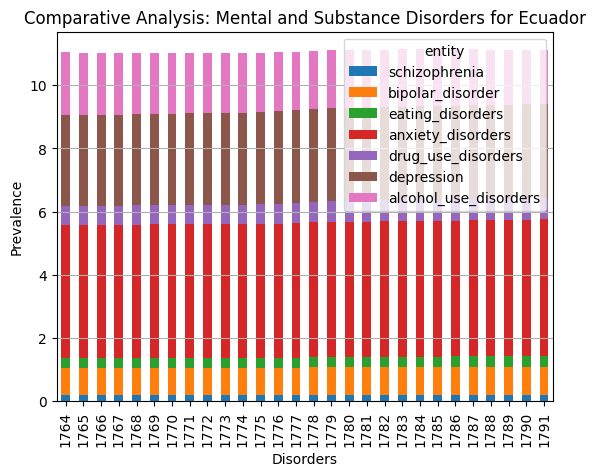

<Figure size 1200x600 with 0 Axes>

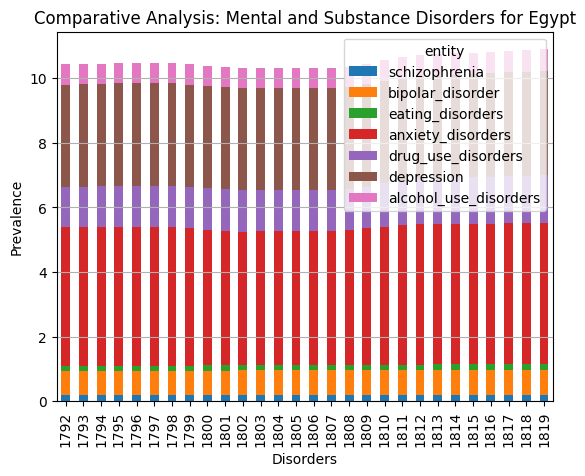

<Figure size 1200x600 with 0 Axes>

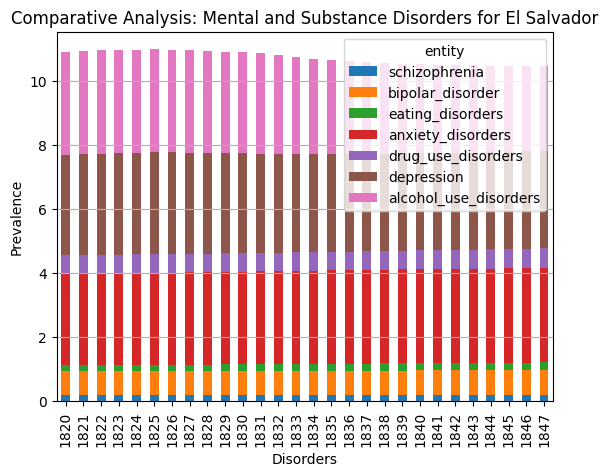

<Figure size 1200x600 with 0 Axes>

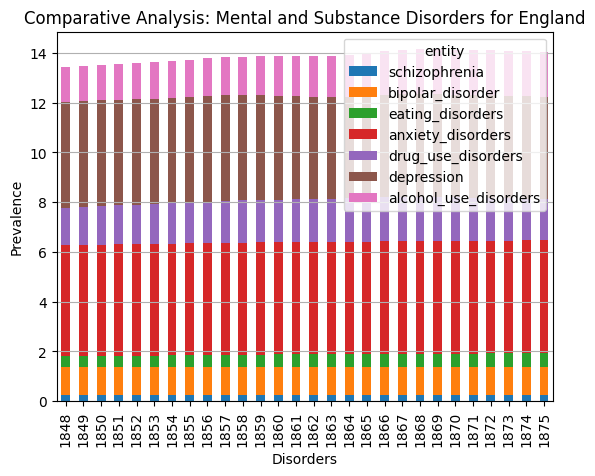

<Figure size 1200x600 with 0 Axes>

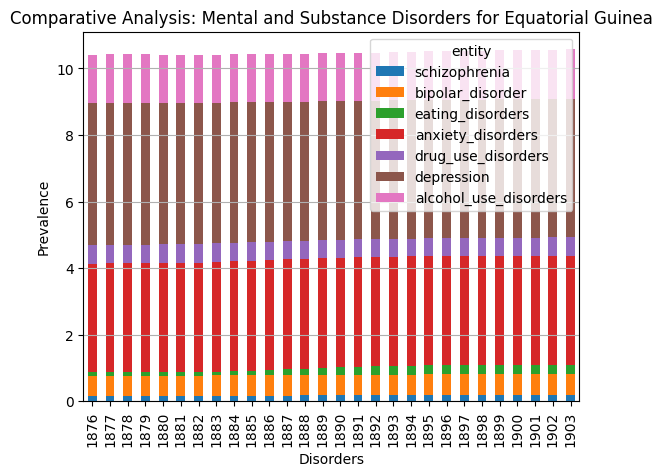

<Figure size 1200x600 with 0 Axes>

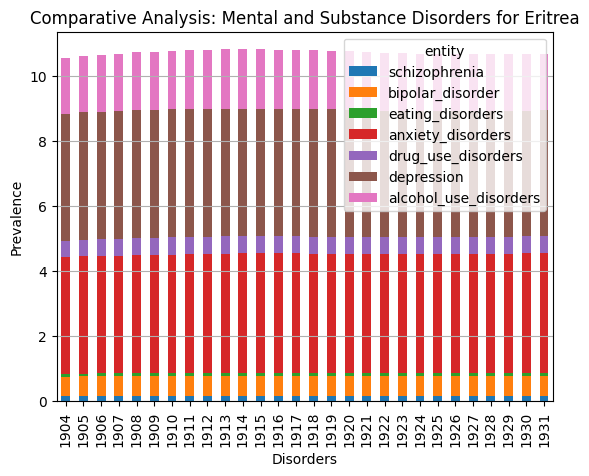

<Figure size 1200x600 with 0 Axes>

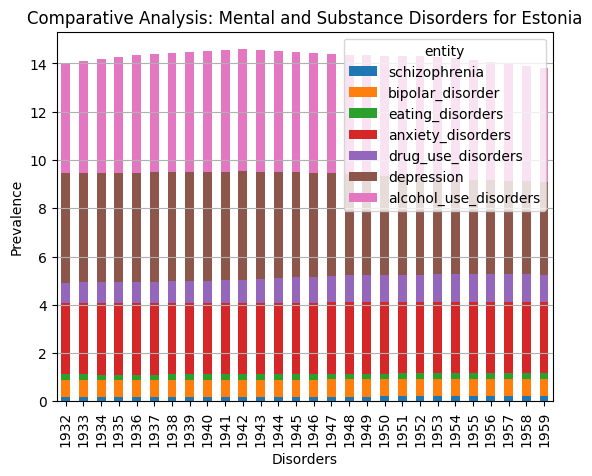

<Figure size 1200x600 with 0 Axes>

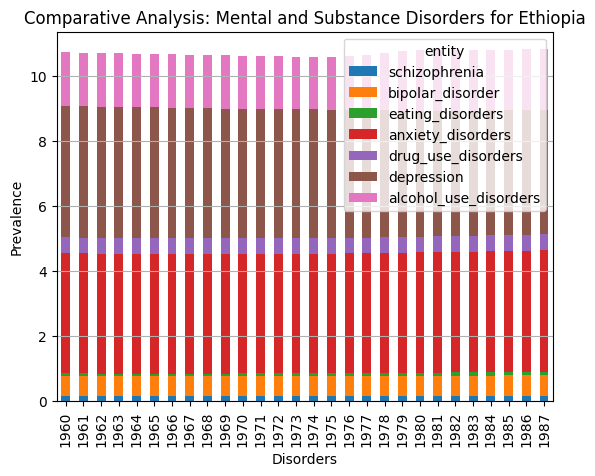

<Figure size 1200x600 with 0 Axes>

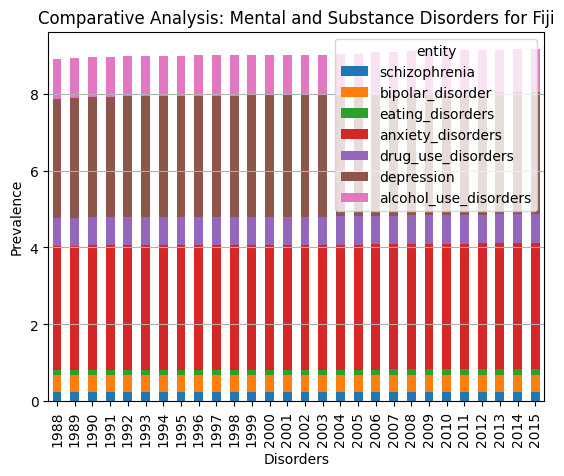

<Figure size 1200x600 with 0 Axes>

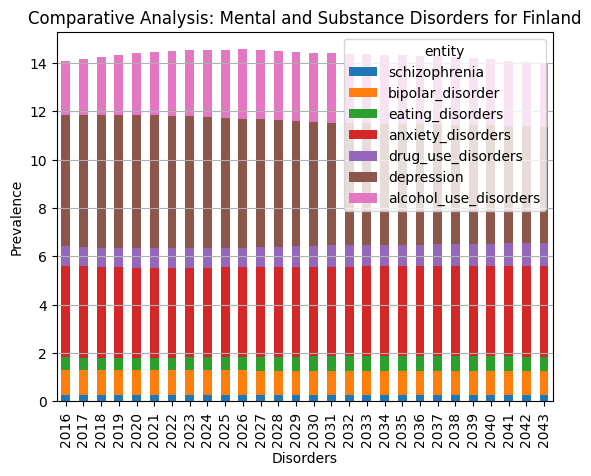

<Figure size 1200x600 with 0 Axes>

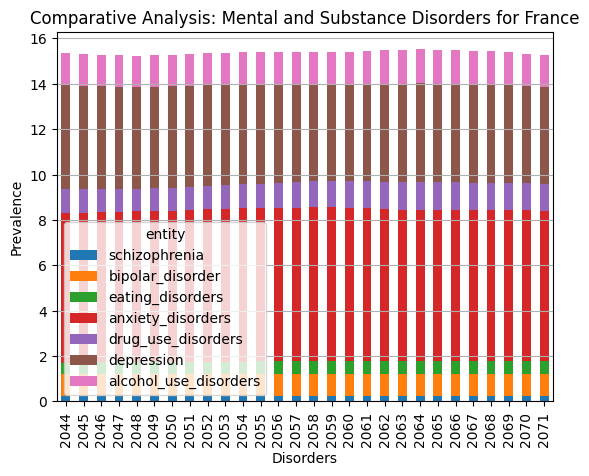

<Figure size 1200x600 with 0 Axes>

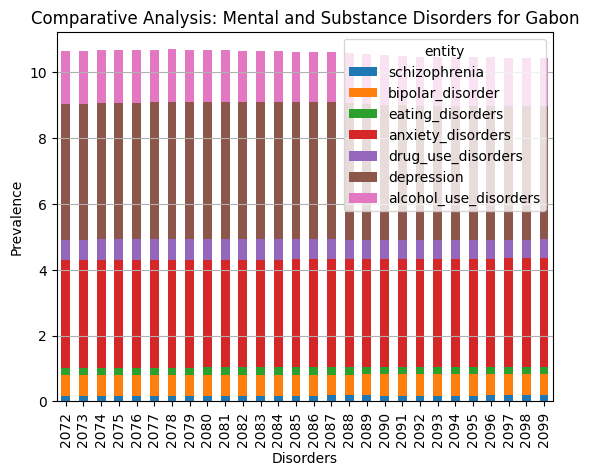

<Figure size 1200x600 with 0 Axes>

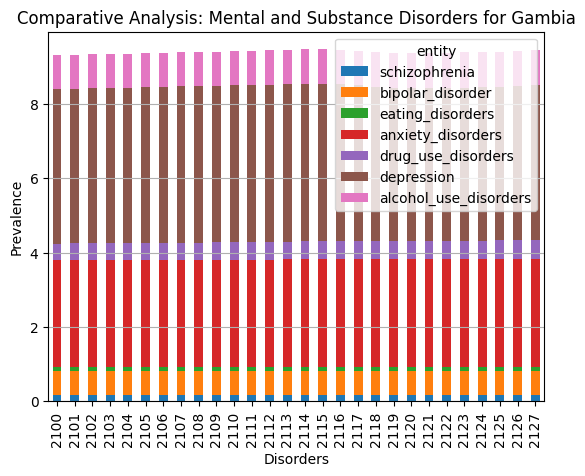

<Figure size 1200x600 with 0 Axes>

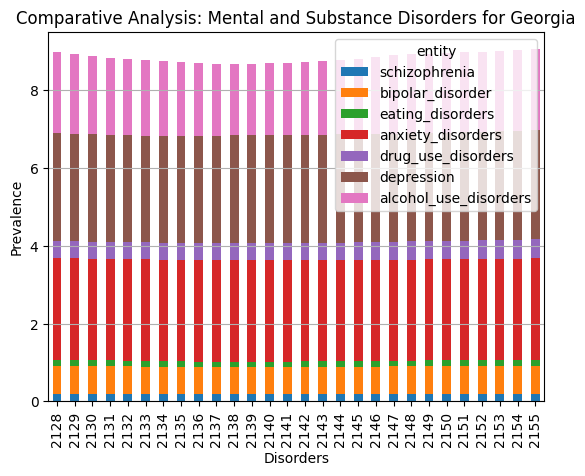

<Figure size 1200x600 with 0 Axes>

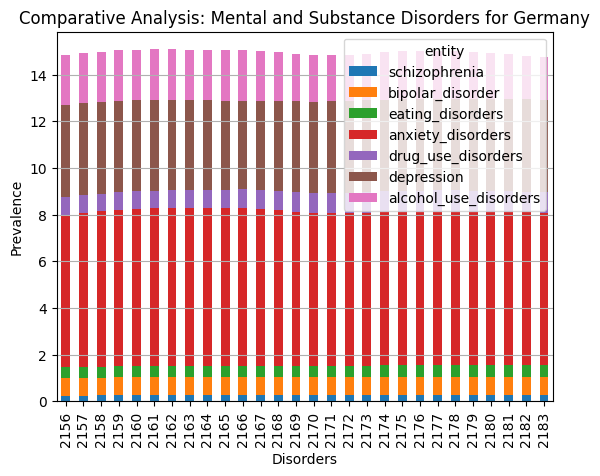

<Figure size 1200x600 with 0 Axes>

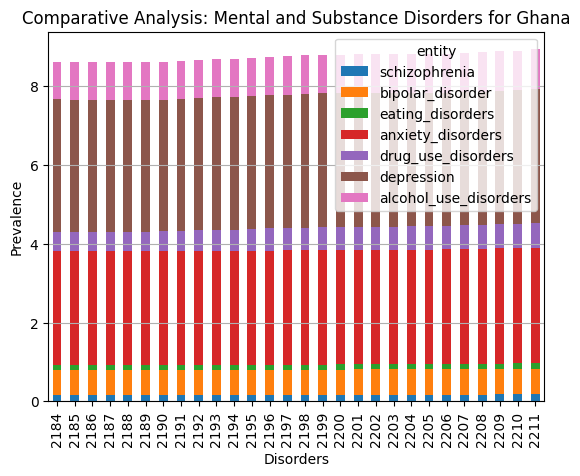

<Figure size 1200x600 with 0 Axes>

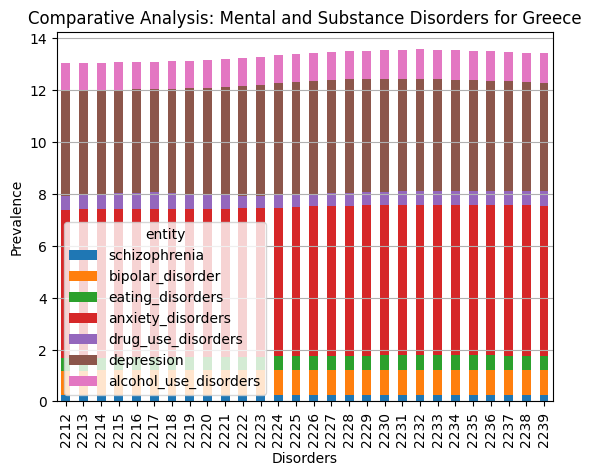

<Figure size 1200x600 with 0 Axes>

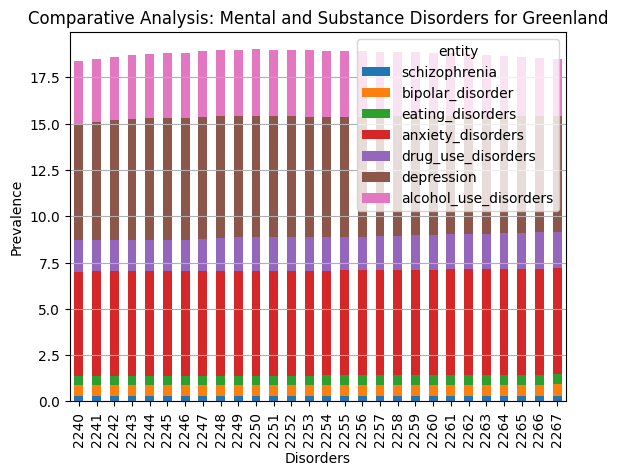

<Figure size 1200x600 with 0 Axes>

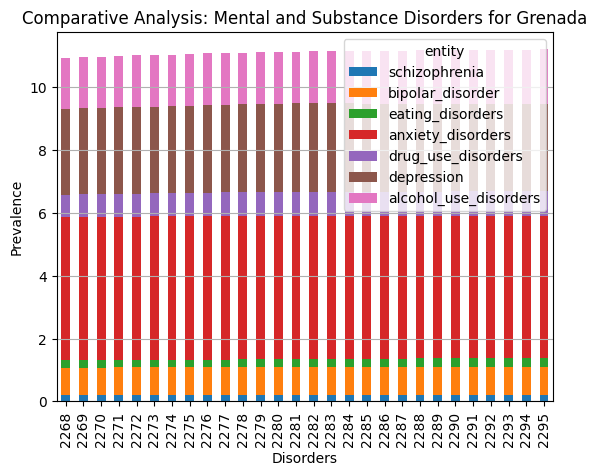

<Figure size 1200x600 with 0 Axes>

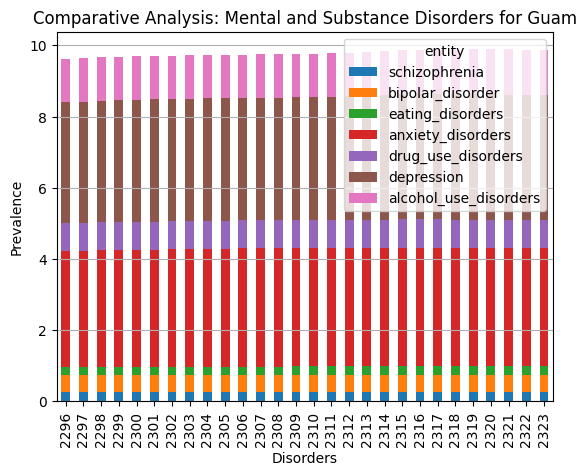

<Figure size 1200x600 with 0 Axes>

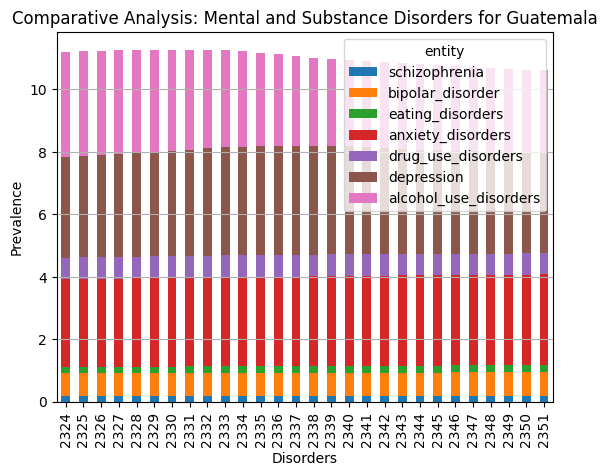

<Figure size 1200x600 with 0 Axes>

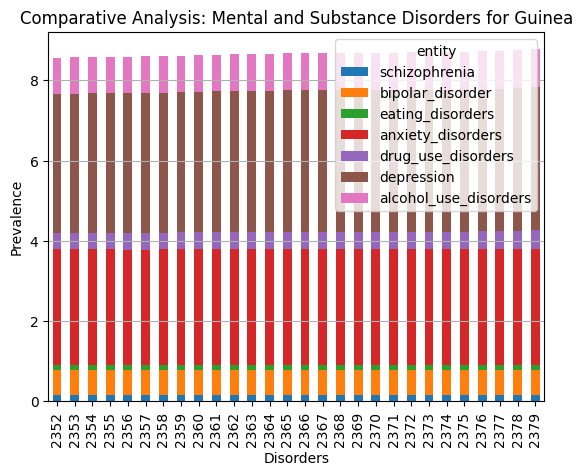

<Figure size 1200x600 with 0 Axes>

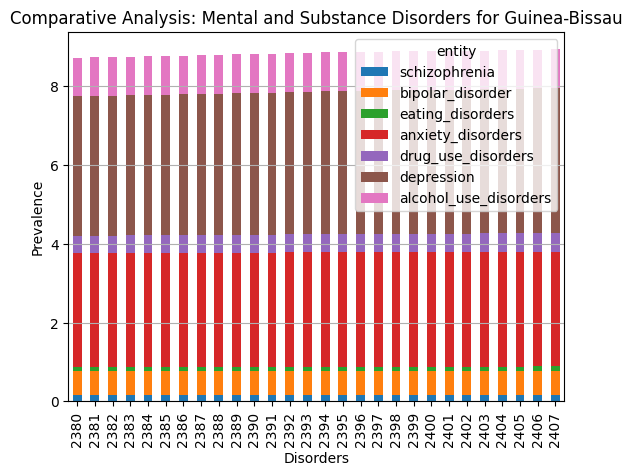

<Figure size 1200x600 with 0 Axes>

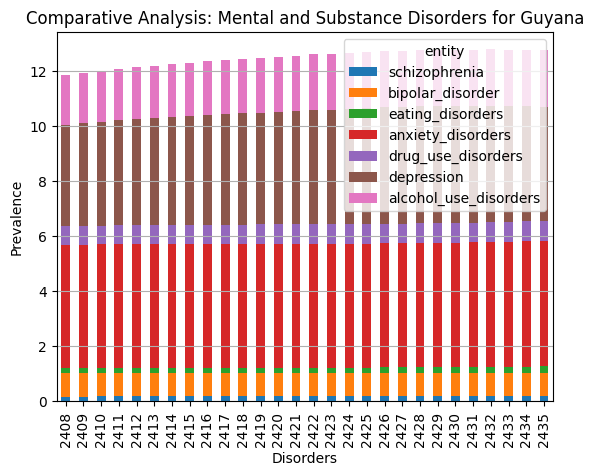

<Figure size 1200x600 with 0 Axes>

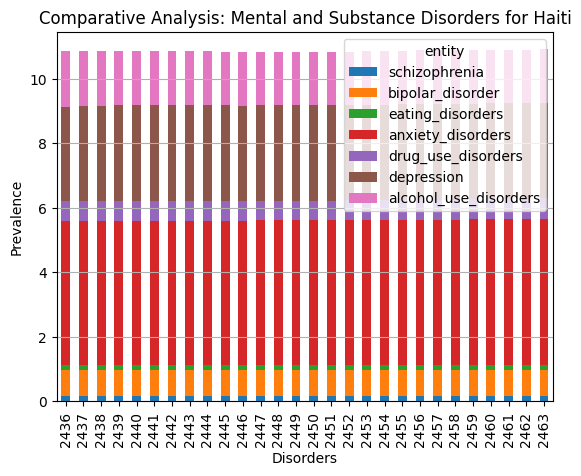

<Figure size 1200x600 with 0 Axes>

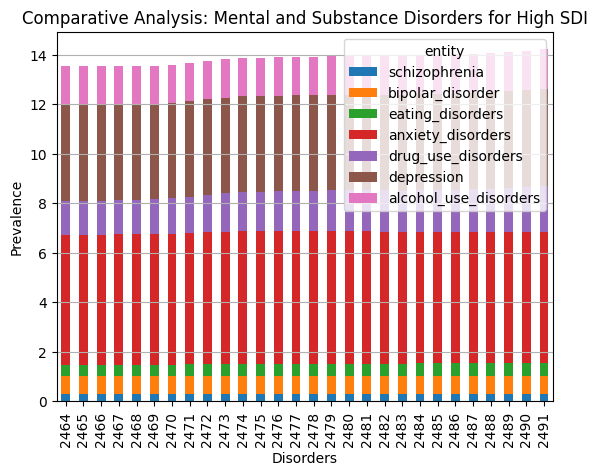

<Figure size 1200x600 with 0 Axes>

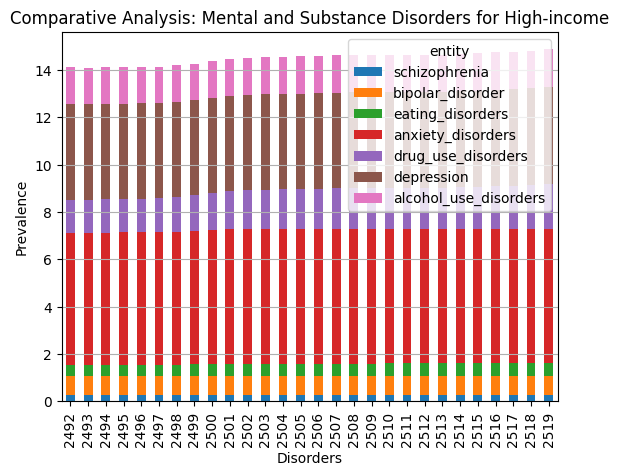

<Figure size 1200x600 with 0 Axes>

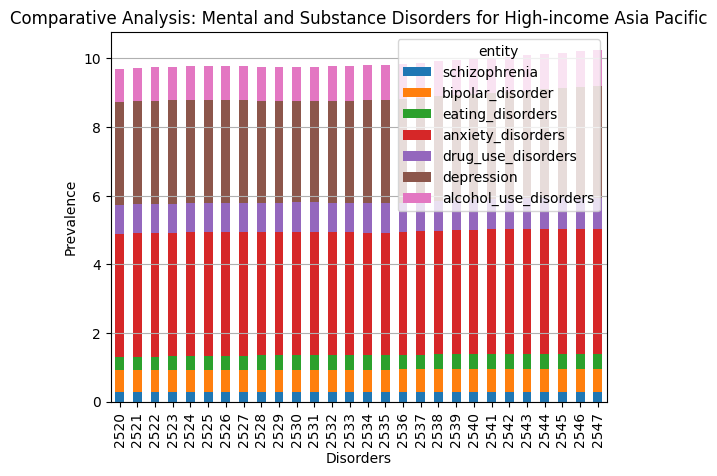

<Figure size 1200x600 with 0 Axes>

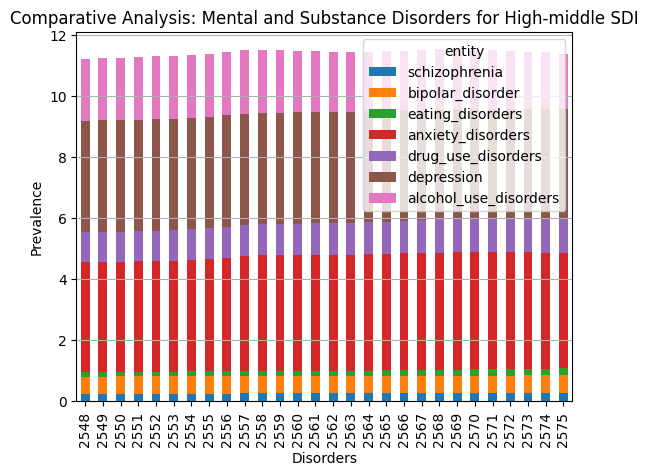

<Figure size 1200x600 with 0 Axes>

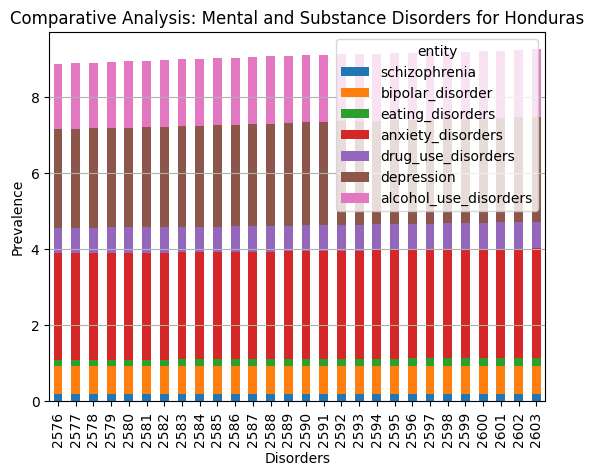

<Figure size 1200x600 with 0 Axes>

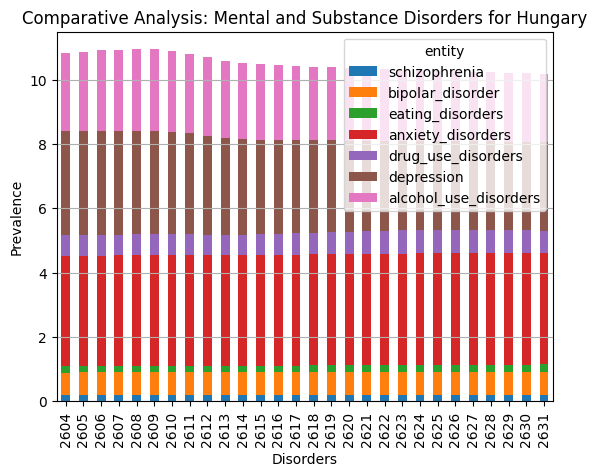

<Figure size 1200x600 with 0 Axes>

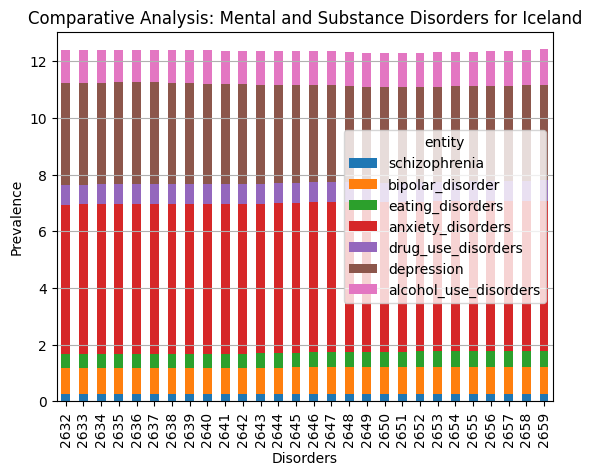

<Figure size 1200x600 with 0 Axes>

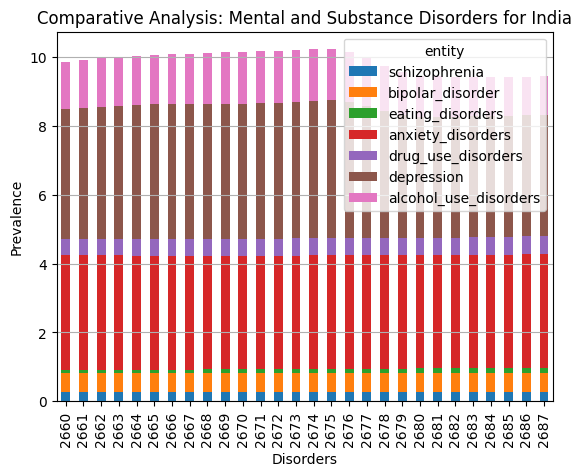

<Figure size 1200x600 with 0 Axes>

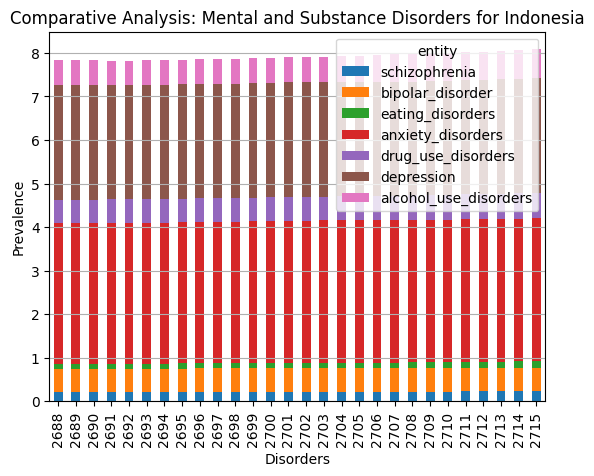

<Figure size 1200x600 with 0 Axes>

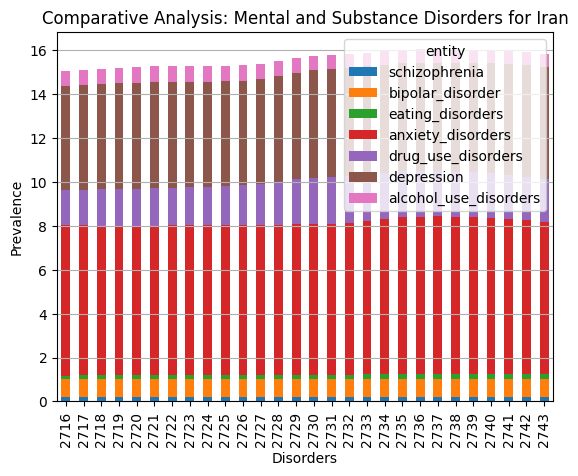

<Figure size 1200x600 with 0 Axes>

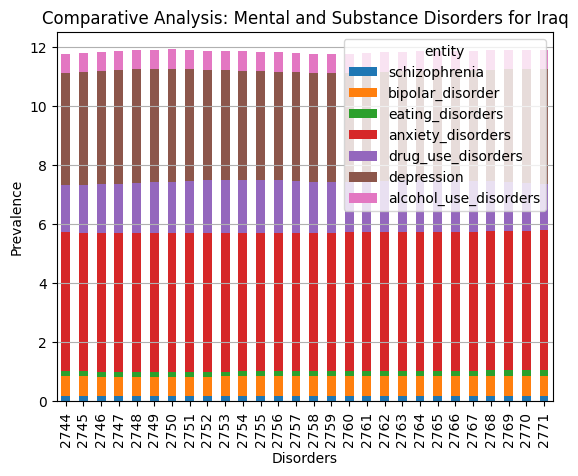

<Figure size 1200x600 with 0 Axes>

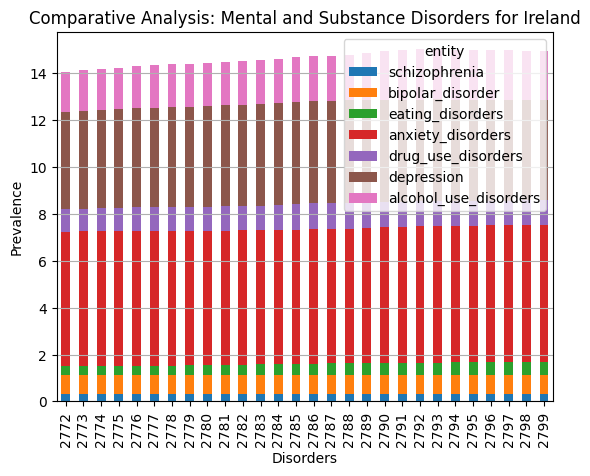

<Figure size 1200x600 with 0 Axes>

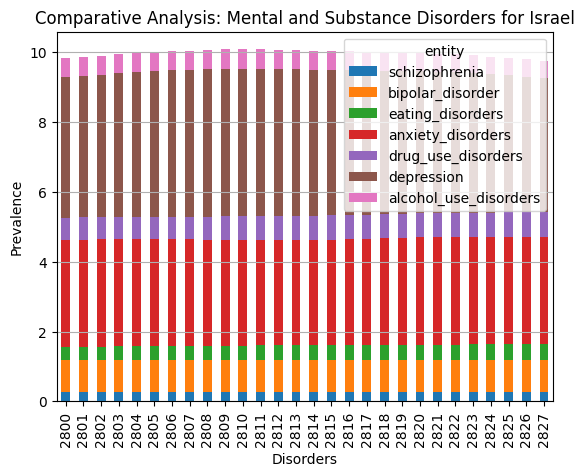

<Figure size 1200x600 with 0 Axes>

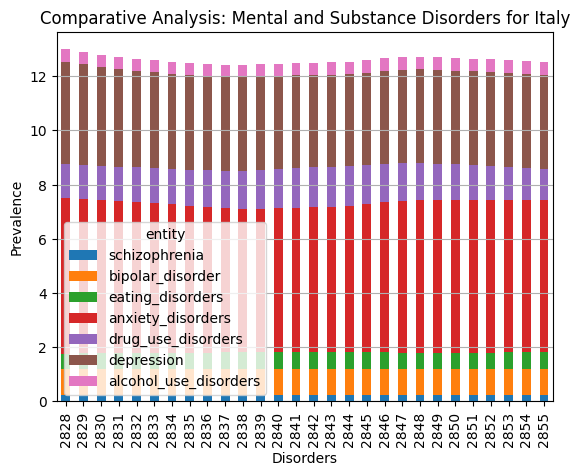

<Figure size 1200x600 with 0 Axes>

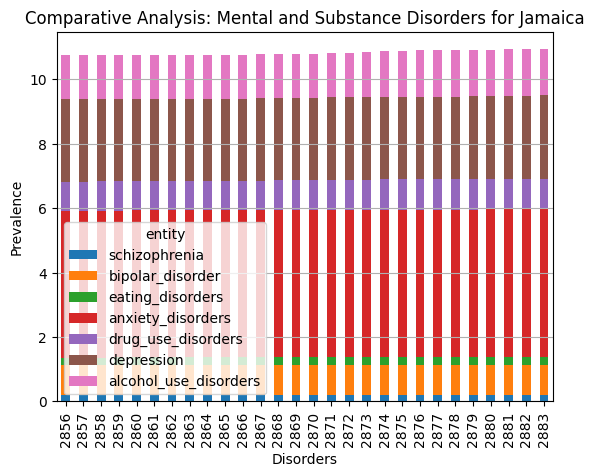

<Figure size 1200x600 with 0 Axes>

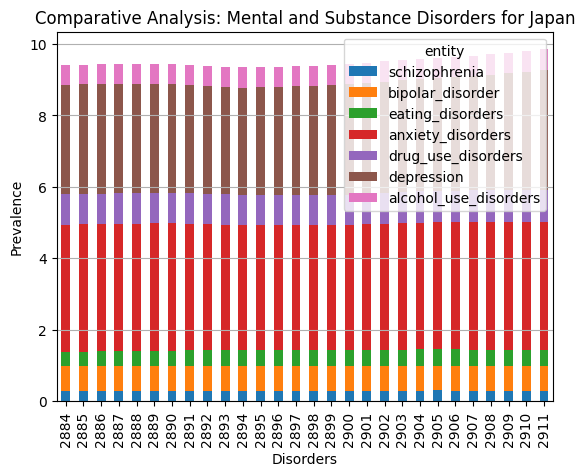

<Figure size 1200x600 with 0 Axes>

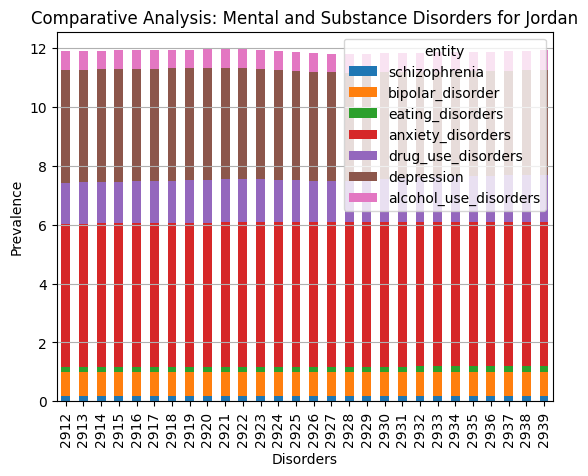

<Figure size 1200x600 with 0 Axes>

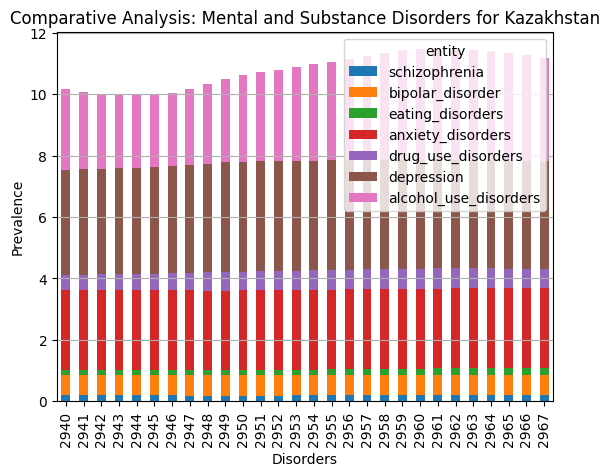

<Figure size 1200x600 with 0 Axes>

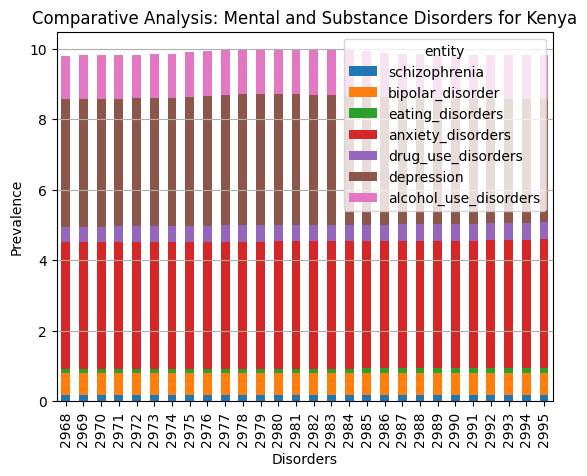

<Figure size 1200x600 with 0 Axes>

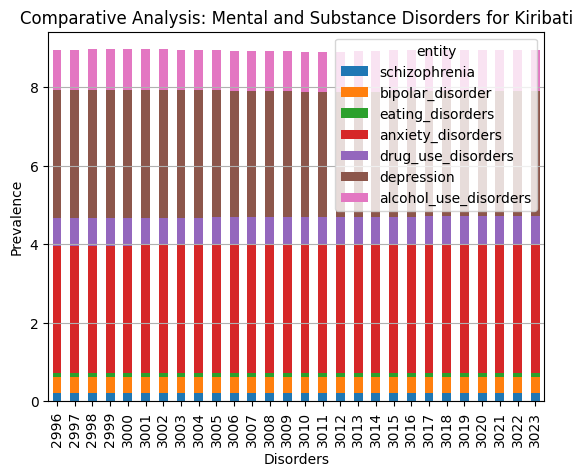

<Figure size 1200x600 with 0 Axes>

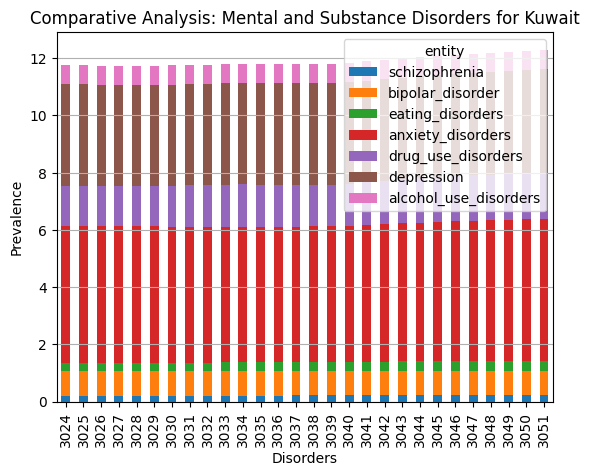

<Figure size 1200x600 with 0 Axes>

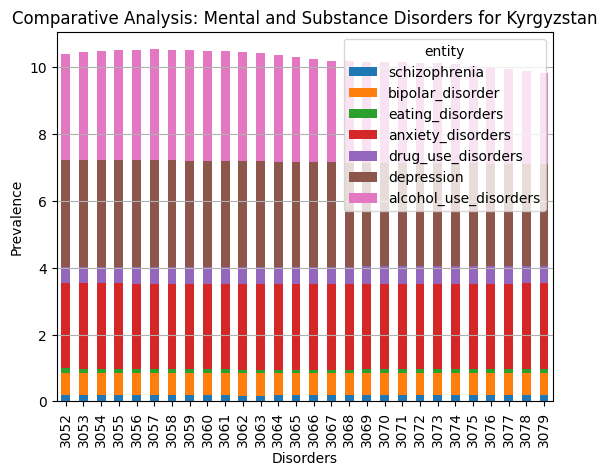

<Figure size 1200x600 with 0 Axes>

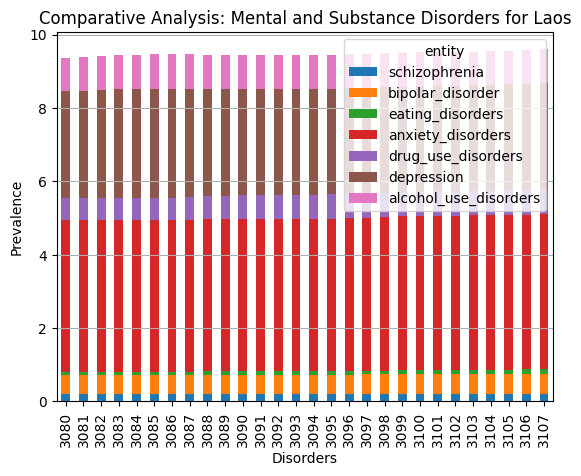

<Figure size 1200x600 with 0 Axes>

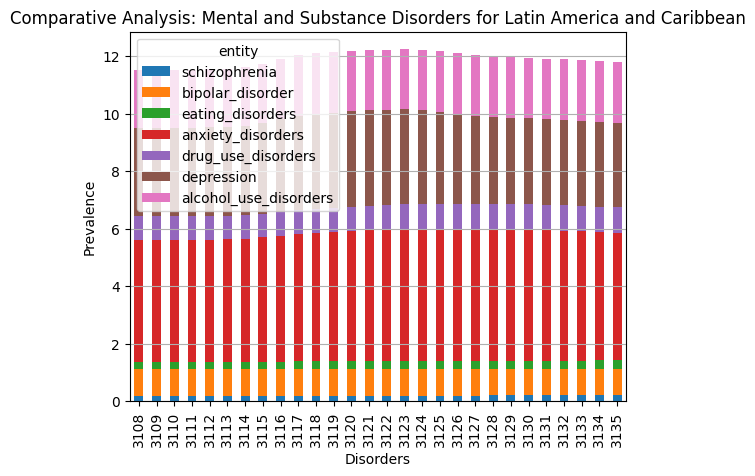

<Figure size 1200x600 with 0 Axes>

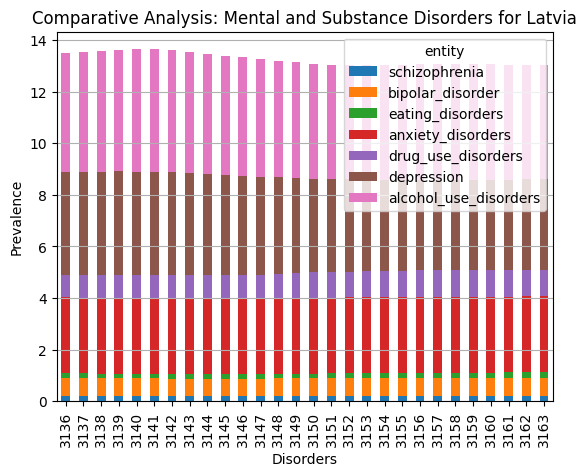

<Figure size 1200x600 with 0 Axes>

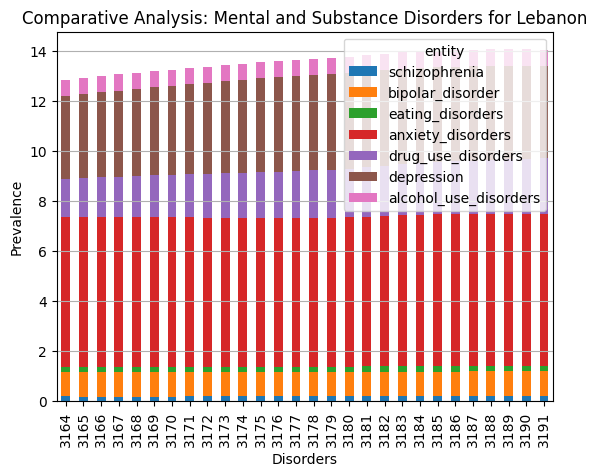

<Figure size 1200x600 with 0 Axes>

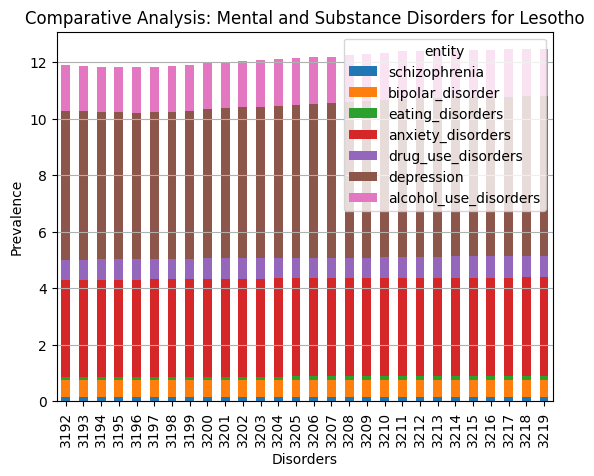

<Figure size 1200x600 with 0 Axes>

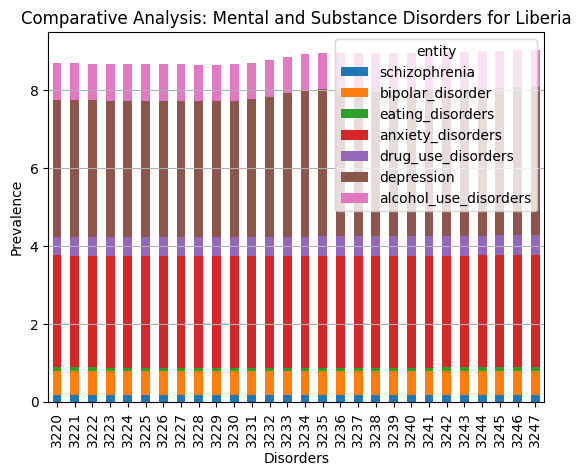

<Figure size 1200x600 with 0 Axes>

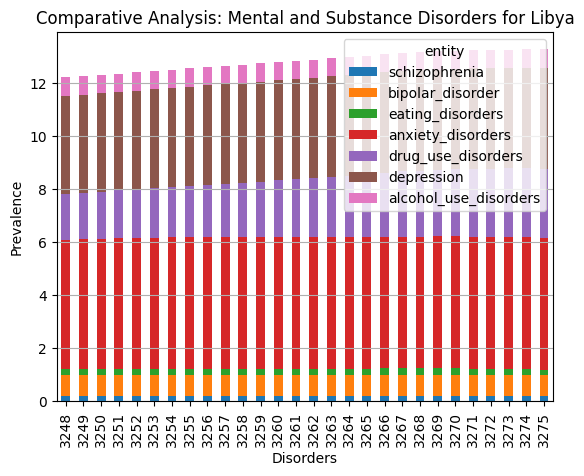

<Figure size 1200x600 with 0 Axes>

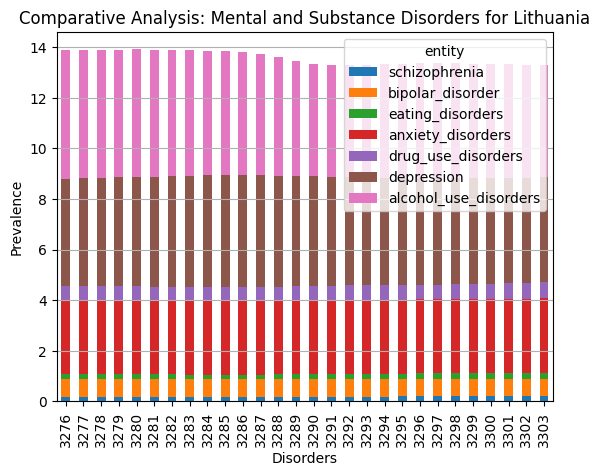

<Figure size 1200x600 with 0 Axes>

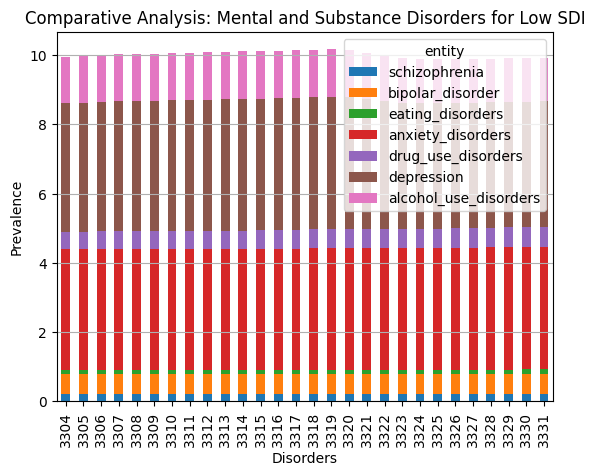

<Figure size 1200x600 with 0 Axes>

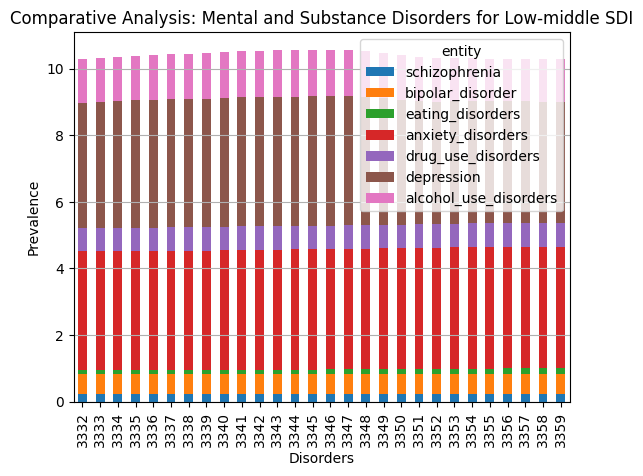

<Figure size 1200x600 with 0 Axes>

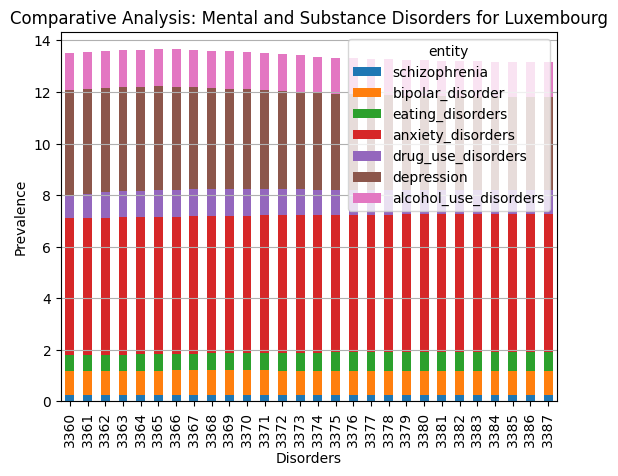

<Figure size 1200x600 with 0 Axes>

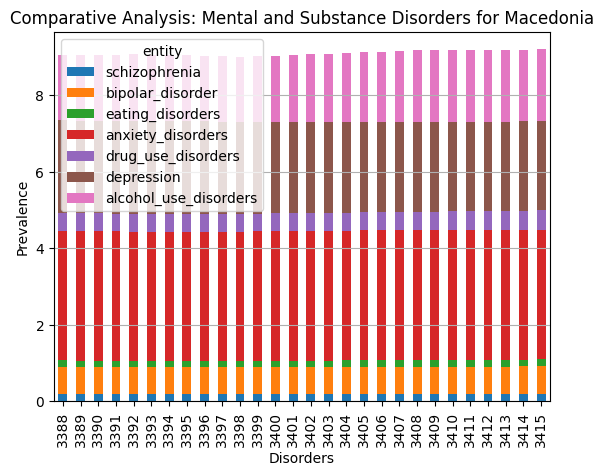

<Figure size 1200x600 with 0 Axes>

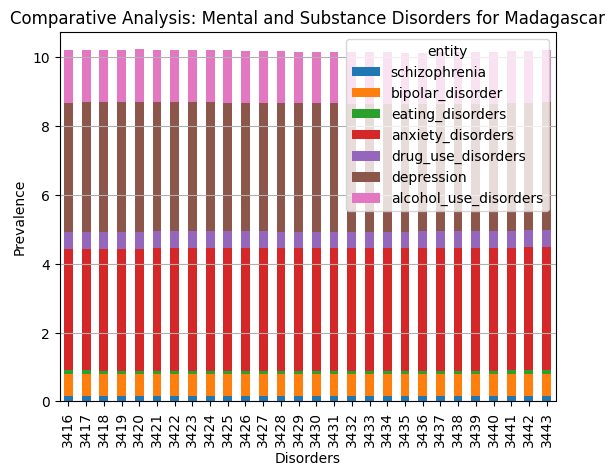

<Figure size 1200x600 with 0 Axes>

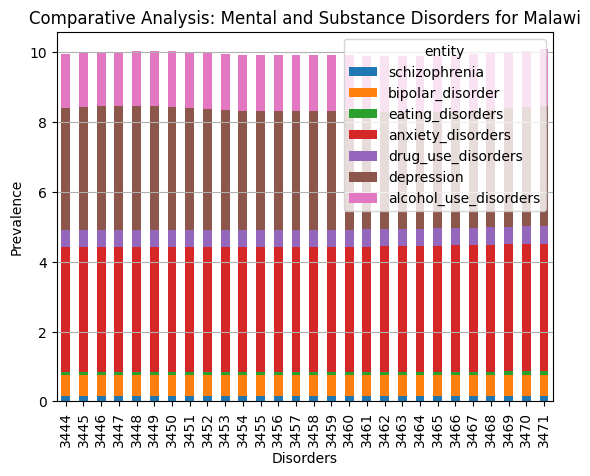

<Figure size 1200x600 with 0 Axes>

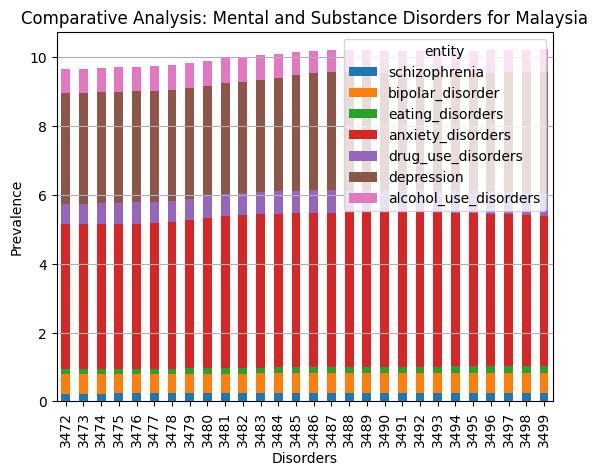

<Figure size 1200x600 with 0 Axes>

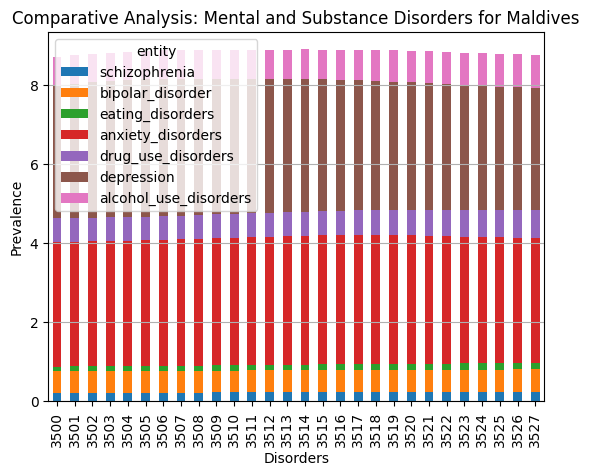

<Figure size 1200x600 with 0 Axes>

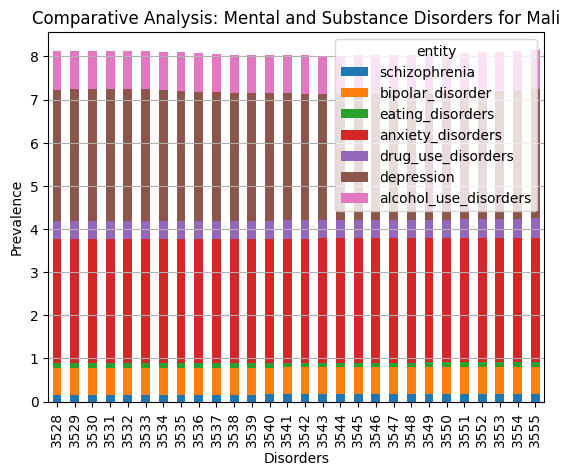

<Figure size 1200x600 with 0 Axes>

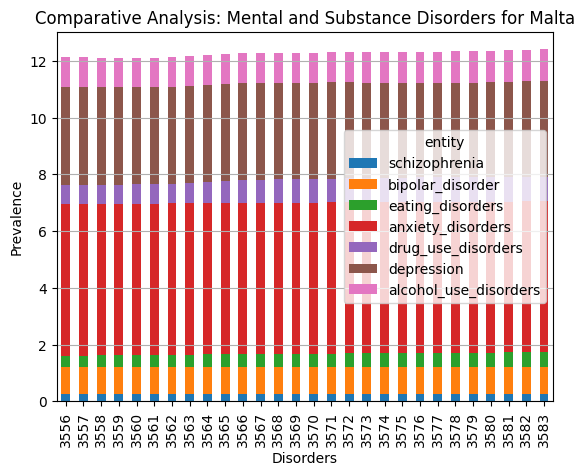

<Figure size 1200x600 with 0 Axes>

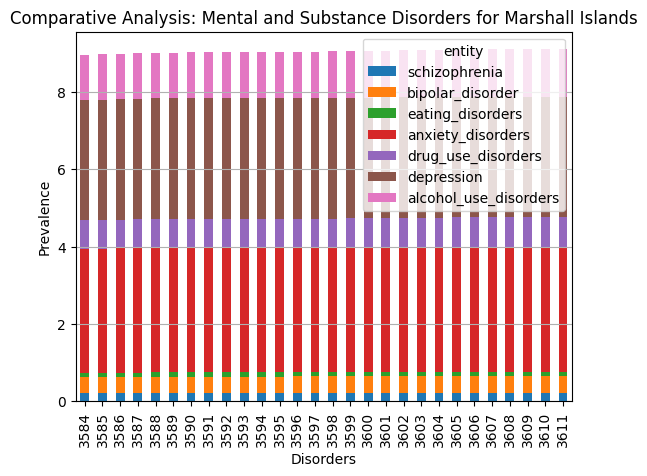

<Figure size 1200x600 with 0 Axes>

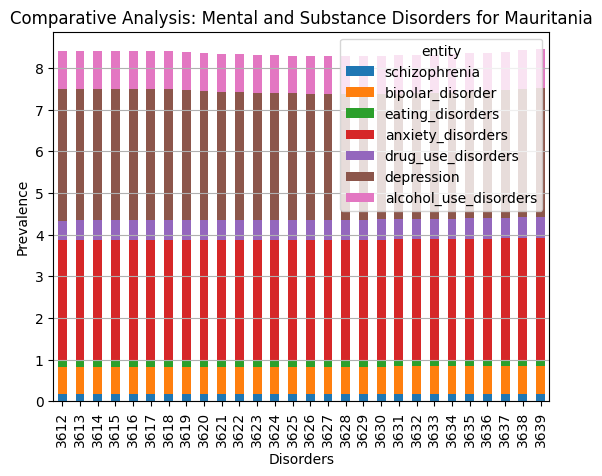

<Figure size 1200x600 with 0 Axes>

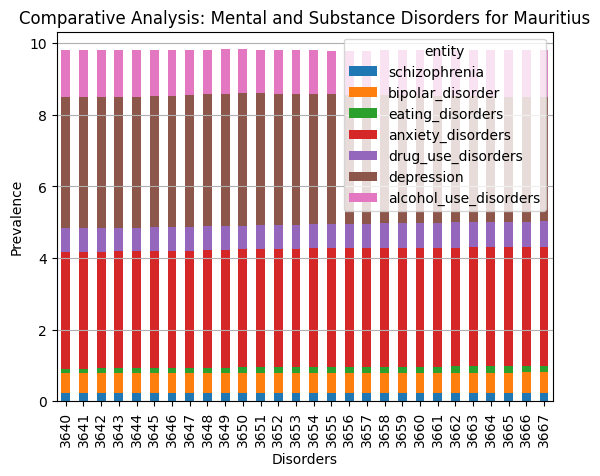

<Figure size 1200x600 with 0 Axes>

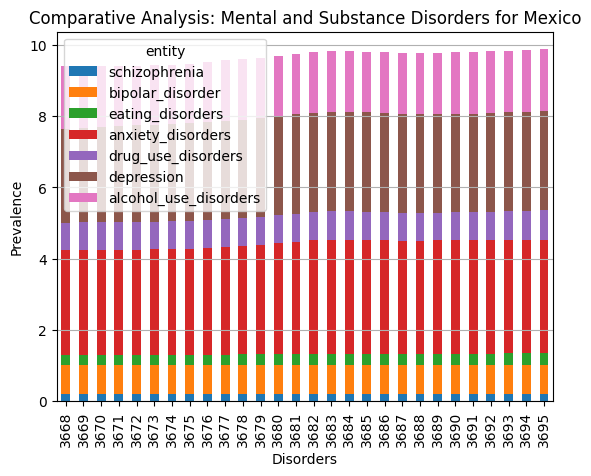

<Figure size 1200x600 with 0 Axes>

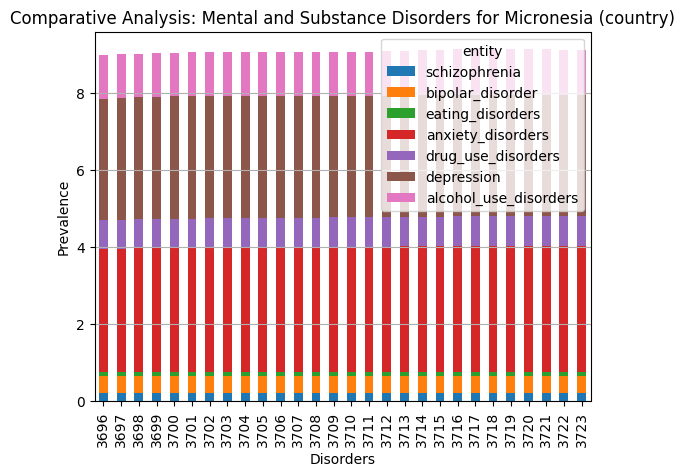

<Figure size 1200x600 with 0 Axes>

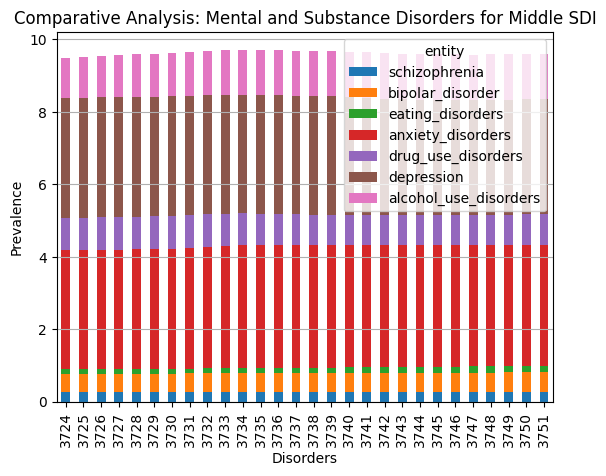

<Figure size 1200x600 with 0 Axes>

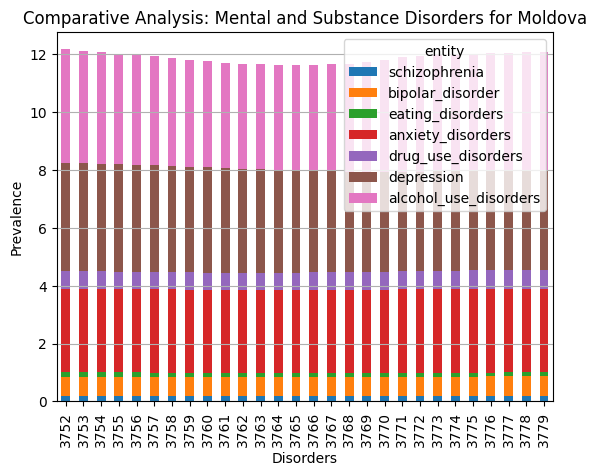

<Figure size 1200x600 with 0 Axes>

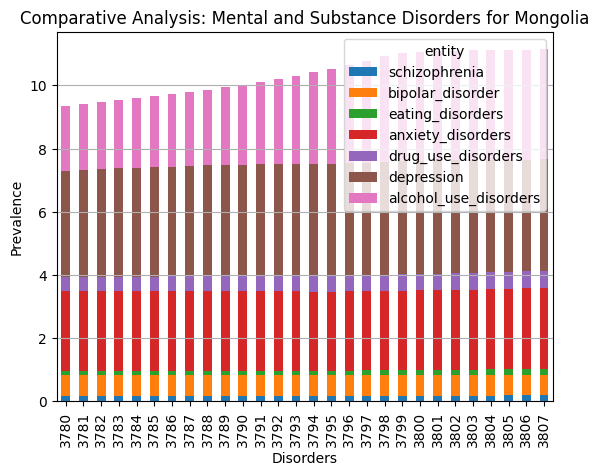

<Figure size 1200x600 with 0 Axes>

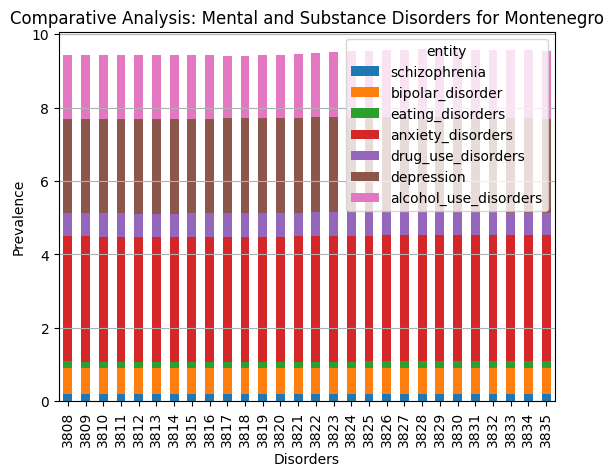

<Figure size 1200x600 with 0 Axes>

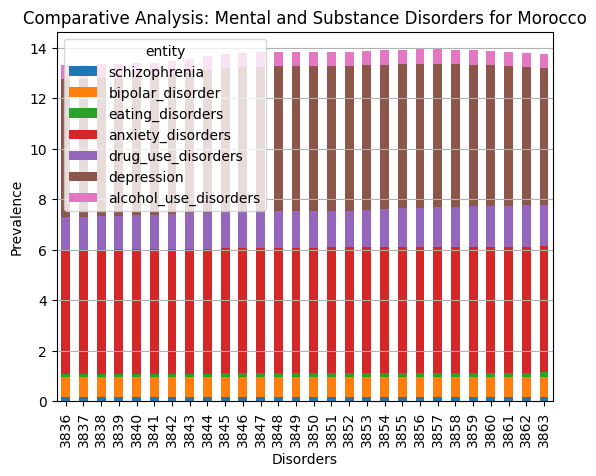

<Figure size 1200x600 with 0 Axes>

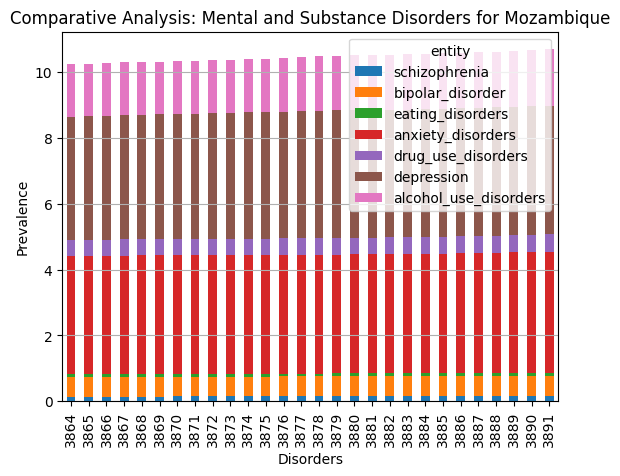

<Figure size 1200x600 with 0 Axes>

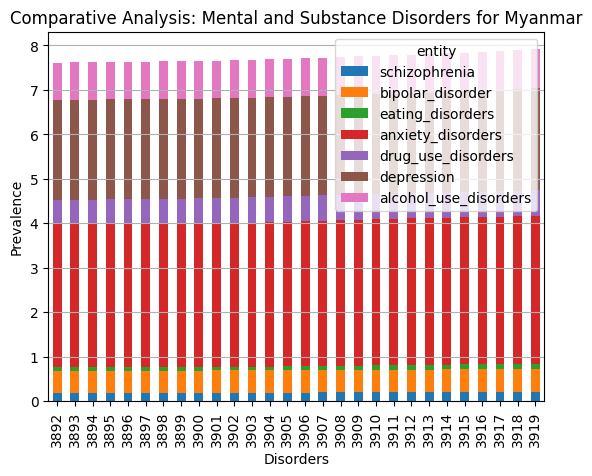

<Figure size 1200x600 with 0 Axes>

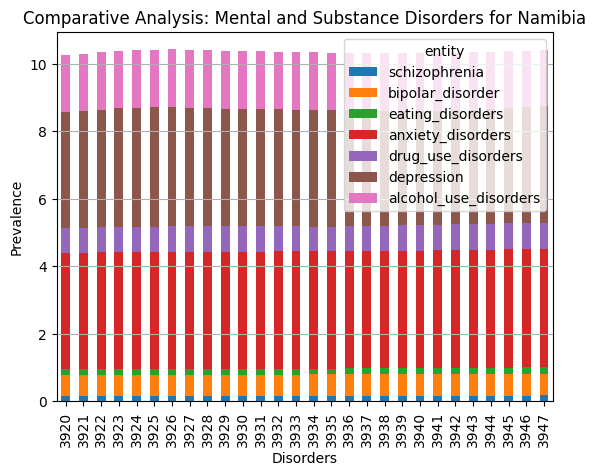

<Figure size 1200x600 with 0 Axes>

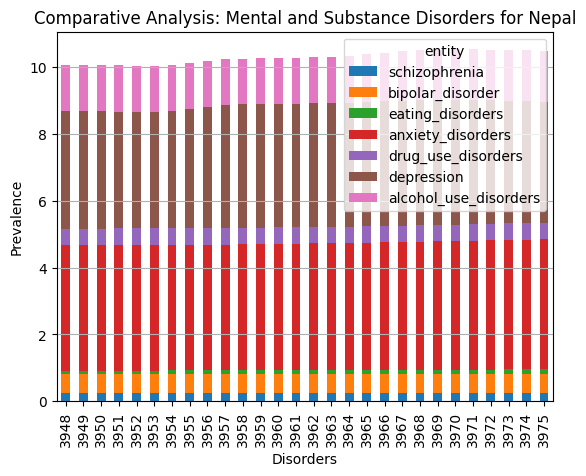

<Figure size 1200x600 with 0 Axes>

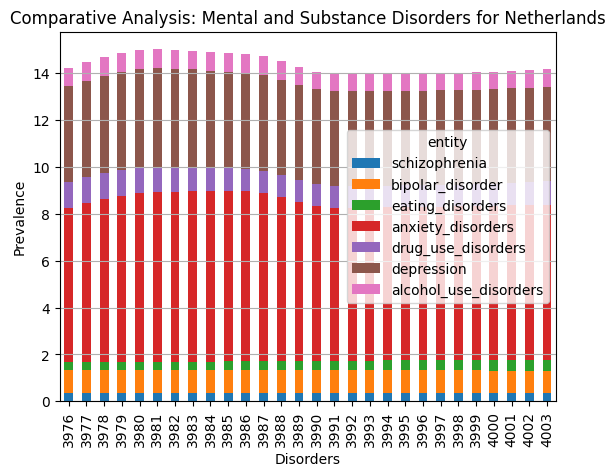

<Figure size 1200x600 with 0 Axes>

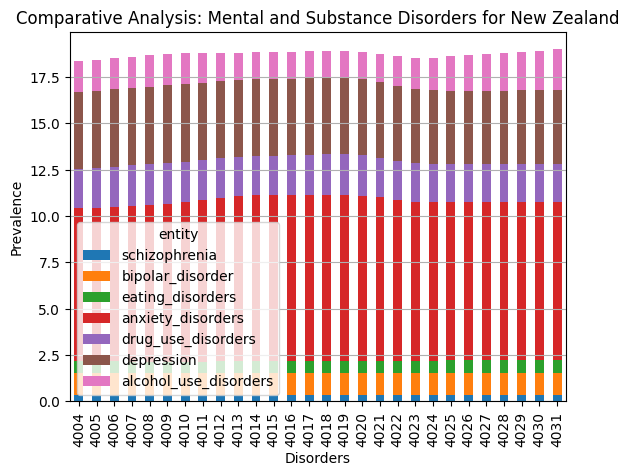

<Figure size 1200x600 with 0 Axes>

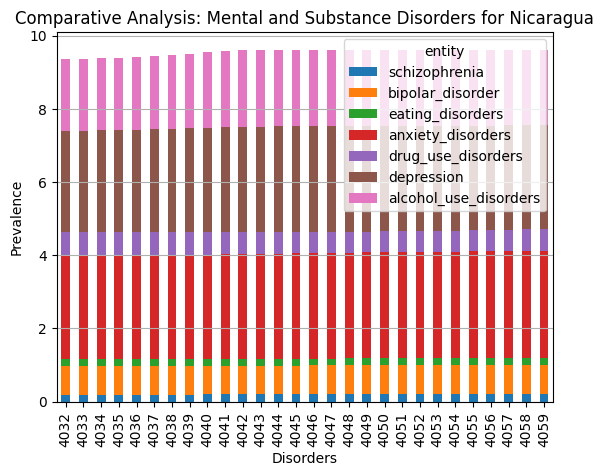

<Figure size 1200x600 with 0 Axes>

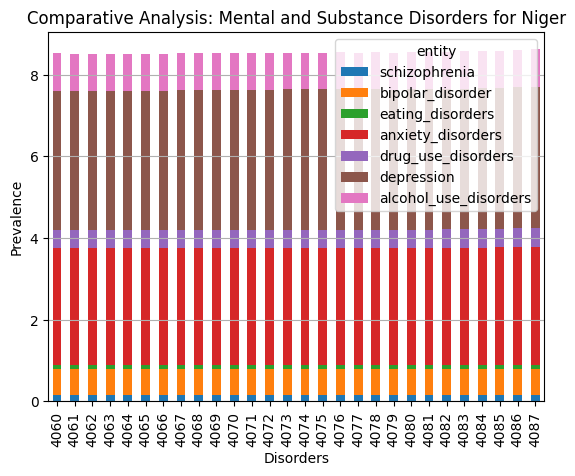

<Figure size 1200x600 with 0 Axes>

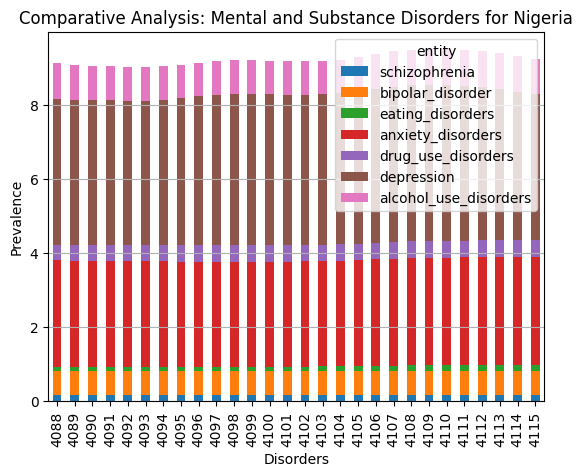

<Figure size 1200x600 with 0 Axes>

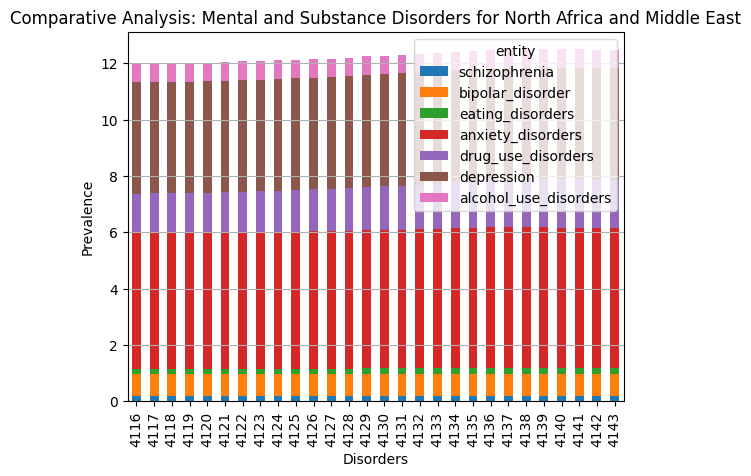

<Figure size 1200x600 with 0 Axes>

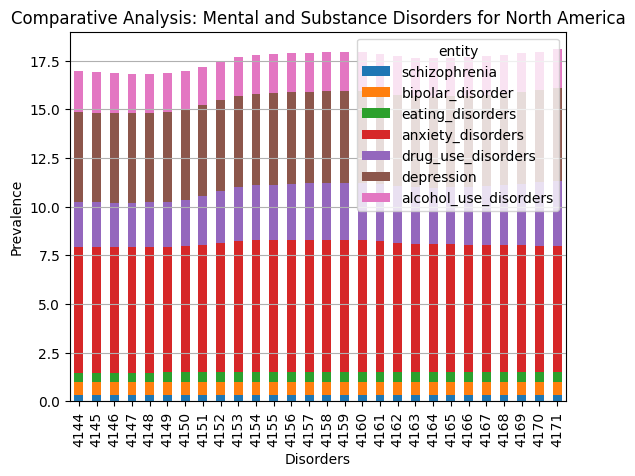

<Figure size 1200x600 with 0 Axes>

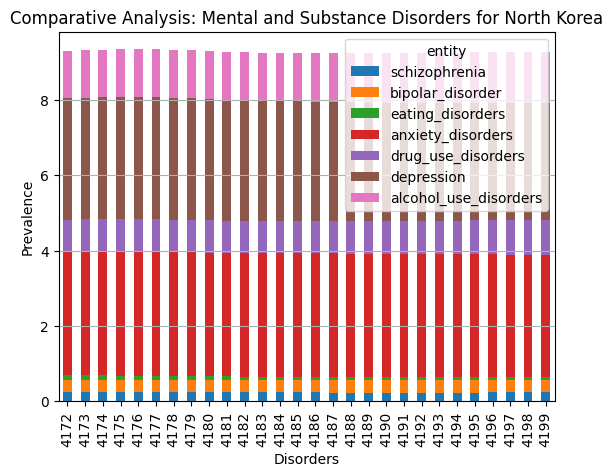

<Figure size 1200x600 with 0 Axes>

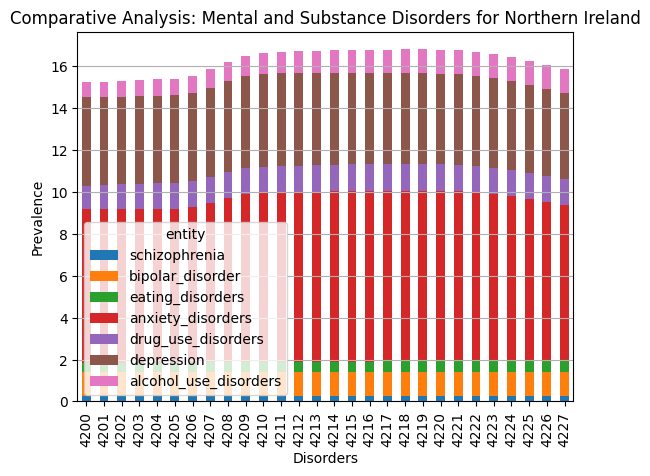

<Figure size 1200x600 with 0 Axes>

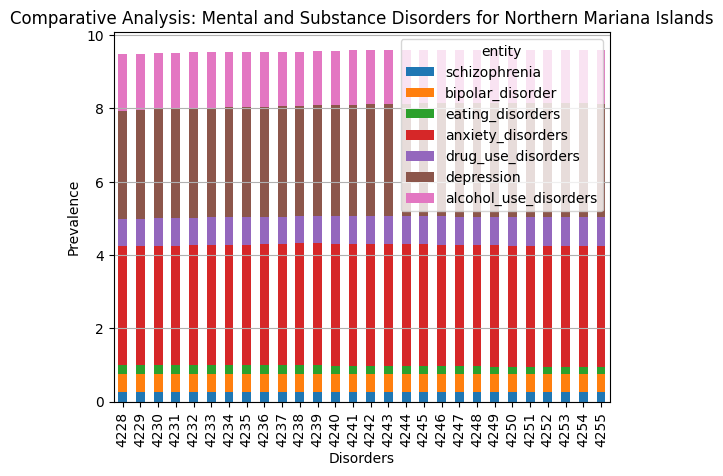

<Figure size 1200x600 with 0 Axes>

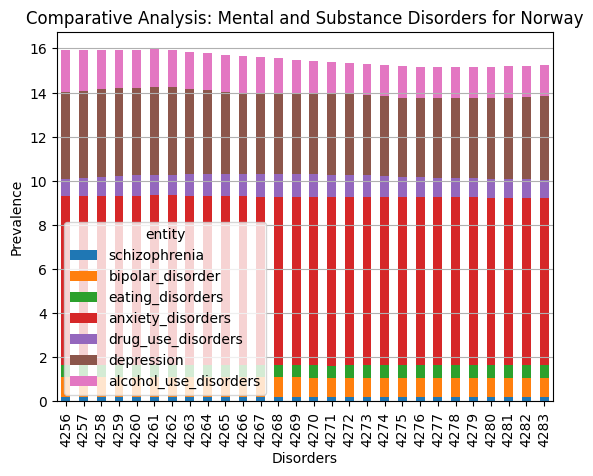

<Figure size 1200x600 with 0 Axes>

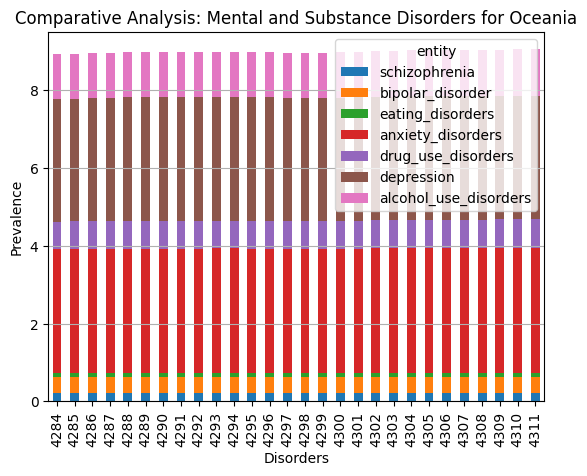

<Figure size 1200x600 with 0 Axes>

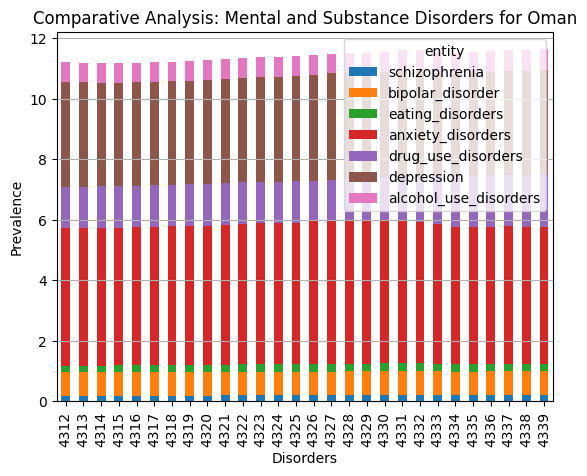

<Figure size 1200x600 with 0 Axes>

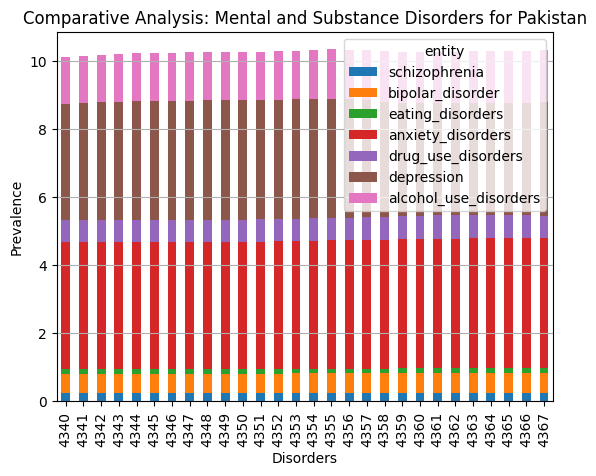

<Figure size 1200x600 with 0 Axes>

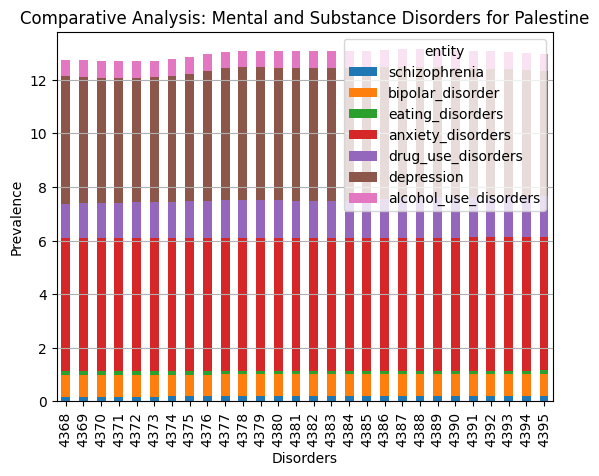

<Figure size 1200x600 with 0 Axes>

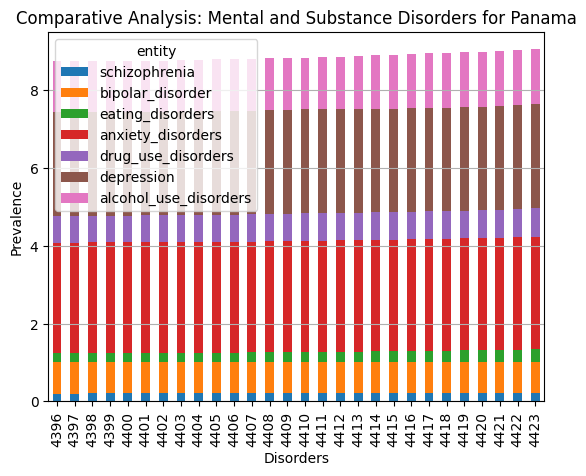

<Figure size 1200x600 with 0 Axes>

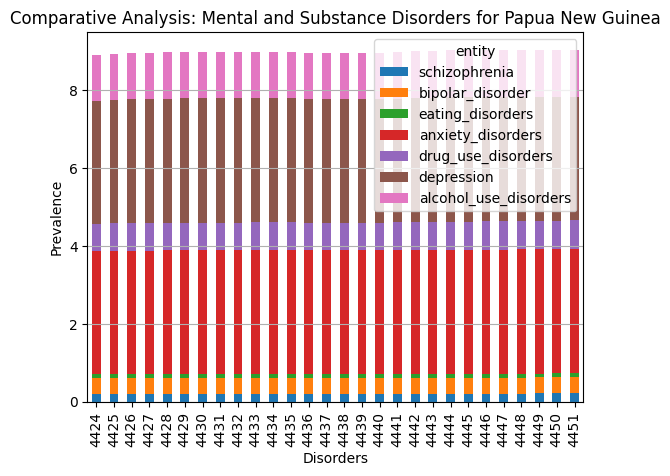

<Figure size 1200x600 with 0 Axes>

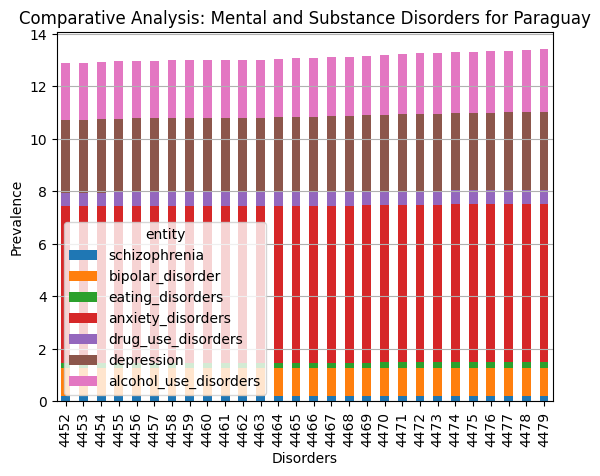

<Figure size 1200x600 with 0 Axes>

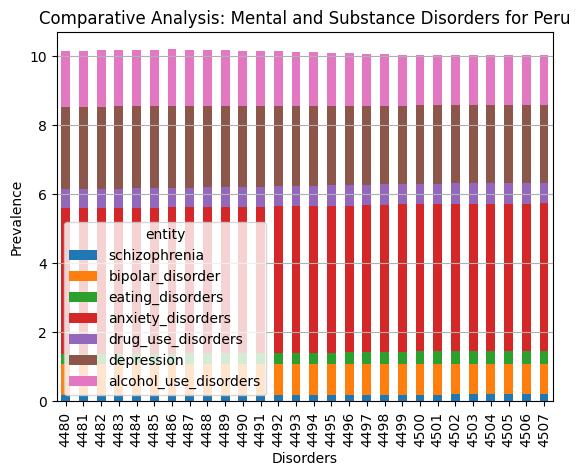

<Figure size 1200x600 with 0 Axes>

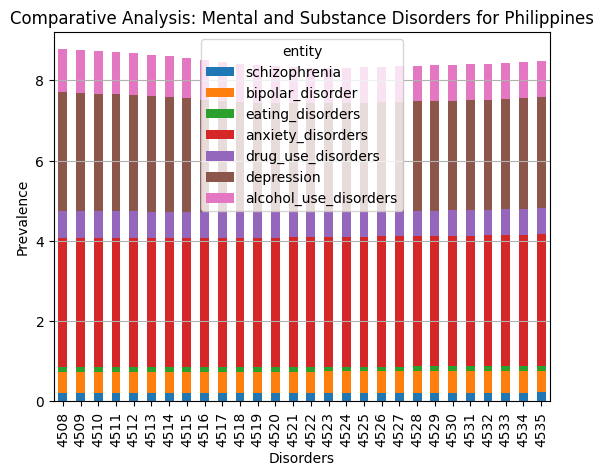

<Figure size 1200x600 with 0 Axes>

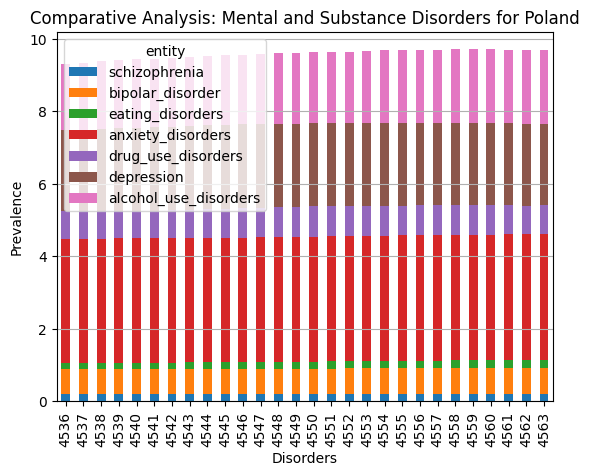

<Figure size 1200x600 with 0 Axes>

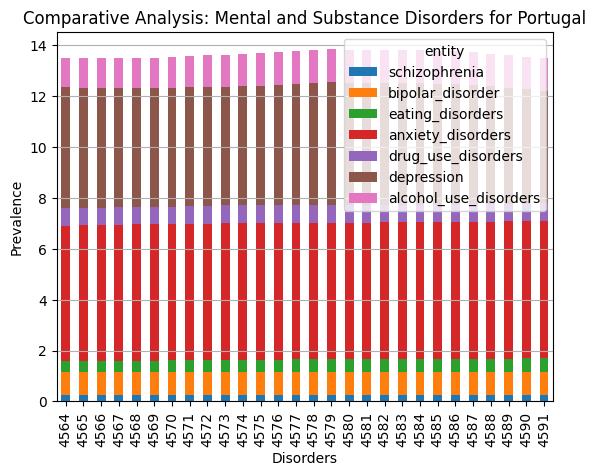

<Figure size 1200x600 with 0 Axes>

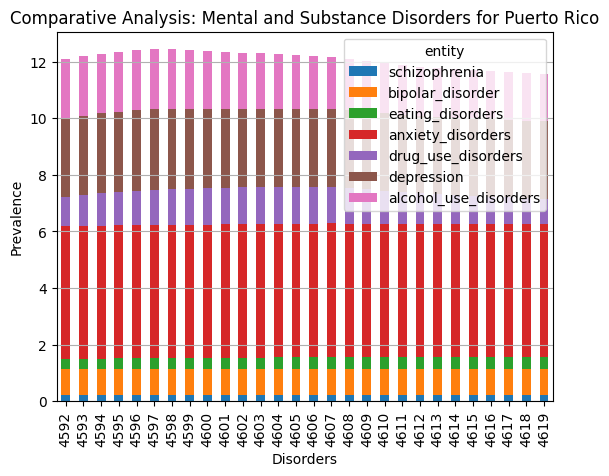

<Figure size 1200x600 with 0 Axes>

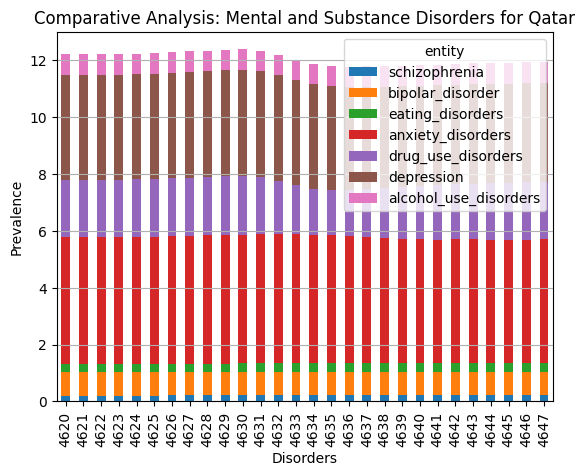

<Figure size 1200x600 with 0 Axes>

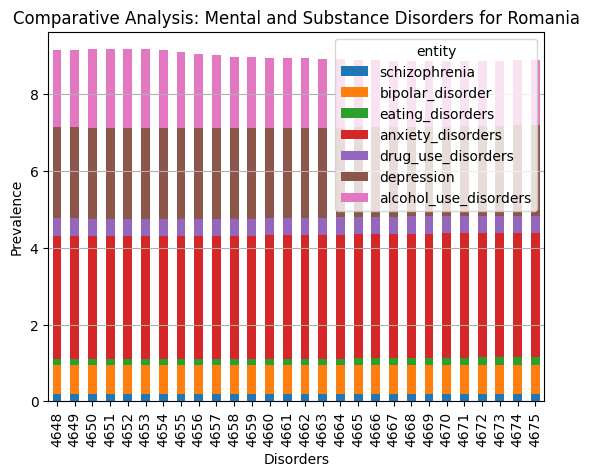

<Figure size 1200x600 with 0 Axes>

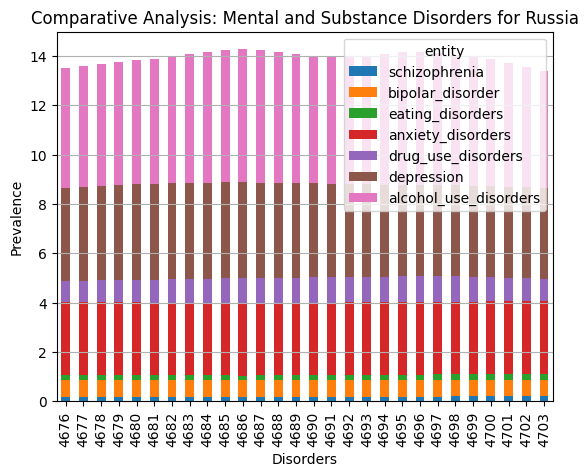

<Figure size 1200x600 with 0 Axes>

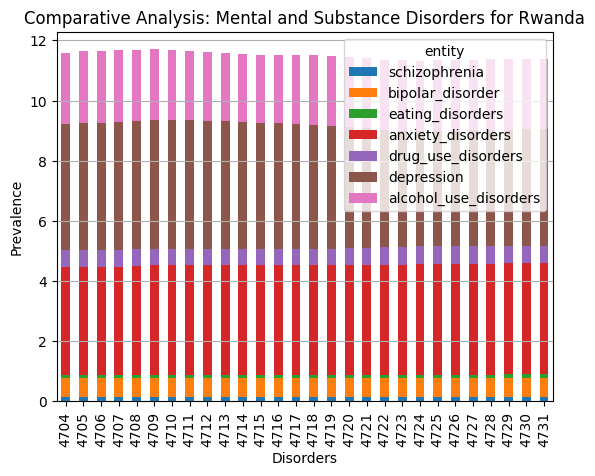

<Figure size 1200x600 with 0 Axes>

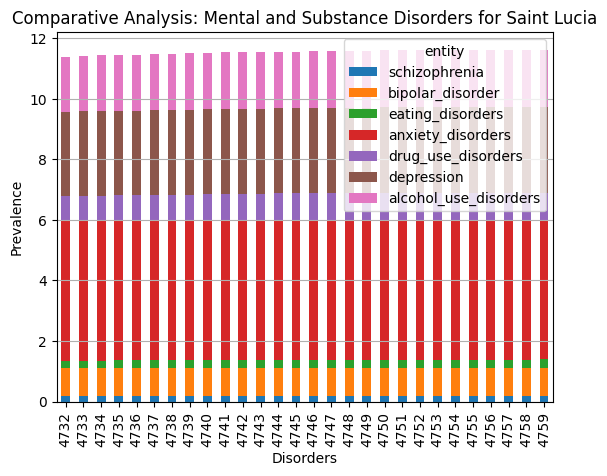

<Figure size 1200x600 with 0 Axes>

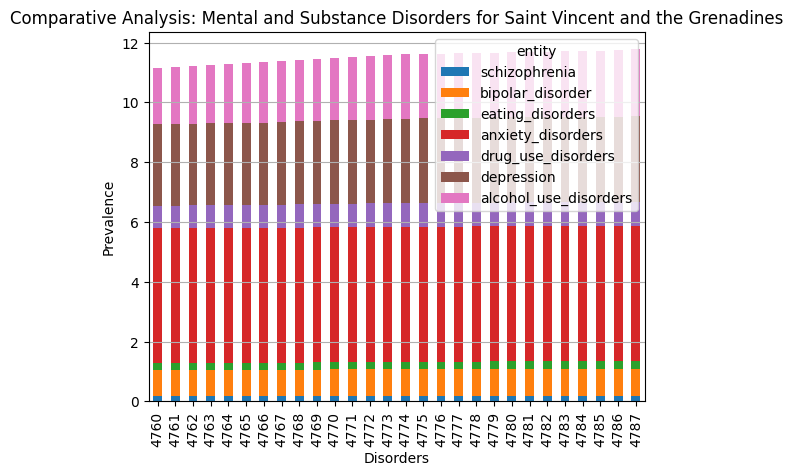

<Figure size 1200x600 with 0 Axes>

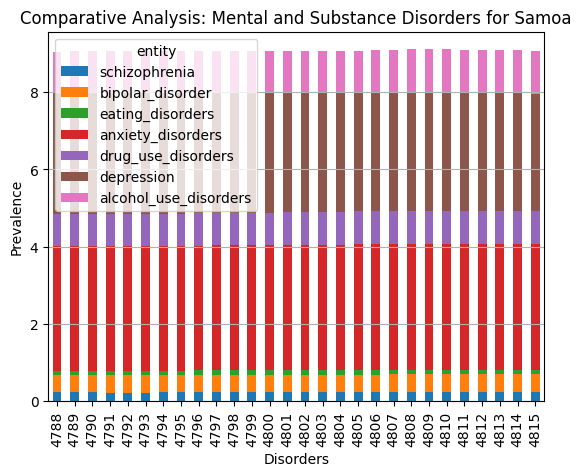

<Figure size 1200x600 with 0 Axes>

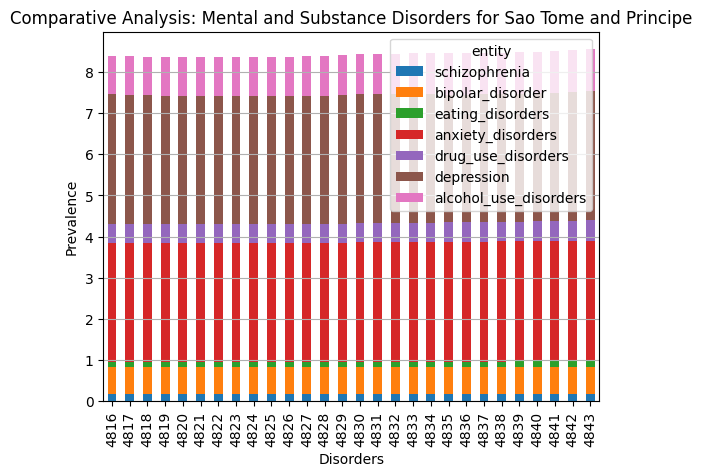

<Figure size 1200x600 with 0 Axes>

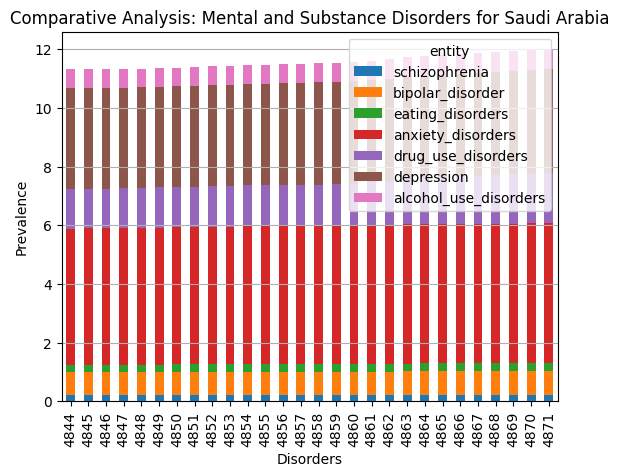

<Figure size 1200x600 with 0 Axes>

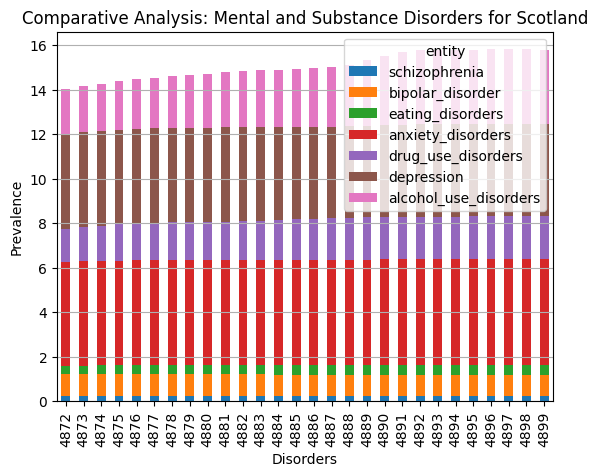

<Figure size 1200x600 with 0 Axes>

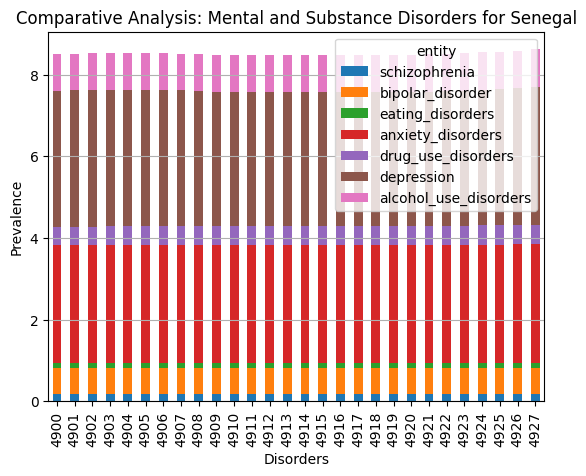

<Figure size 1200x600 with 0 Axes>

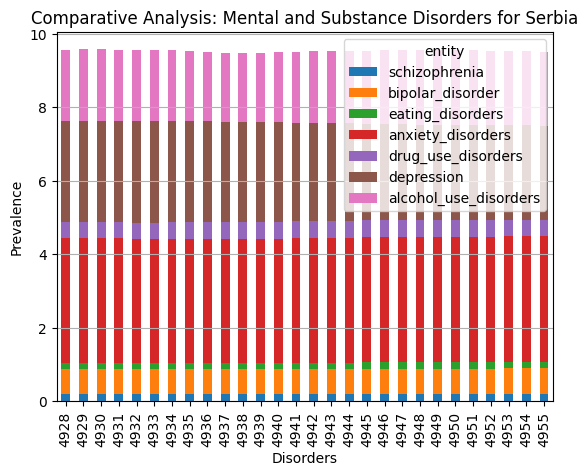

<Figure size 1200x600 with 0 Axes>

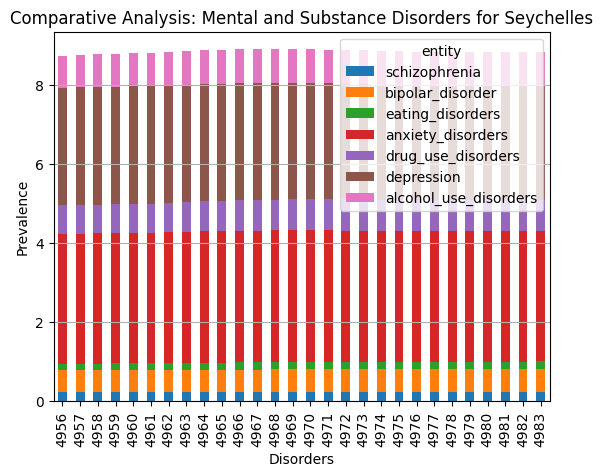

<Figure size 1200x600 with 0 Axes>

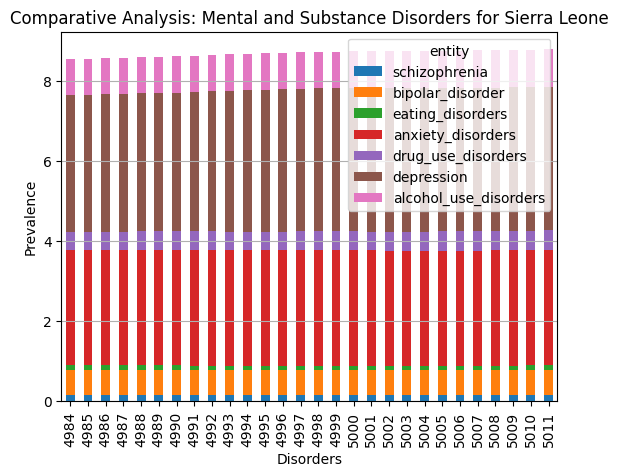

<Figure size 1200x600 with 0 Axes>

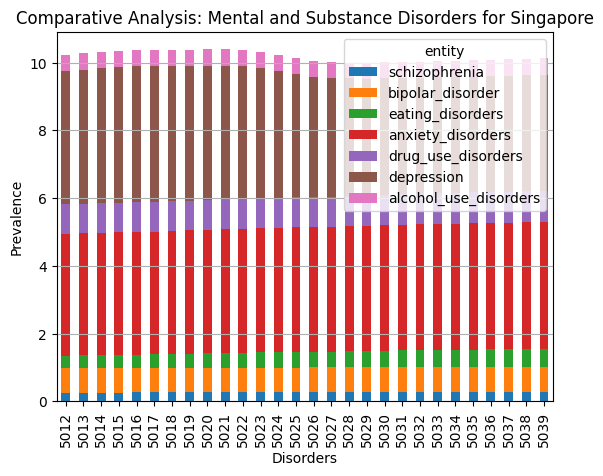

<Figure size 1200x600 with 0 Axes>

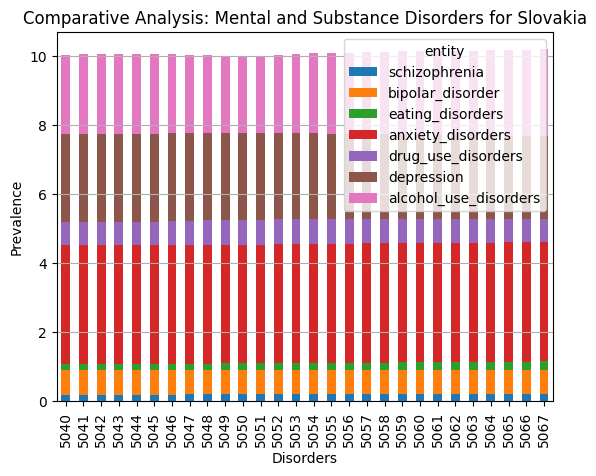

<Figure size 1200x600 with 0 Axes>

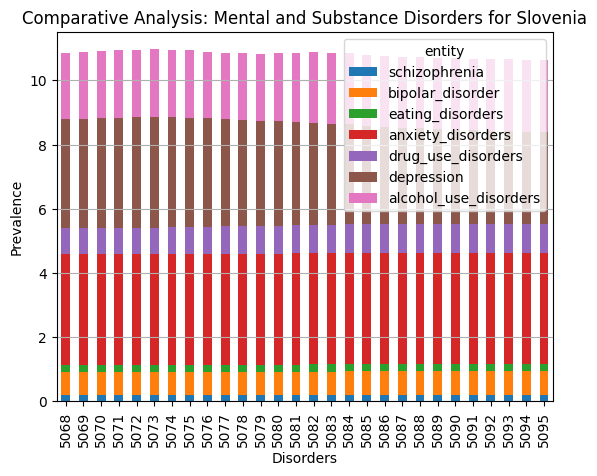

<Figure size 1200x600 with 0 Axes>

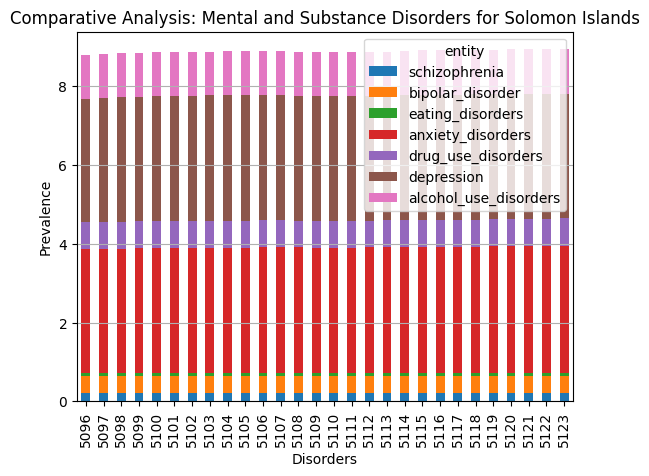

<Figure size 1200x600 with 0 Axes>

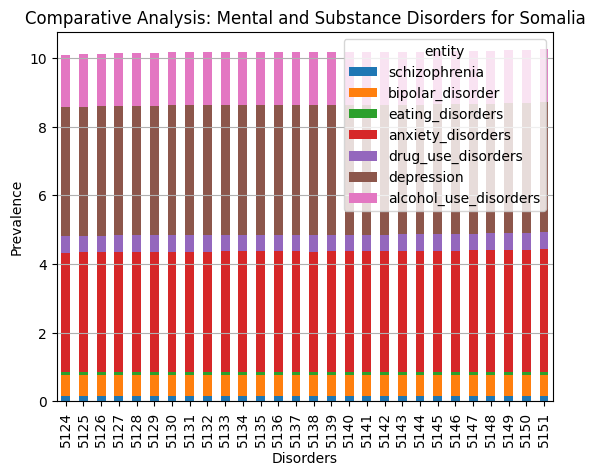

<Figure size 1200x600 with 0 Axes>

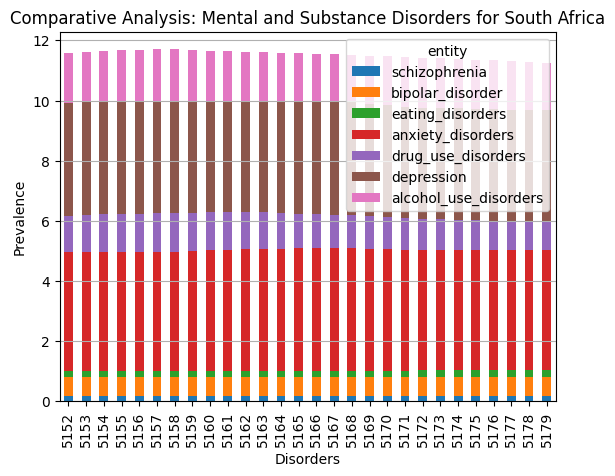

<Figure size 1200x600 with 0 Axes>

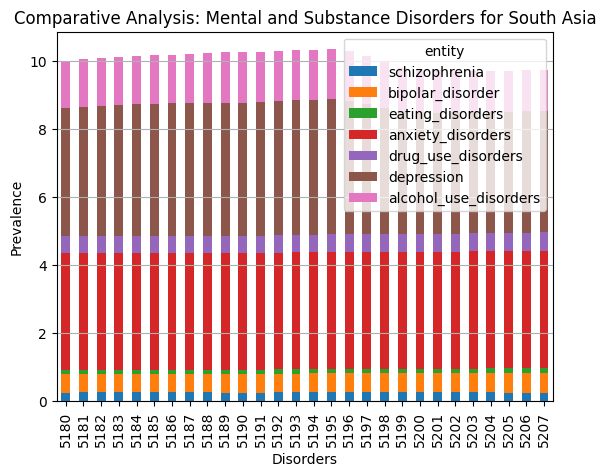

<Figure size 1200x600 with 0 Axes>

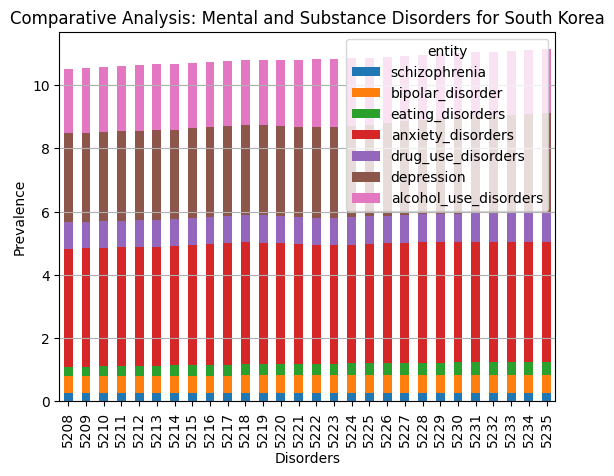

<Figure size 1200x600 with 0 Axes>

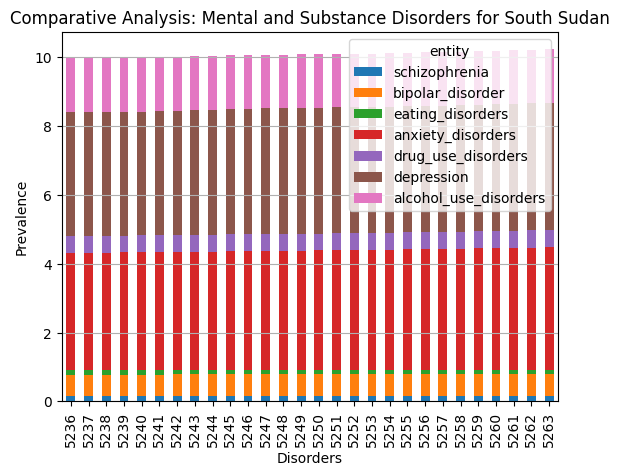

<Figure size 1200x600 with 0 Axes>

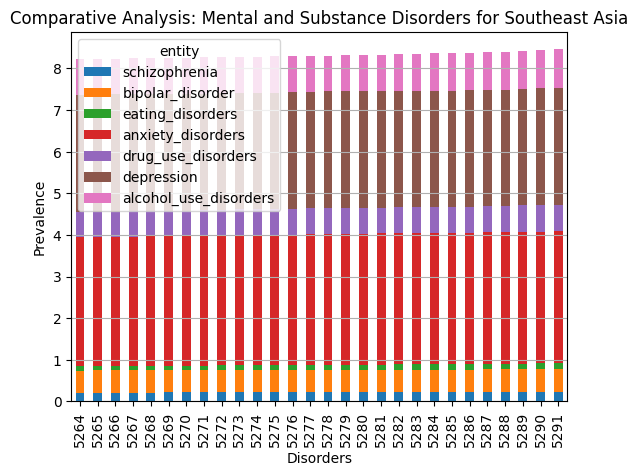

<Figure size 1200x600 with 0 Axes>

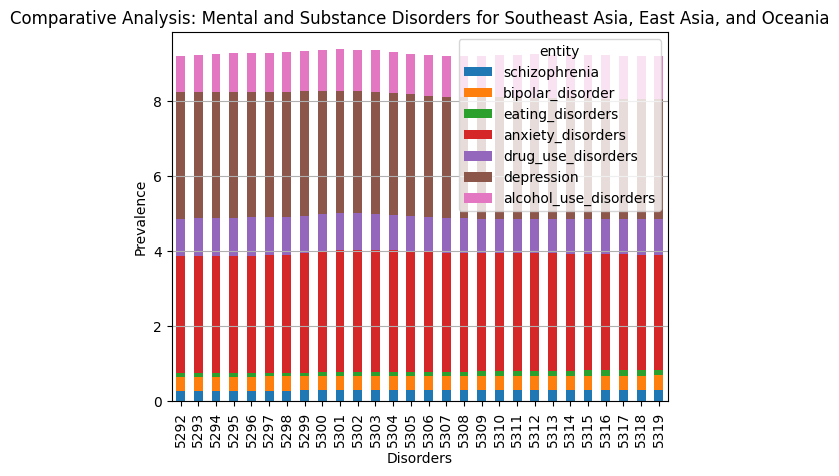

<Figure size 1200x600 with 0 Axes>

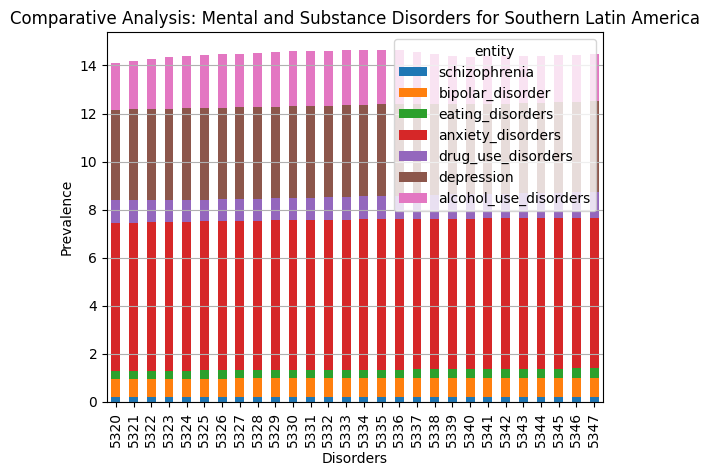

<Figure size 1200x600 with 0 Axes>

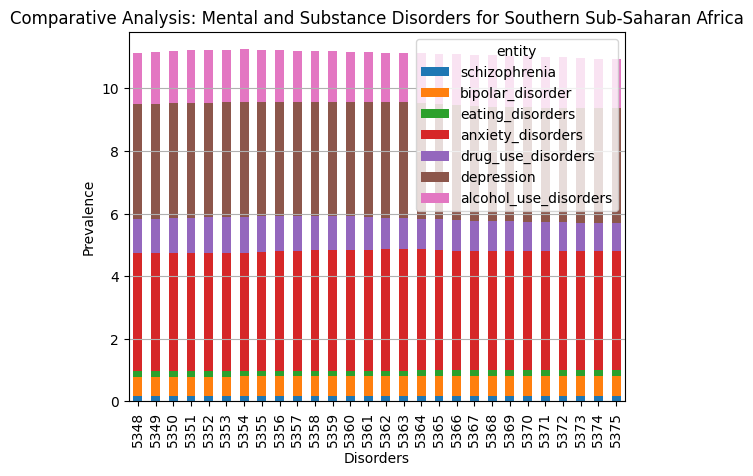

<Figure size 1200x600 with 0 Axes>

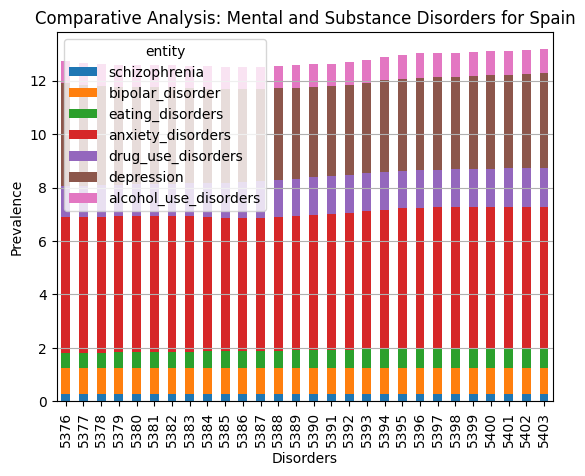

<Figure size 1200x600 with 0 Axes>

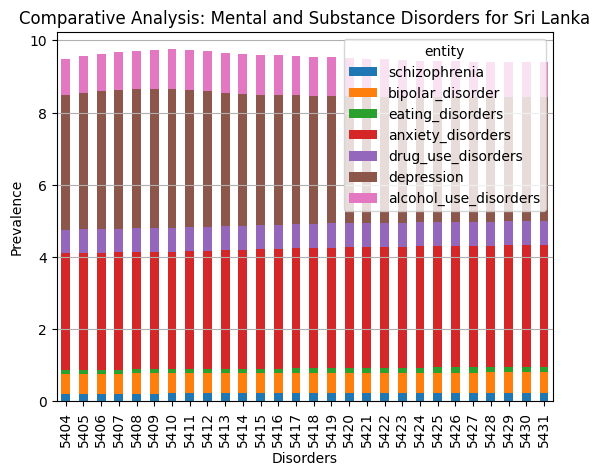

<Figure size 1200x600 with 0 Axes>

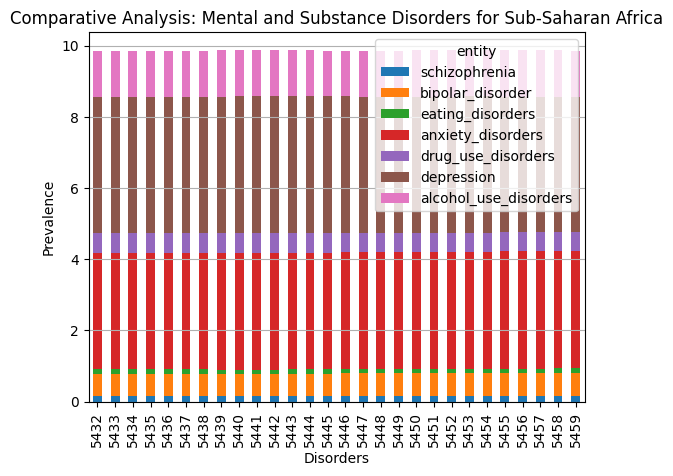

<Figure size 1200x600 with 0 Axes>

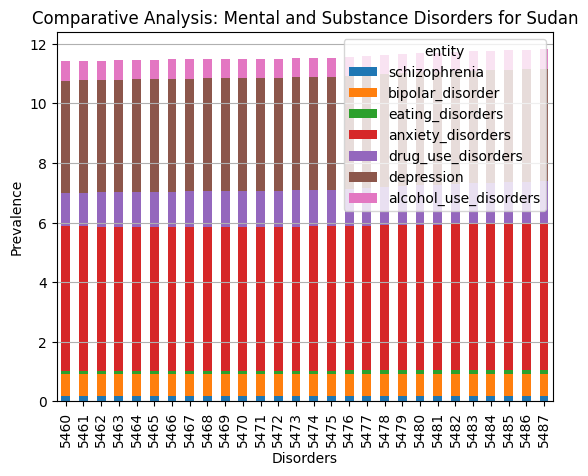

<Figure size 1200x600 with 0 Axes>

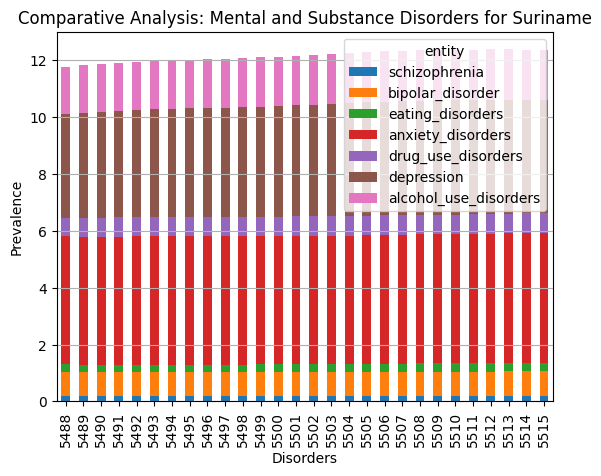

<Figure size 1200x600 with 0 Axes>

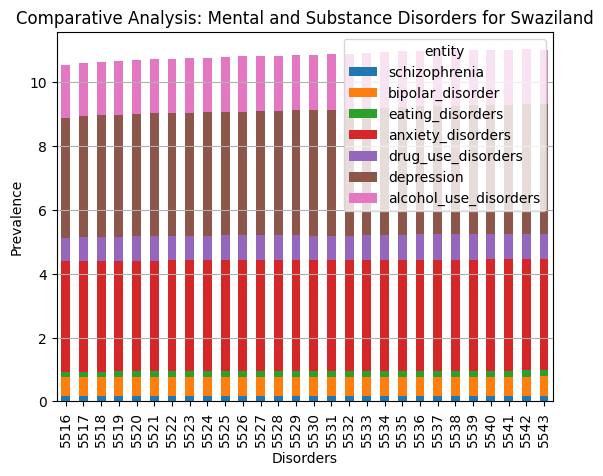

<Figure size 1200x600 with 0 Axes>

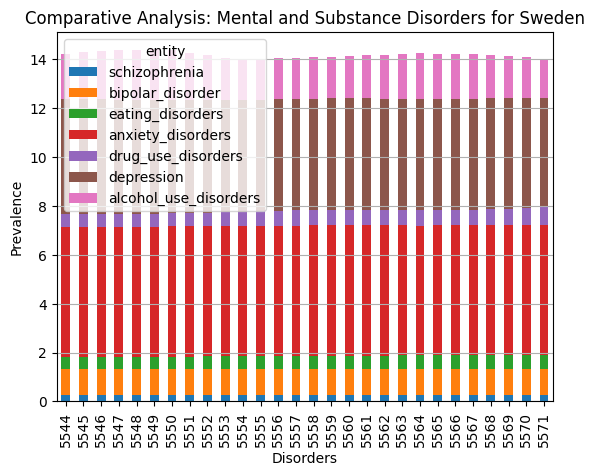

<Figure size 1200x600 with 0 Axes>

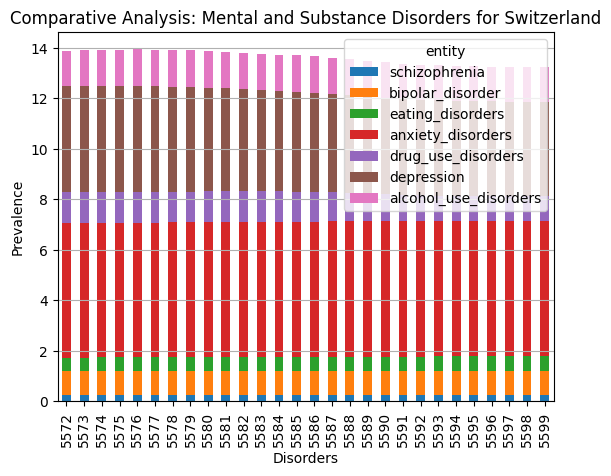

<Figure size 1200x600 with 0 Axes>

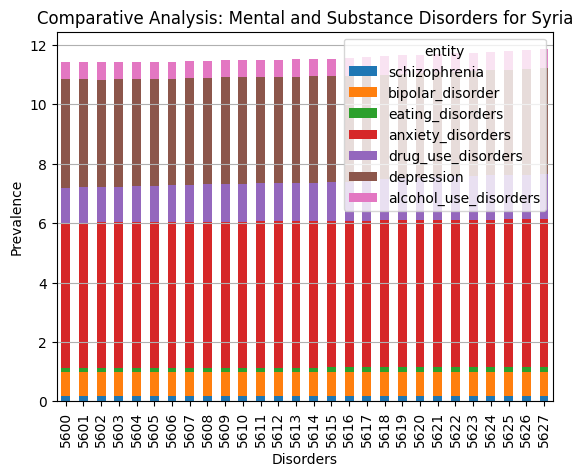

<Figure size 1200x600 with 0 Axes>

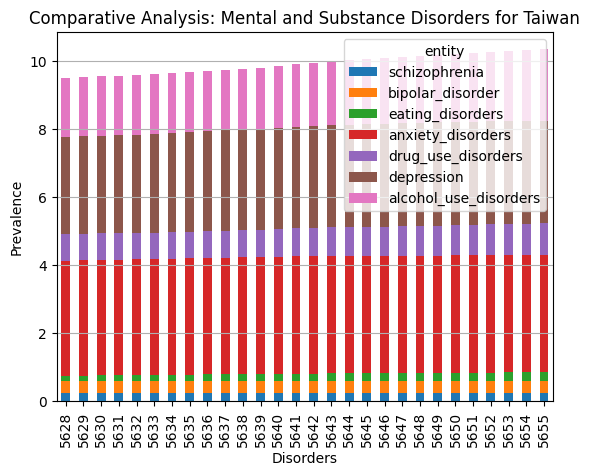

<Figure size 1200x600 with 0 Axes>

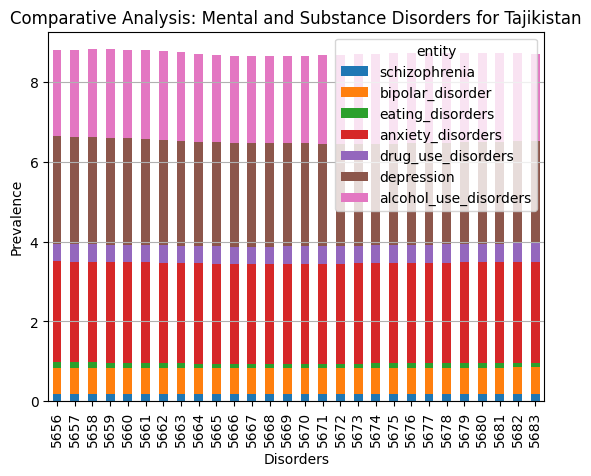

<Figure size 1200x600 with 0 Axes>

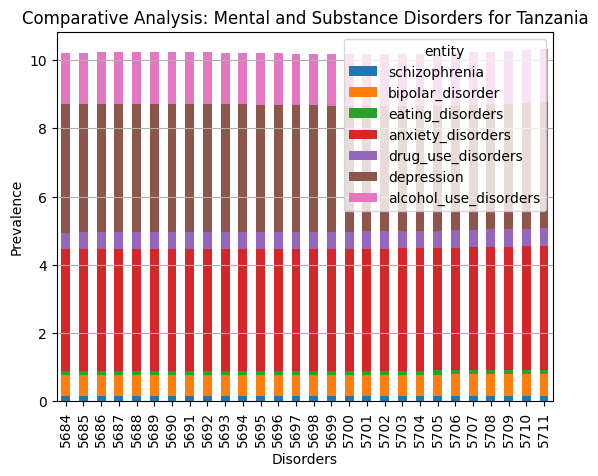

<Figure size 1200x600 with 0 Axes>

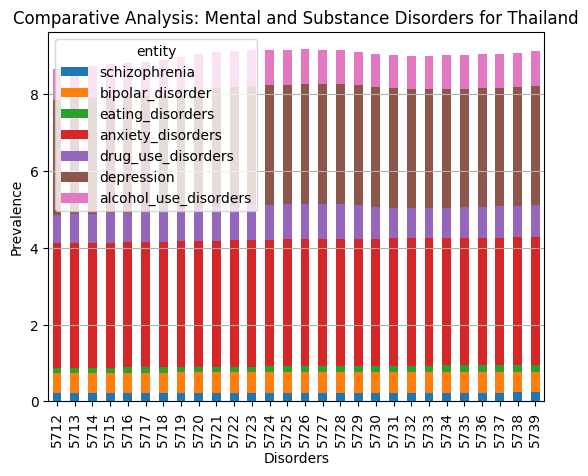

<Figure size 1200x600 with 0 Axes>

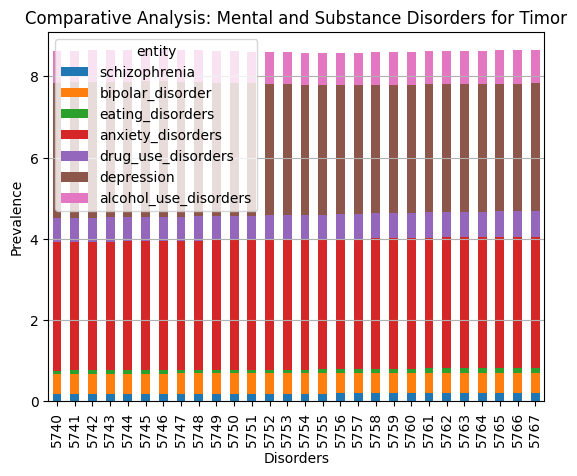

<Figure size 1200x600 with 0 Axes>

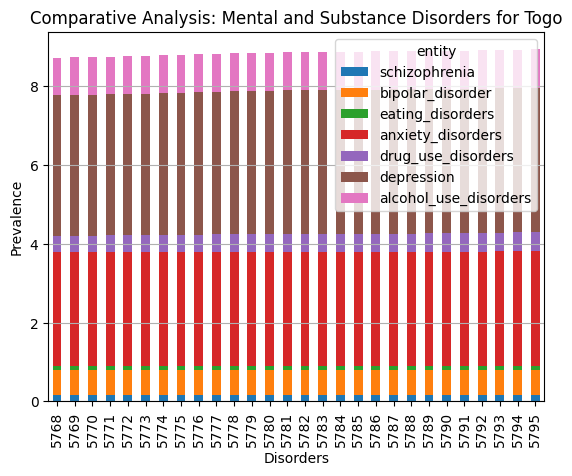

<Figure size 1200x600 with 0 Axes>

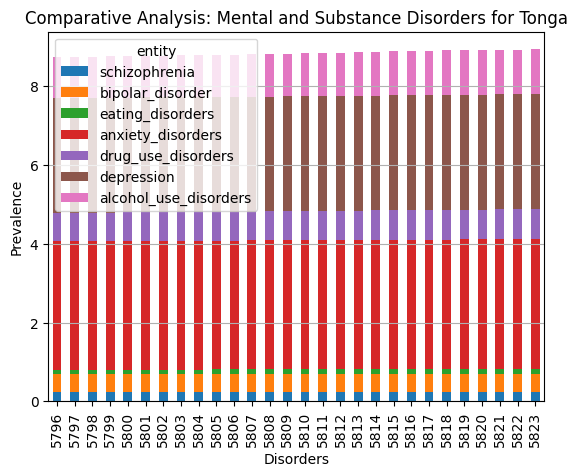

<Figure size 1200x600 with 0 Axes>

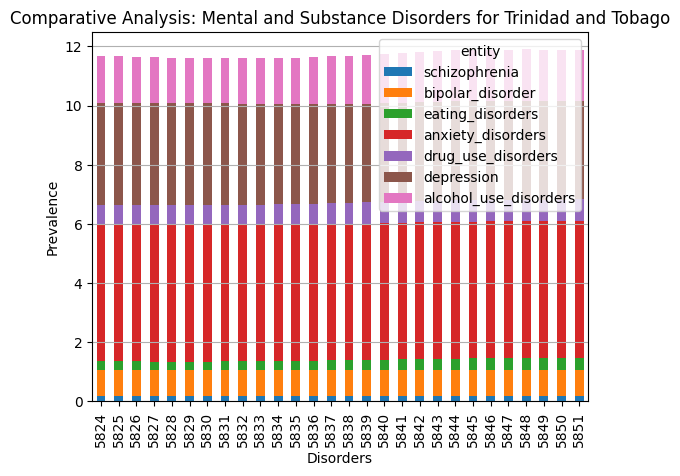

<Figure size 1200x600 with 0 Axes>

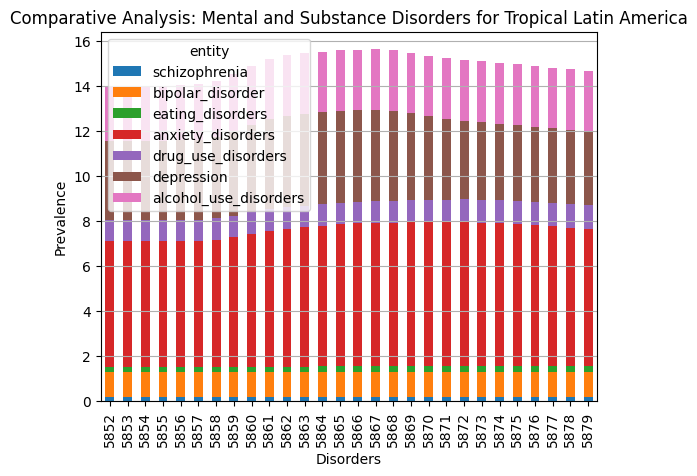

<Figure size 1200x600 with 0 Axes>

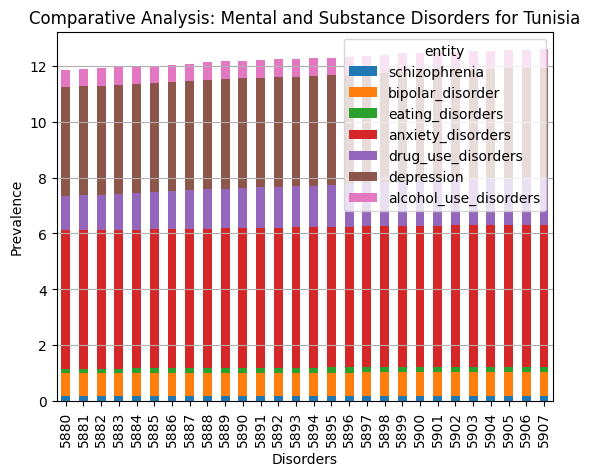

<Figure size 1200x600 with 0 Axes>

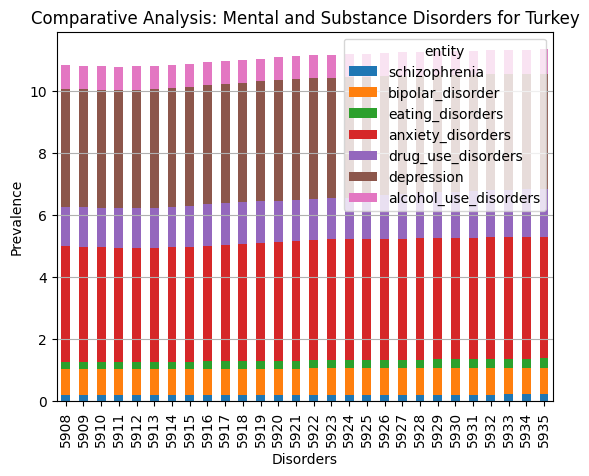

<Figure size 1200x600 with 0 Axes>

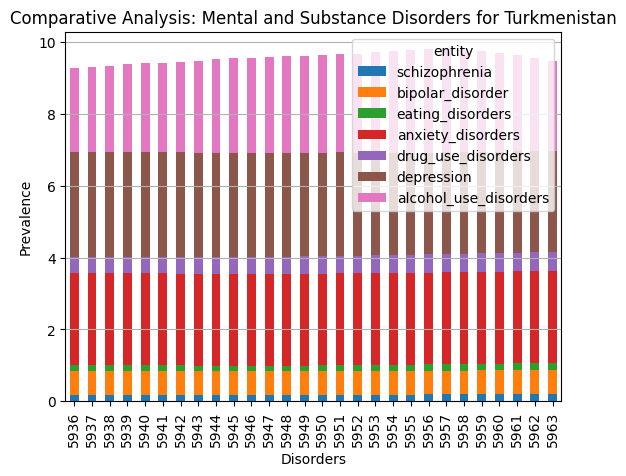

<Figure size 1200x600 with 0 Axes>

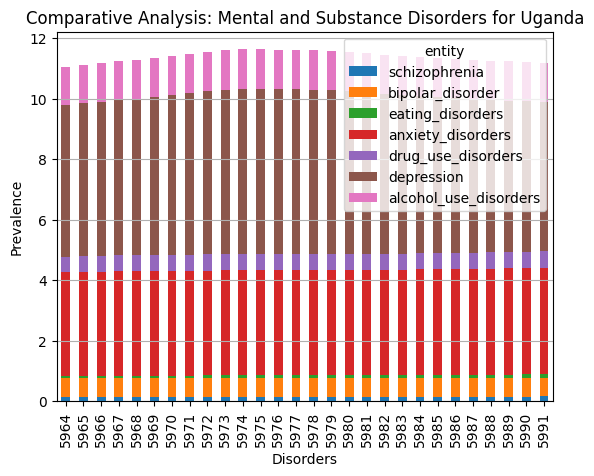

<Figure size 1200x600 with 0 Axes>

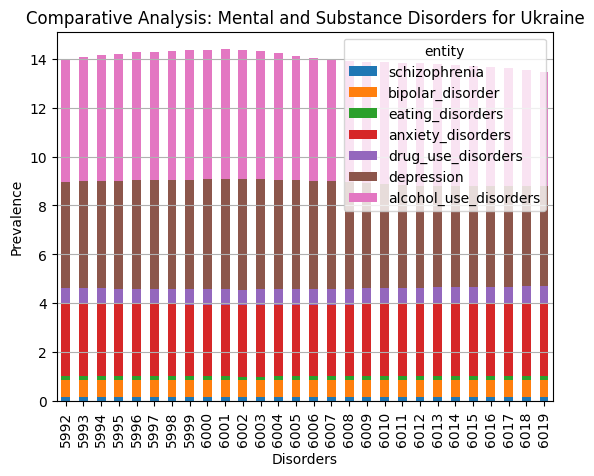

<Figure size 1200x600 with 0 Axes>

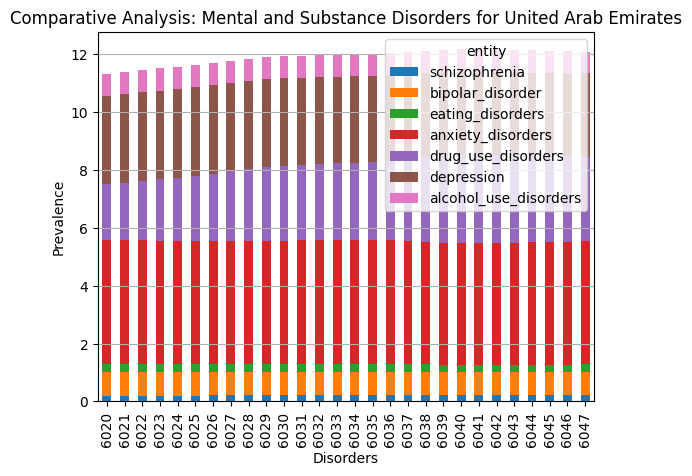

<Figure size 1200x600 with 0 Axes>

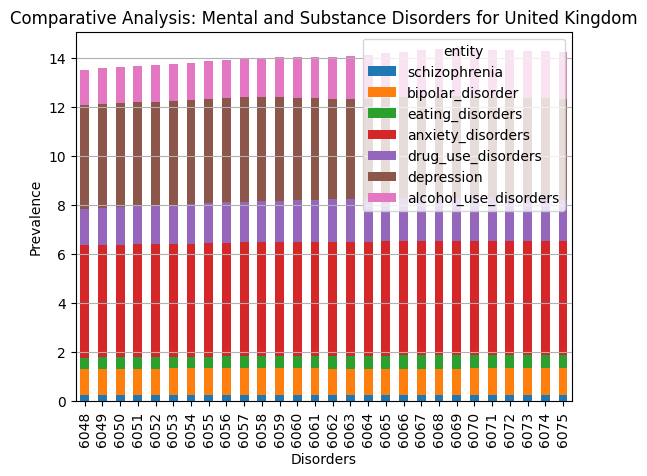

<Figure size 1200x600 with 0 Axes>

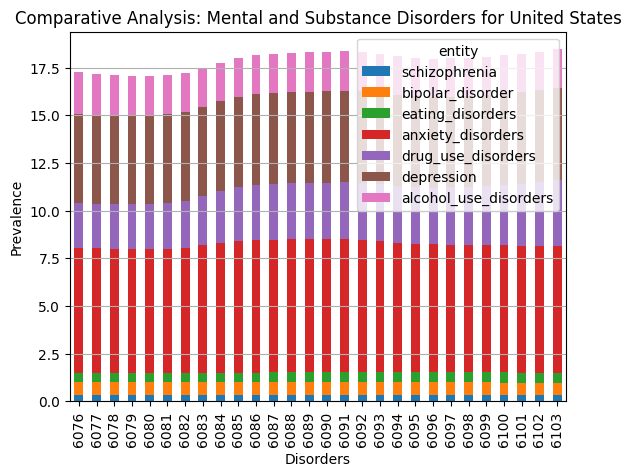

<Figure size 1200x600 with 0 Axes>

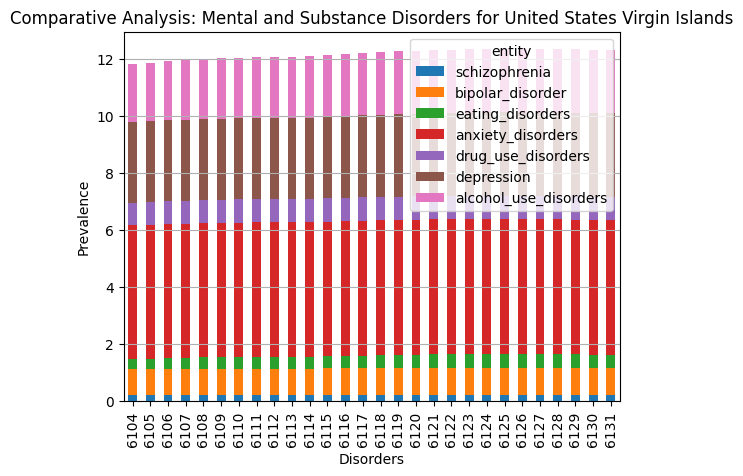

<Figure size 1200x600 with 0 Axes>

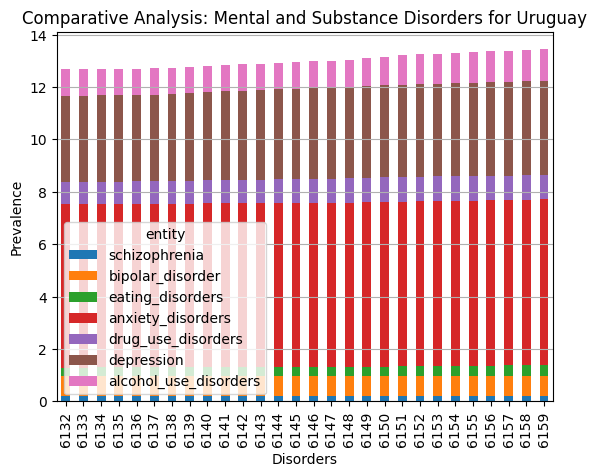

<Figure size 1200x600 with 0 Axes>

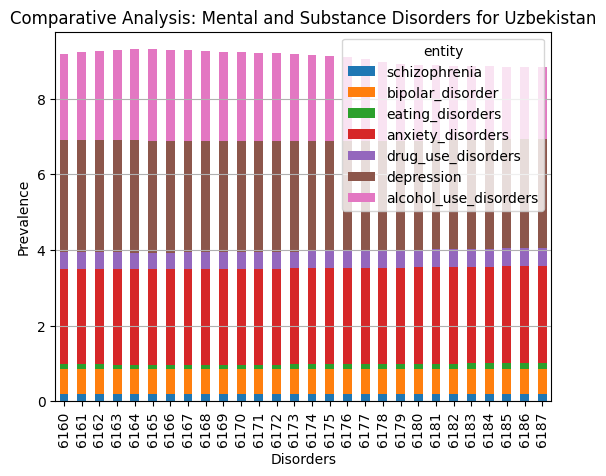

<Figure size 1200x600 with 0 Axes>

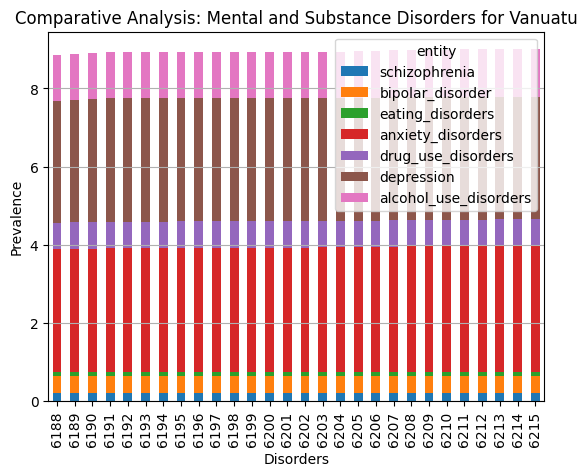

<Figure size 1200x600 with 0 Axes>

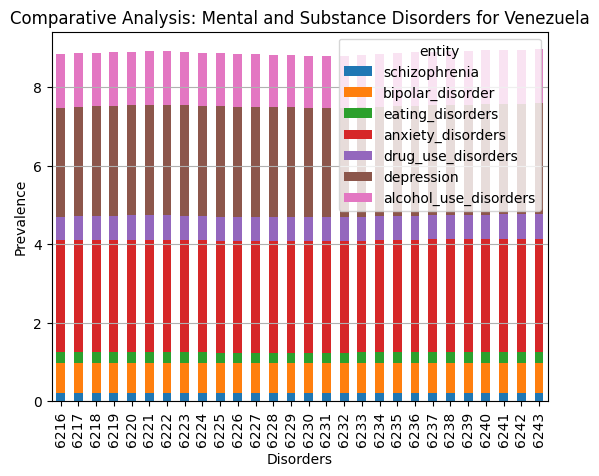

<Figure size 1200x600 with 0 Axes>

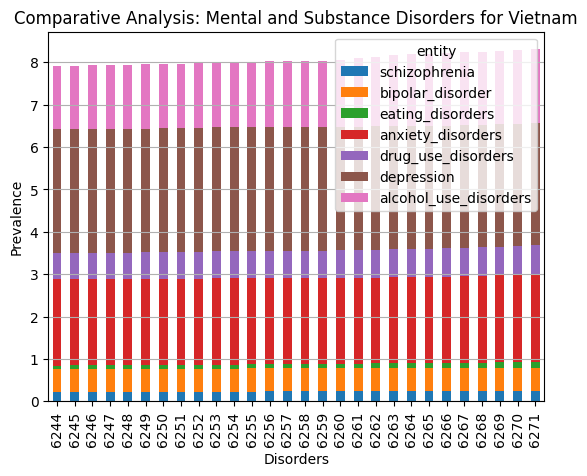

<Figure size 1200x600 with 0 Axes>

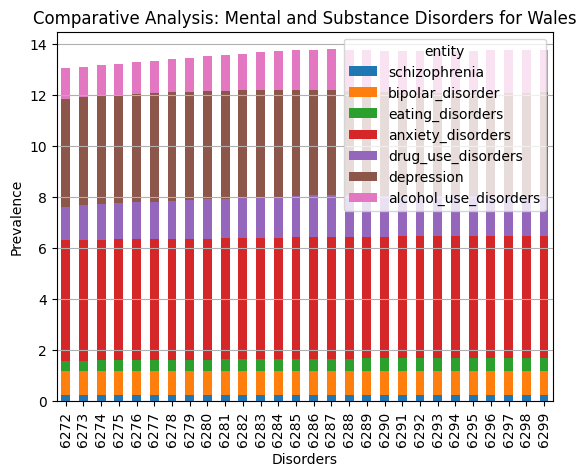

<Figure size 1200x600 with 0 Axes>

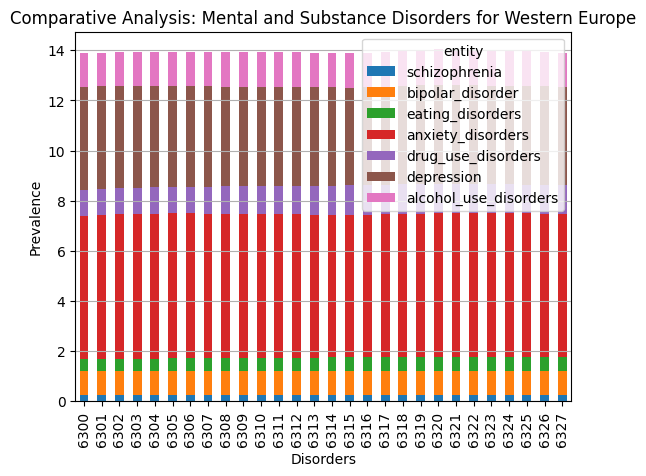

<Figure size 1200x600 with 0 Axes>

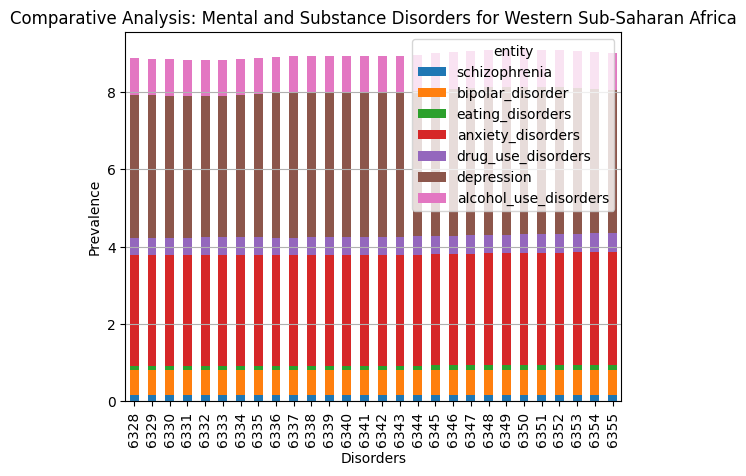

<Figure size 1200x600 with 0 Axes>

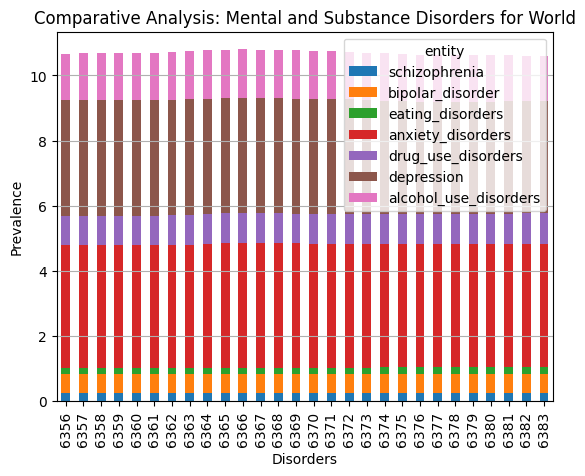

<Figure size 1200x600 with 0 Axes>

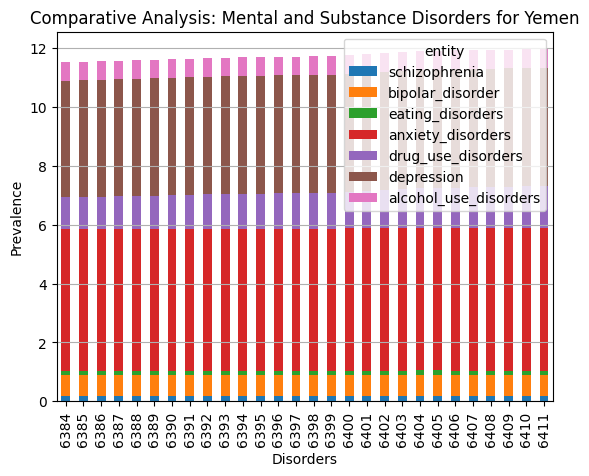

<Figure size 1200x600 with 0 Axes>

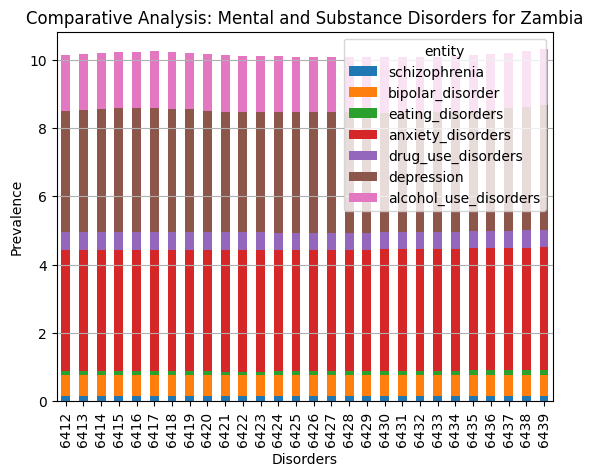

<Figure size 1200x600 with 0 Axes>

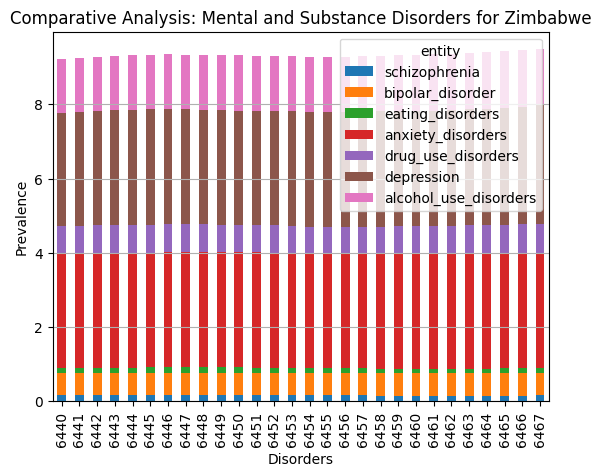

In [49]:
#Comparative Analysis for sheet_name = 'prevalence_by_mental_and_substa'

import pandas as pd
import matplotlib.pyplot as plt

# Load the data from the Excel file
excel_file = '/content/Why are suicide rates so high for men worldwide.xlsx'
sheet_name = 'prevalence_by_mental_and_substa'

# Read the data into a DataFrame
data = pd.read_excel(excel_file, sheet_name=sheet_name)

# Specify the column names you want to analyze
column1 = 'entity'  # Entity or Year
columns_to_compare = ['schizophrenia', 'bipolar_disorder', 'eating_disorders', 'anxiety_disorders', 'drug_use_disorders', 'depression', 'alcohol_use_disorders']

# Iterate through each entity and create a separate bar chart
for entity in data[column1].unique():
    entity_data = data[data[column1] == entity]

    # Create a bar chart for the current entity
    plt.figure(figsize=(12, 6))
    entity_data[columns_to_compare].plot(kind='bar', stacked=True)

    # Customize the plot (add labels and title)
    plt.xlabel('Disorders')
    plt.ylabel('Prevalence')
    plt.title(f'Comparative Analysis: Mental and Substance Disorders for {entity}')
    plt.legend(title=column1)
    plt.grid(axis='y')
    plt.show()